## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "mass_smaller_30"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [5]:
override = False
use_preds = True
save = True
show = True

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


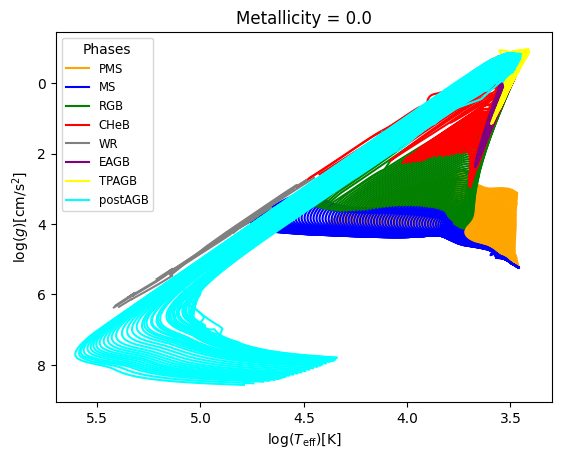

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

In [7]:
print_uniques("star_mass", iso_df)
# print_uniques_count("star_mass", iso_df)

star_mass : 1467117 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
630600,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
630601,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
630602,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
630603,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


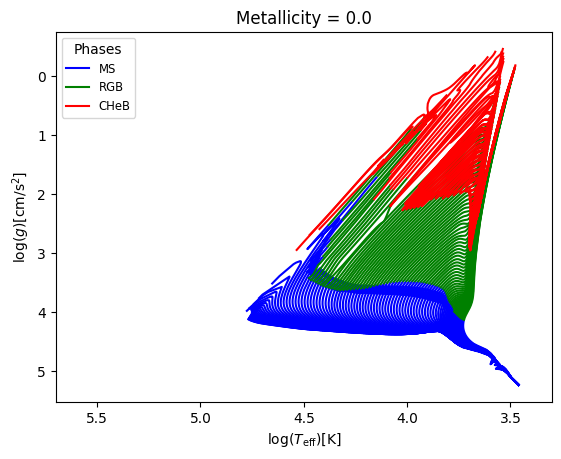

In [8]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [9]:
print_uniques("star_mass", phase_filtered_iso_df)
# print_uniques_count("star_mass", phase_filtered_iso_df)

star_mass : 630605 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
573998,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
573999,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
574000,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
574001,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


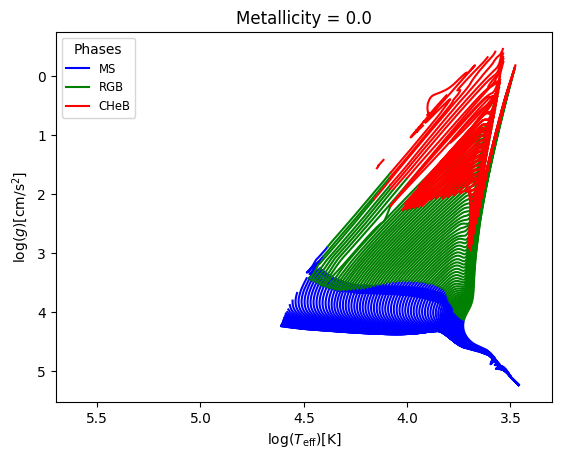

In [10]:
phase_mass_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3], "star_mass" : ("<", 30)})
display(phase_mass_filtered_iso_df)
data_visualiser_phase_age_filtered = Data_visualiser(phase_mass_filtered_iso_df, physical_model)
data_visualiser_phase_age_filtered.plot_Kiel([], [0.0])

In [11]:
print_all_uniques(phase_mass_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.2913, Median : 8.3

log_Teff  : Range : 3.34 - 5.3542, Mean : 3.9814, Median : 3.9163

log_g  : Range : -1.08 - 6.2434, Mean : 3.5356, Median : 3.9078

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 29.9991, Mean : 5.0421, Median : 2.422

log_R  : Range : -1.0 - 3.1298, Mean : 0.6593, Median : 0.6146



In [12]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_mass_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344674699659814 - 5.35416869711927
Median value in train data for the log_Teff parameter: 3.9166402399051377
Mean value in train data for the log_Teff parameter: 3.9816529906854567

Range in train data for the log_g parameter : -1.074853654540692 - 6.24337664072263
Median value in train data for the log_g parameter: 3.908136694420824
Mean value in train data for the log_g parameter: 3.5363261928196046

Range in train data for the log_R parameter : -0.9974628481553472 - 3.1297545143214007
Median value in train data for the log_R parameter: 0.6141166990407836
Mean value in train data for the log_R parameter: 0.6589225905346424

Testing set statistics:
Range in test data for the log_Teff parameter : 3.344668191350628 - 5.351349793152065
Median value in test data for the log_Teff parameter: 3.9152004393928688
Mean value in test data for the log_Teff parameter: 3.980564591402409

Range in test data for the log_g par

## Model training

### Linear regression

In [13]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.898172986424315
  RVE :  0.7406448531726071
  RMSE :  0.16967303216105323
  MAE :  0.14250251797256588
  MedAE :  0.1425896177417485
  CORR :  0.860607263674211
  MAX_ER :  0.7467695942643706
  Percentiles : 
    75th percentile :  0.20116616680487565
    90th percentile :  0.2436665904609678
    95th percentile :  0.26760638031608136
    99th percentile :  0.43833021406045497

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.674979048906864
  RVE :  0.7780911436680794
  RMSE :  0.13675112882060683
  MAE :  0.10625332225729159
  MedAE :  0.08979314285466788
  CORR :  0.8824147064251623
  MAX_ER :  0.6855983449410066
  Percentiles : 
    75th percentile :  0.14427474968538823
    90th percentile :  0.20588230277787342
    95th percentile :  0.26343049579331684
    99th pe

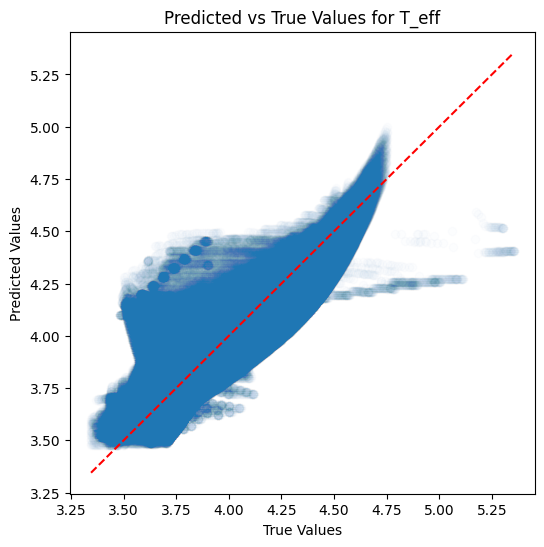

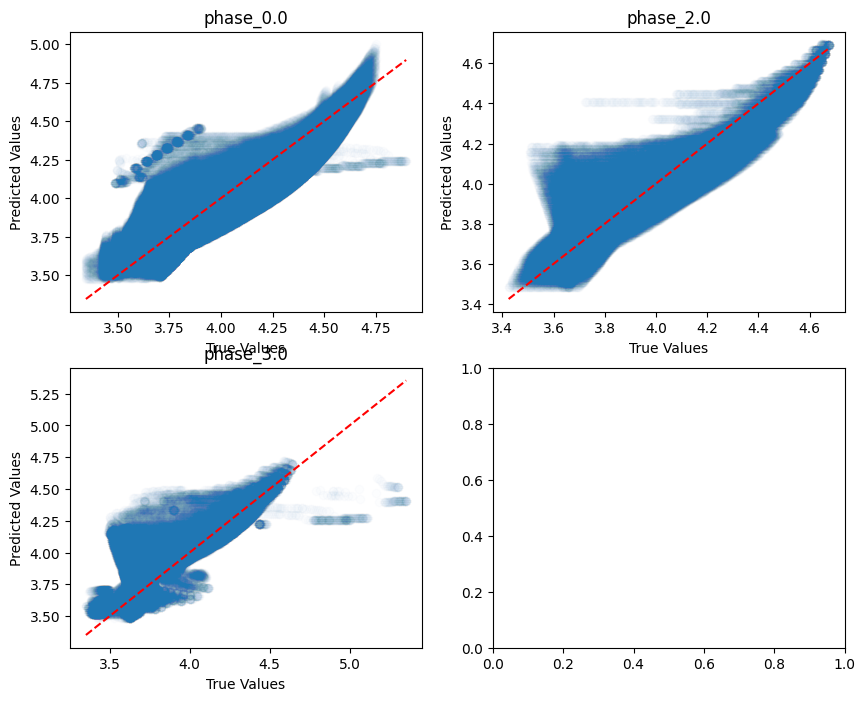

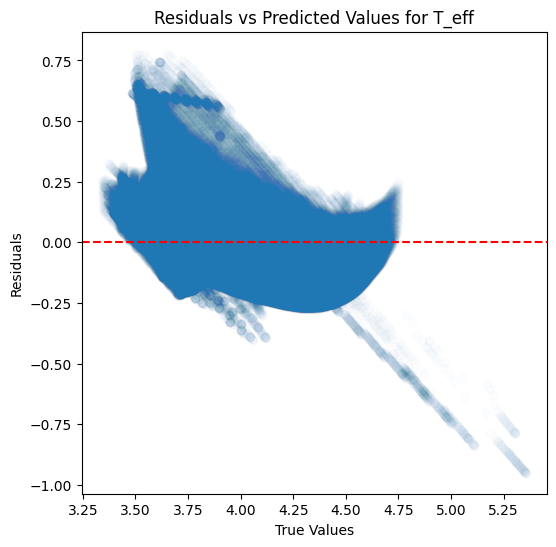

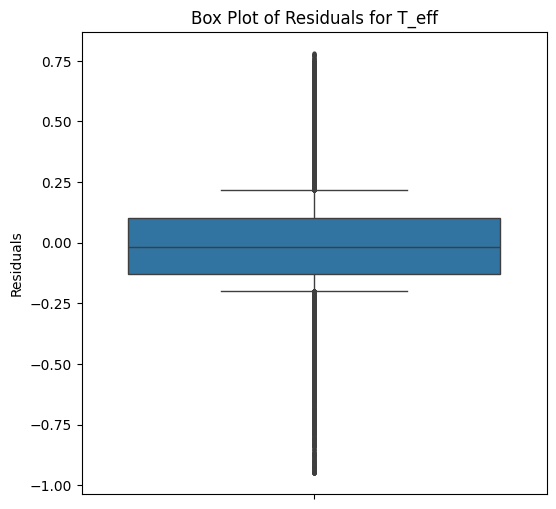

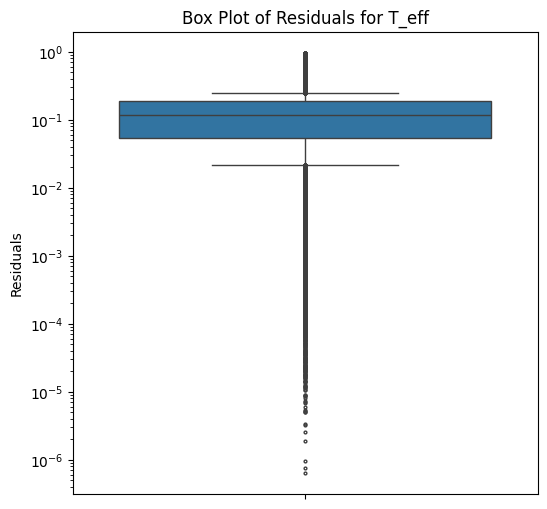

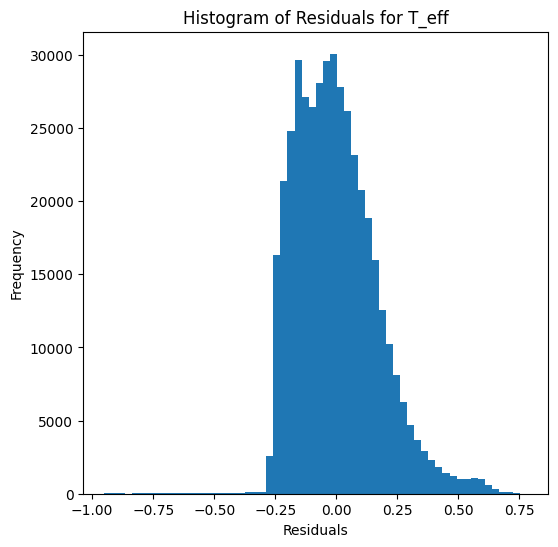

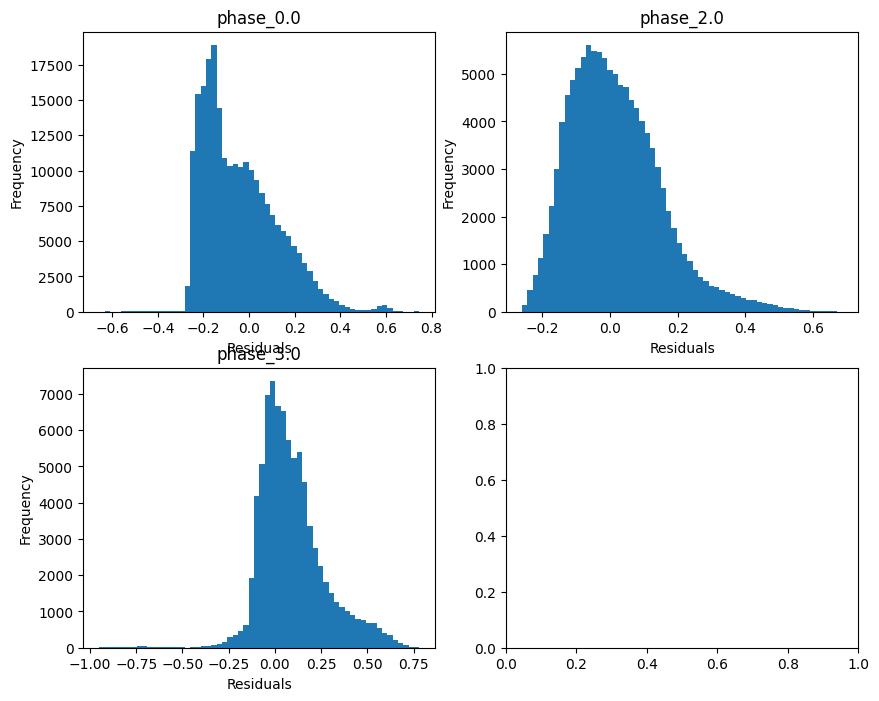

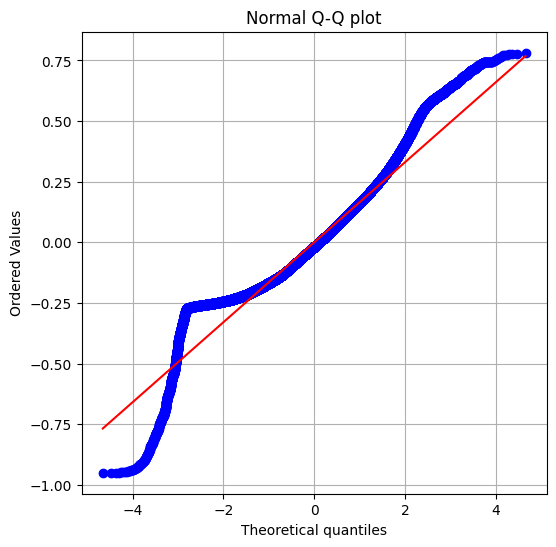

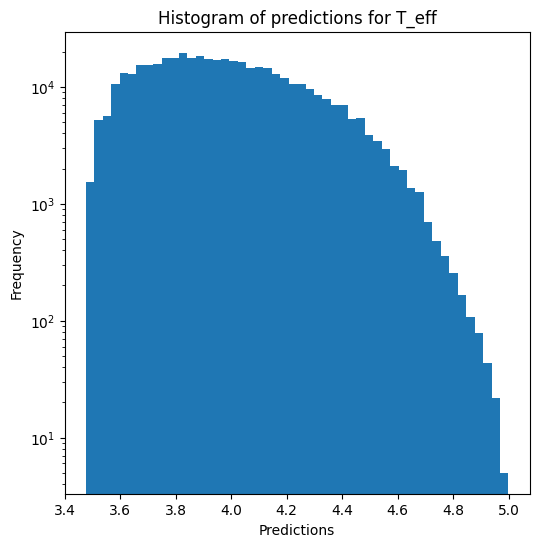

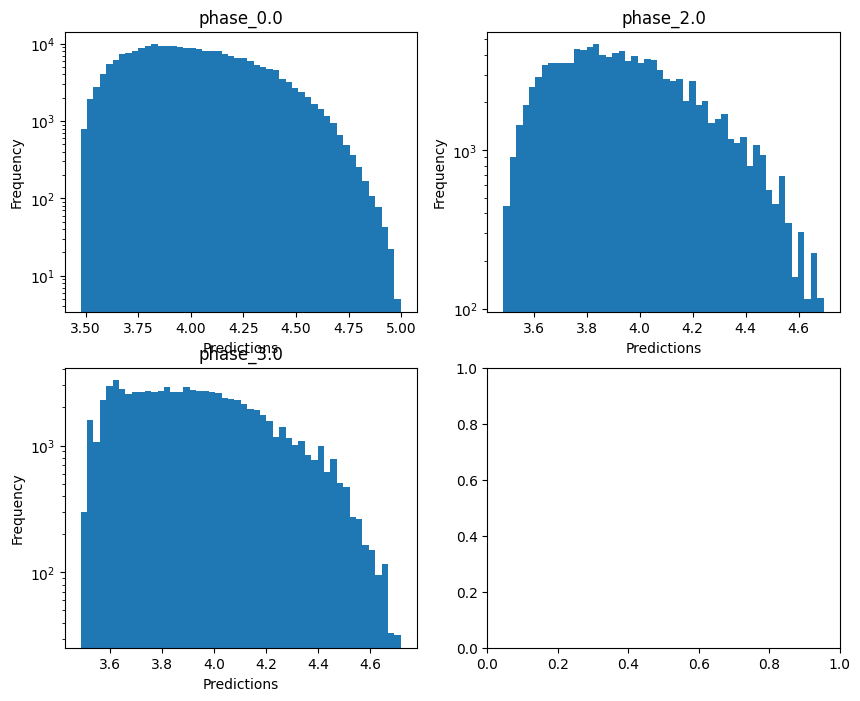

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433070637654307
  RVE :  -0.09979128547079386
  RMSE :  0.9551382891375891
  MAE :  0.7863923824820758
  MedAE :  0.6525715089604771
  CORR :  0.4411502617745956
  MAX_ER :  3.7385790583912266
  Percentiles : 
    75th percentile :  1.1125574555555335
    90th percentile :  1.6102939084867611
    95th percentile :  1.841813847073607
    99th percentile :  2.204139747765259

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.12370500206716573
  RMSE :  1.068133661697856
  MAE :  0.8320436092786279
  MedAE :  0.6599765388693593
  CORR :  0.3711145323223116
  MAX_ER :  3.140067699720127
  Percentiles : 
    75th percentile :  1.2358663540494075
    90th percentile :  1.8733486055482969
    95th percentile :  2.2141677341284214
    99th percentile :  2.591965452685804

log_g results for the phase cat

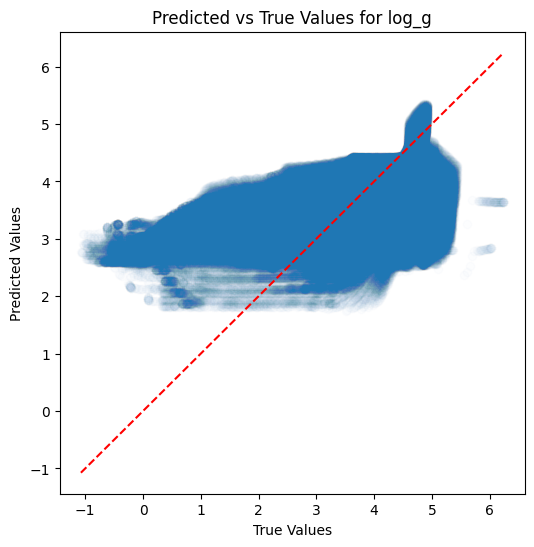

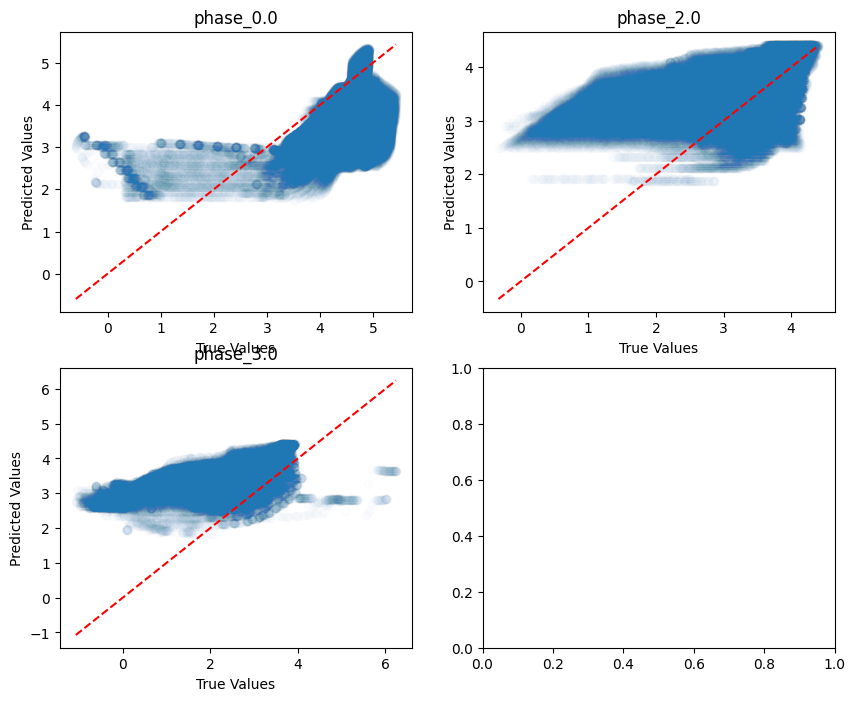

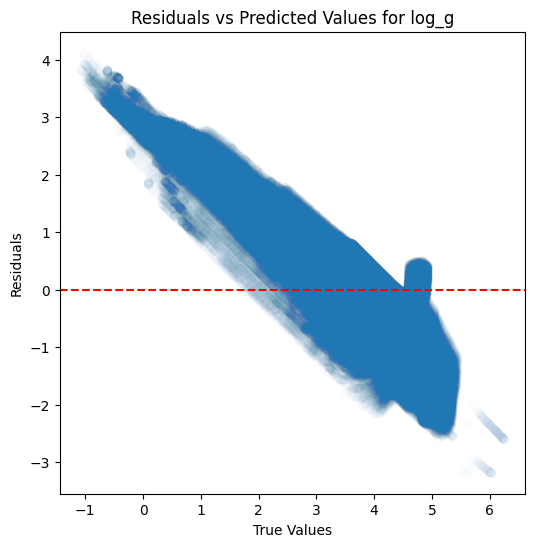

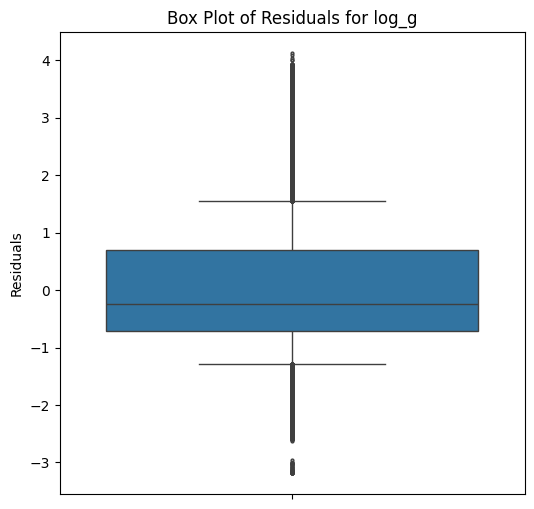

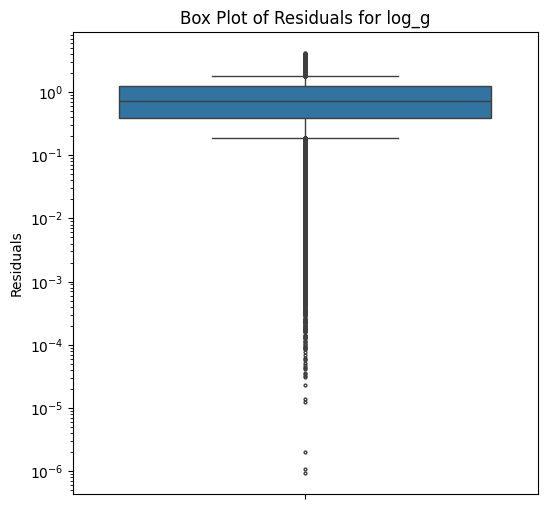

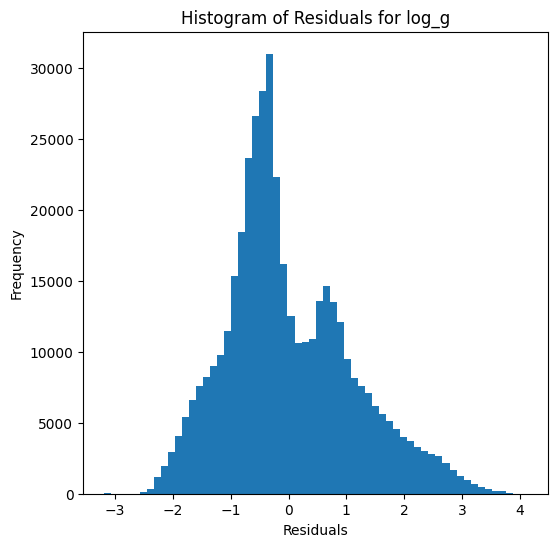

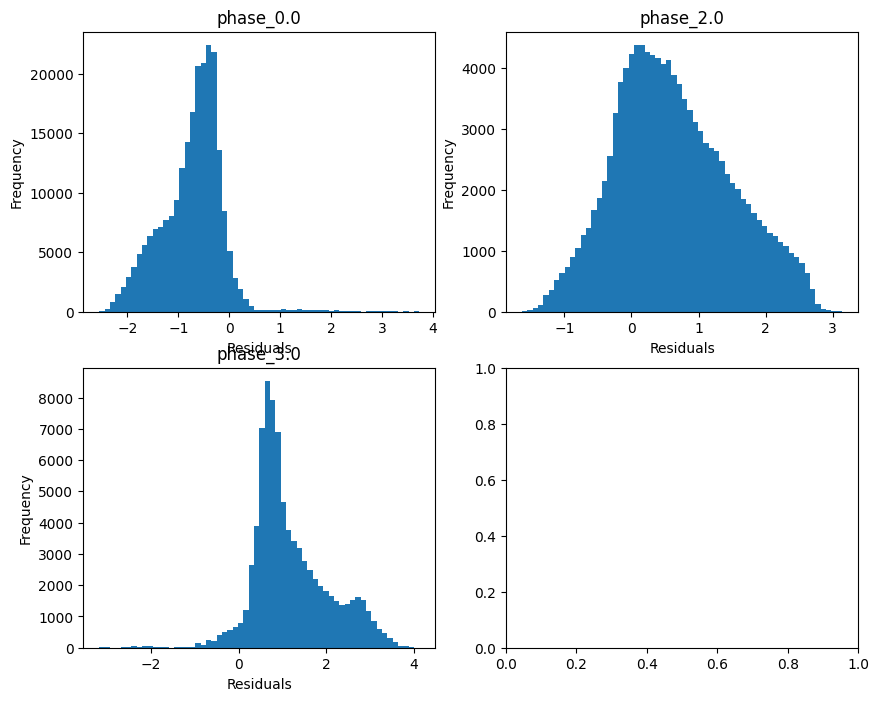

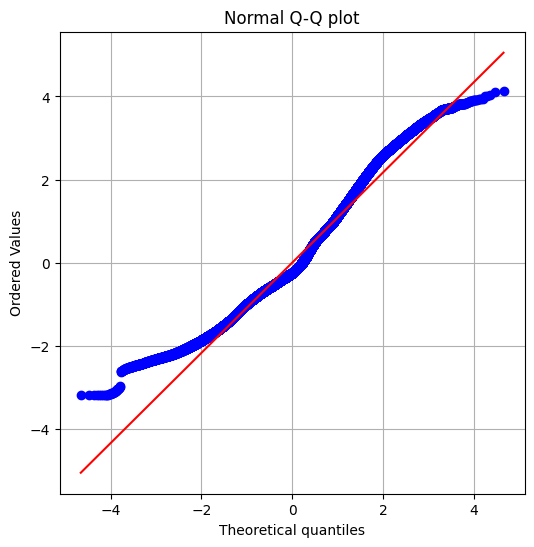

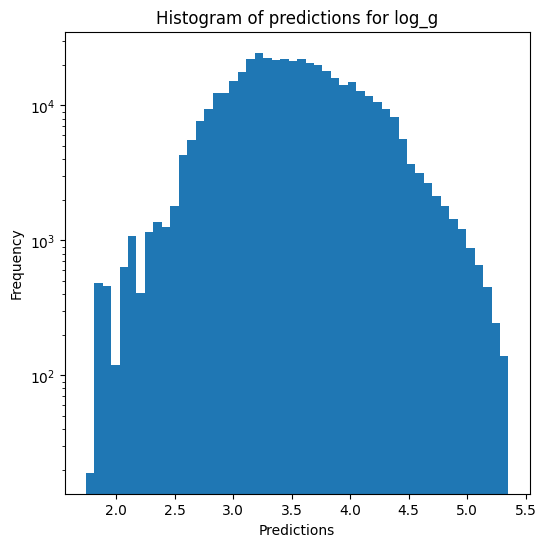

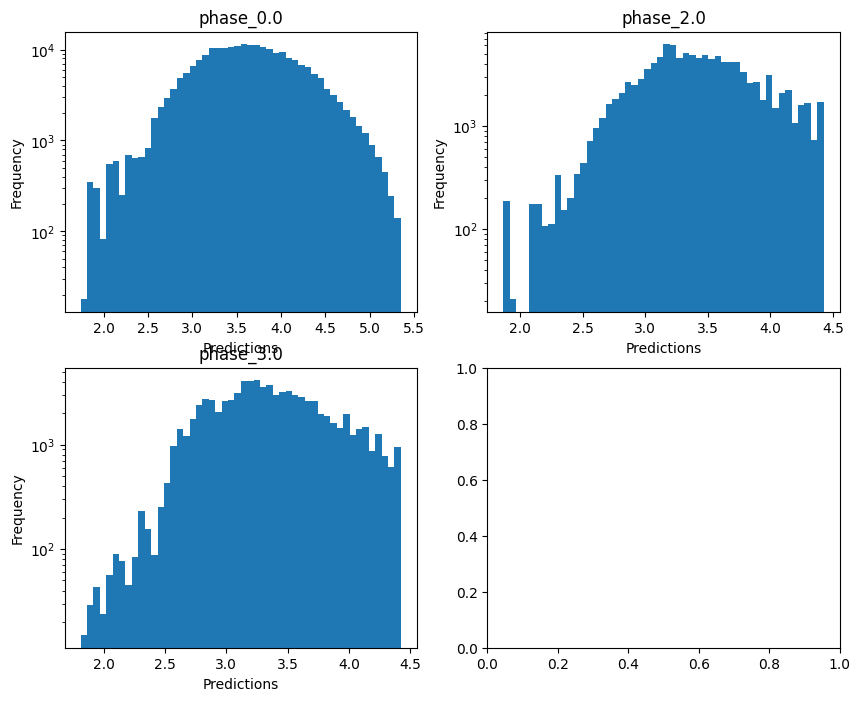


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.43522613091488316
  RMSE :  0.5628391070895539
  MAE :  0.4411554747487788
  MedAE :  0.33732924384358776
  CORR :  0.6630070969610159
  MAX_ER :  1.9044430546561935
  Percentiles : 
    75th percentile :  0.6554436105418248
    90th percentile :  0.9704043415637779
    95th percentile :  1.1547641093750678
    99th percentile :  1.422036123428775

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.03933893202957717
  RMSE :  0.5819336210246708
  MAE :  0.46678582133655916
  MedAE :  0.39417172393681366
  CORR :  0.3884618763855989
  MAX_ER :  1.6157065208145722
  Percentiles : 
    75th percentile :  0.6886049589464387
    90th percentile :  0.9979751308668282
    95th percentile :  1.1596100915261305
    99th percentile :  1.337520334145543

radius results for the phase category with a

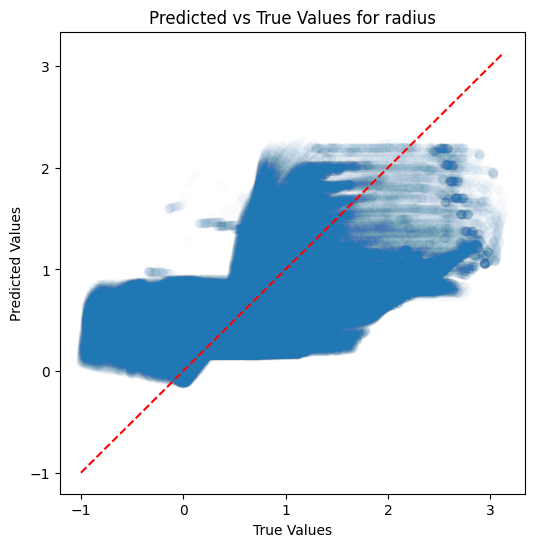

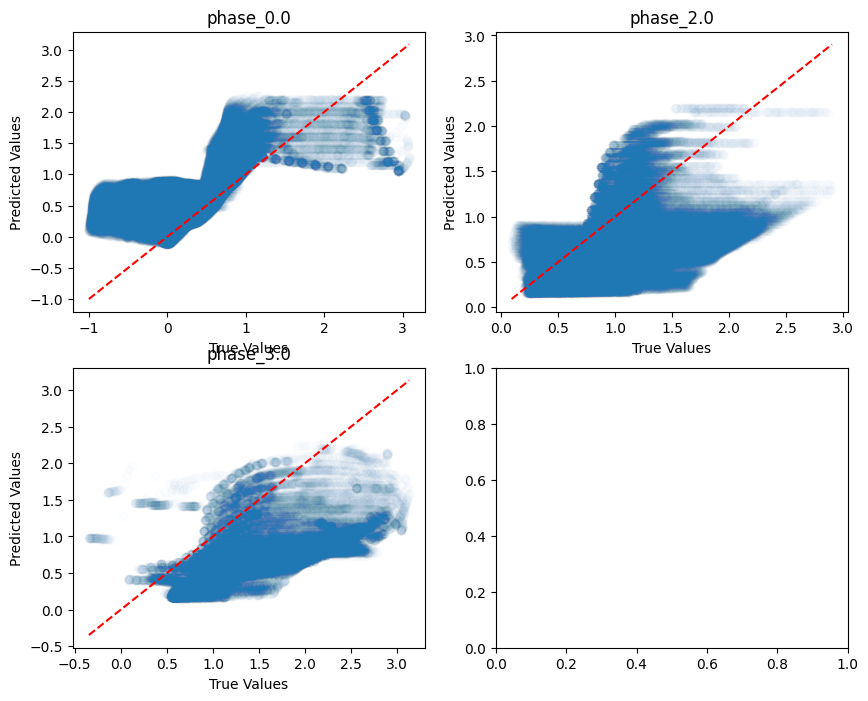

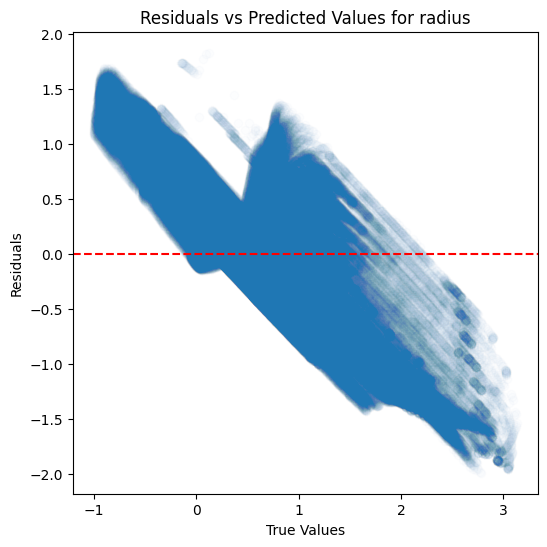

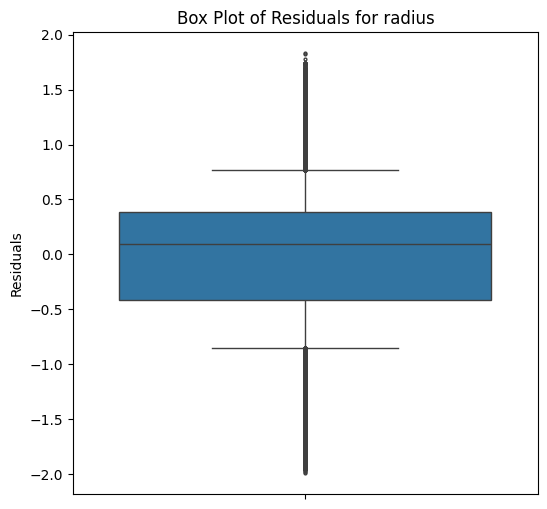

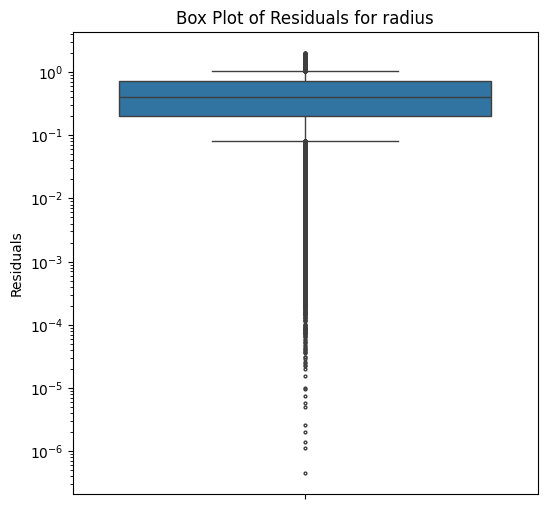

...

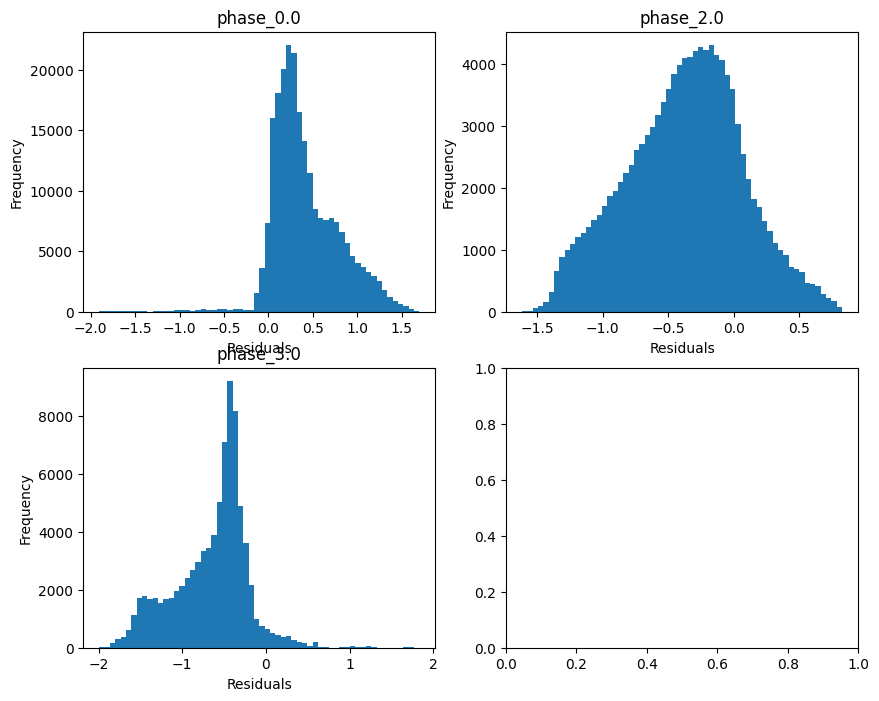

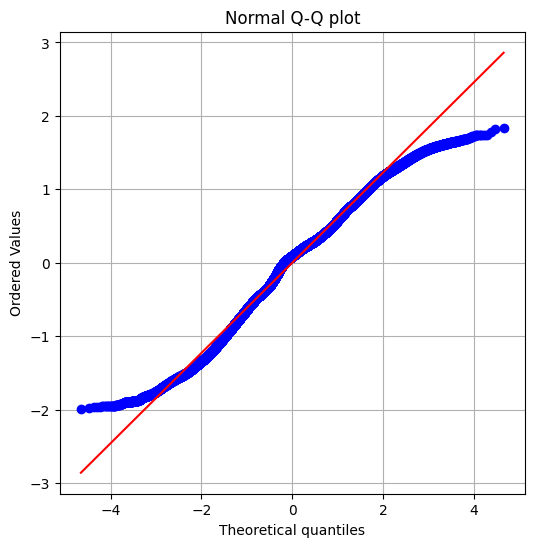

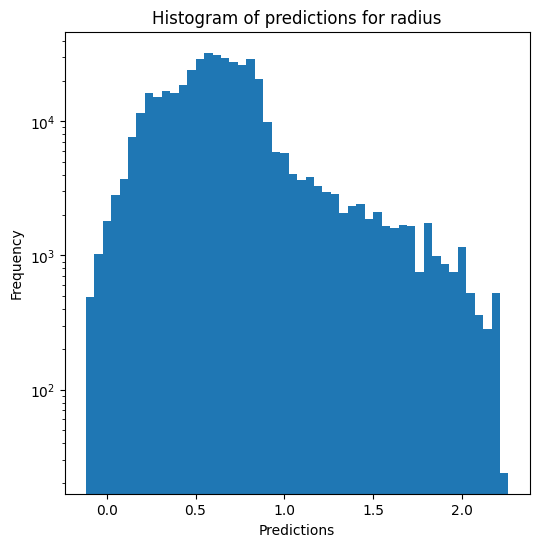

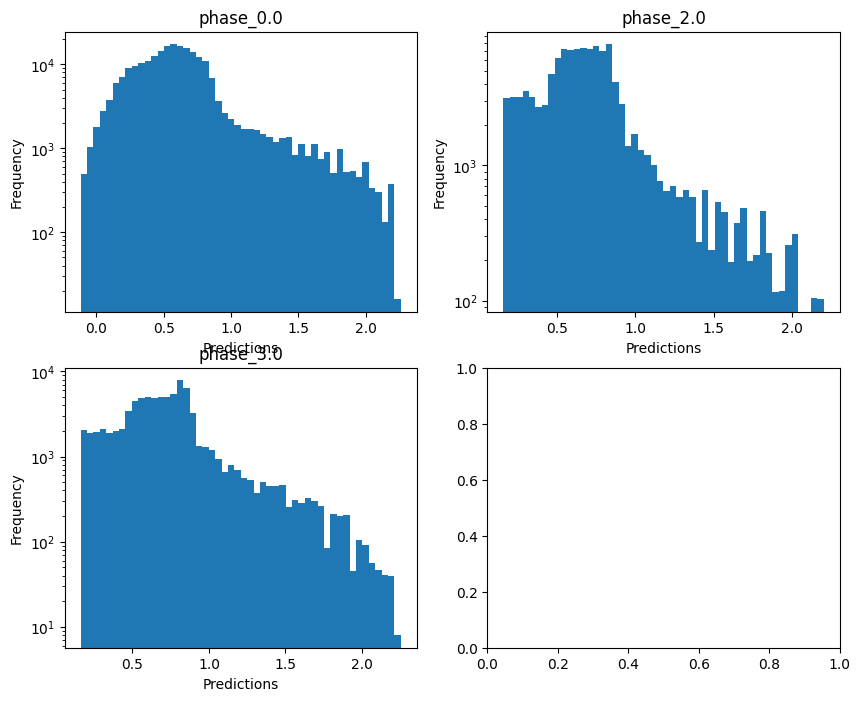

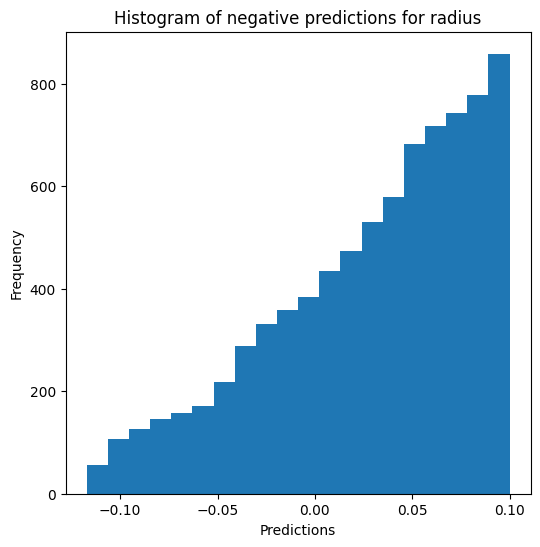

Saving results...


In [14]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show) # override=False, use_preds=True

### Decision tree

In [15]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.898172986424315
  RVE :  0.9582341974433609
  RMSE :  0.06634053974819228
  MAE :  0.010136413301371086
  MedAE :  0.0010721717675321596
  CORR :  0.9793749005612634
  MAX_ER :  0.95102064134635
  Percentiles : 
    75th percentile :  0.002367029366954654
    90th percentile :  0.0042754416692849075
    95th percentile :  0.00946446223011032
    99th percentile :  0.28001358146435784

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.674979048906864
  RVE :  0.950040177707055
  RMSE :  0.06444523120084311
  MAE :  0.0249603445105185
  MedAE :  0.0034055866756617093
  CORR :  0.9748900383540647
  MAX_ER :  0.864869785313644
  Percentiles : 
    75th percentile :  0.010011233813866482
    90th percentile :  0.08772513092790109
    95th percentile :  0.14107447154236075
    

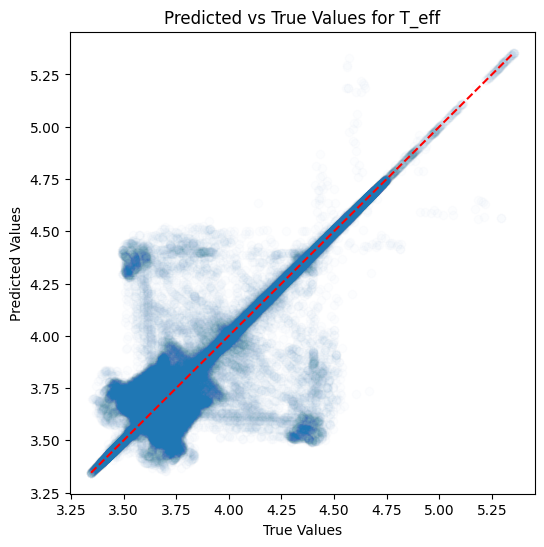

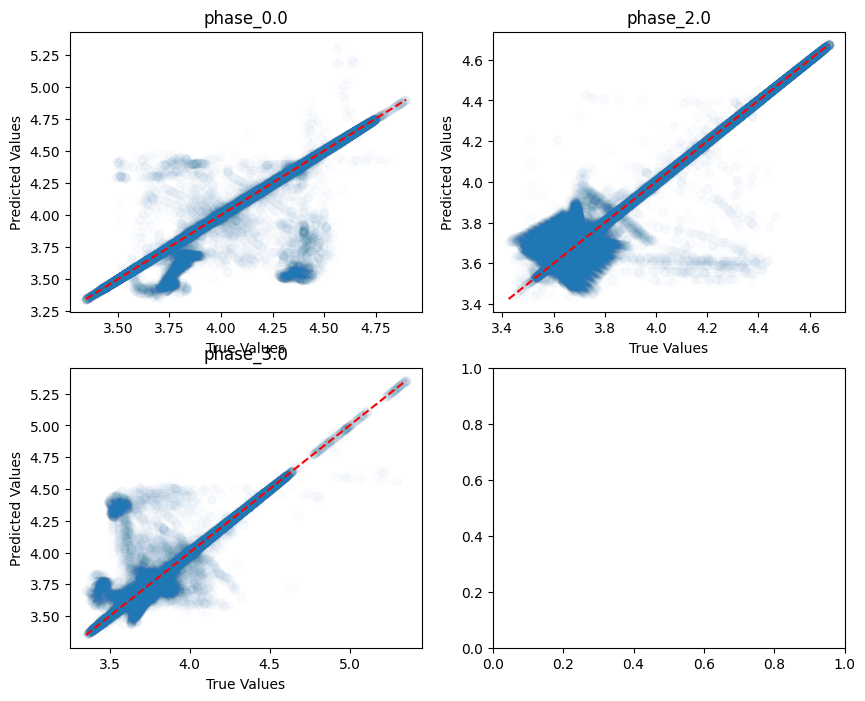

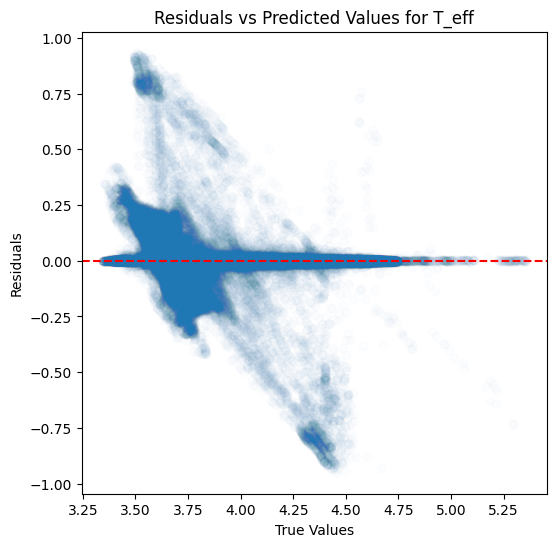

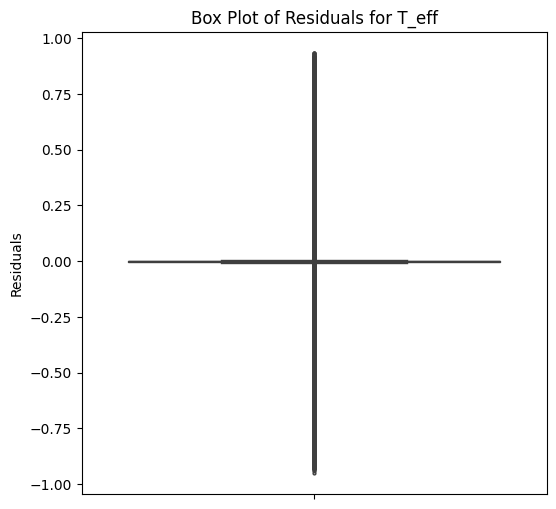

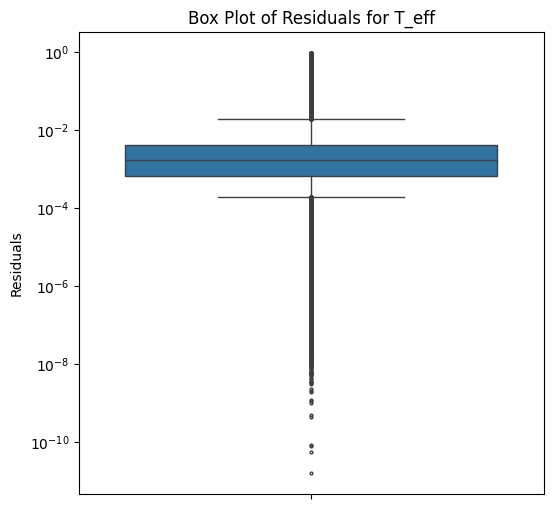

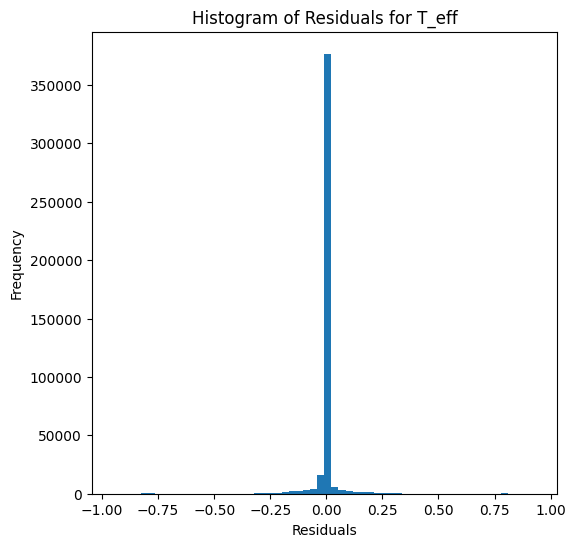

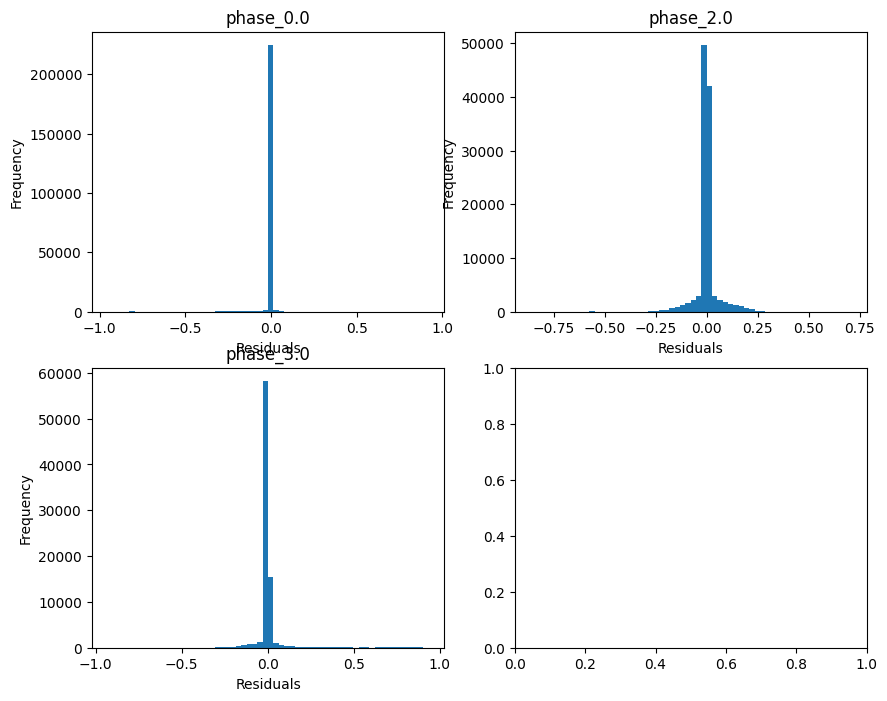

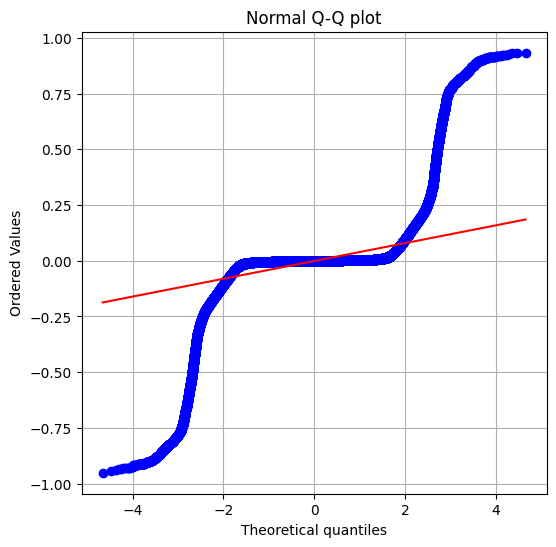

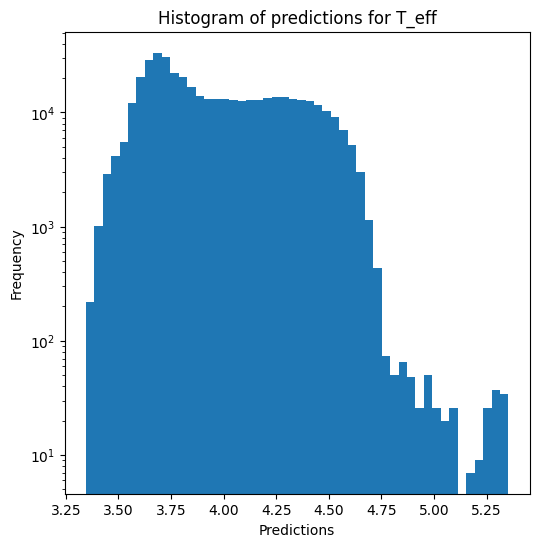

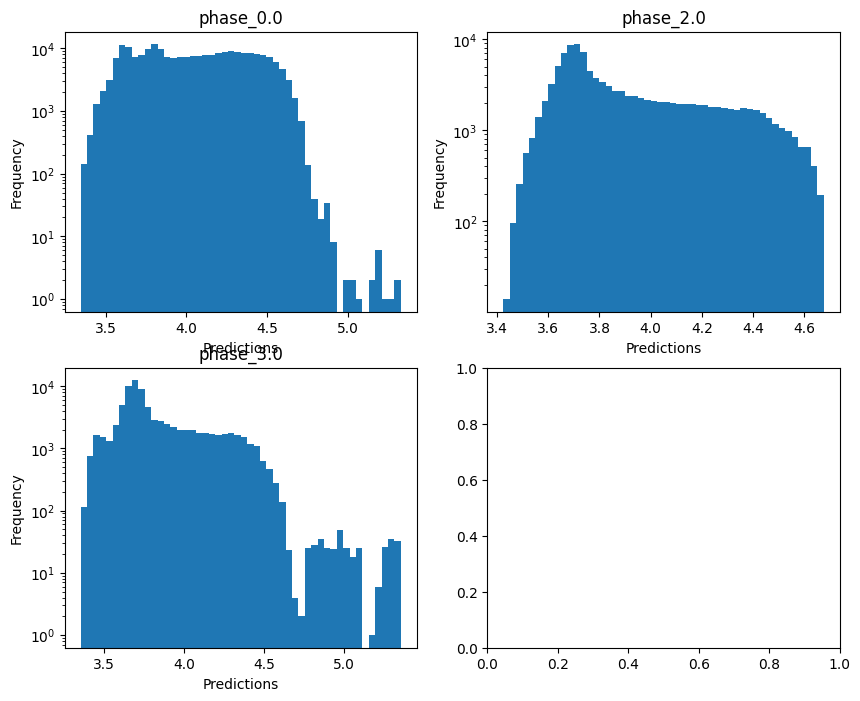


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433070637654307
  RVE :  0.37615329194584457
  RMSE :  0.46735132352807074
  MAE :  0.07053986412626687
  MedAE :  0.003842108018422996
  CORR :  0.7877792937070838
  MAX_ER :  5.649837081864775
  Percentiles : 
    75th percentile :  0.00767018168729483
    90th percentile :  0.014365310744874642
    95th percentile :  0.027736151320450583
    99th percentile :  3.2062982916436473

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.0377295775830393
  RMSE :  0.9046696484499269
  MAE :  0.3857371708295573
  MedAE :  0.0168135361208388
  CORR :  0.5165791626752562
  MAX_ER :  4.637418133429539
  Percentiles : 
    75th percentile :  0.10190305045817238
    90th percentile :  1.6481324181975812
    95th percentile :  2.4504485351167613
    99th percentile :  3.495642057474998

log_g results for the phase category wit

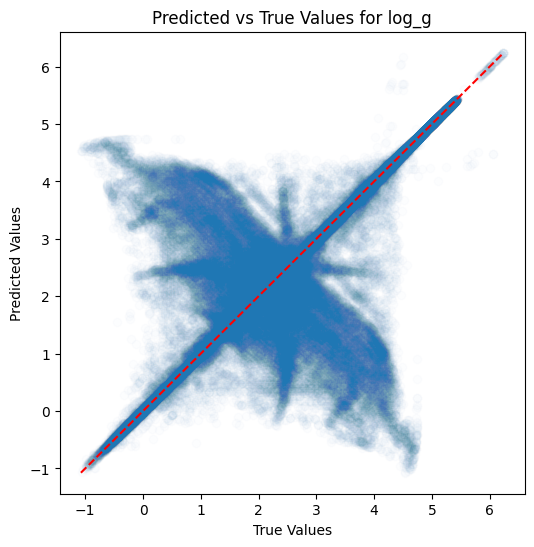

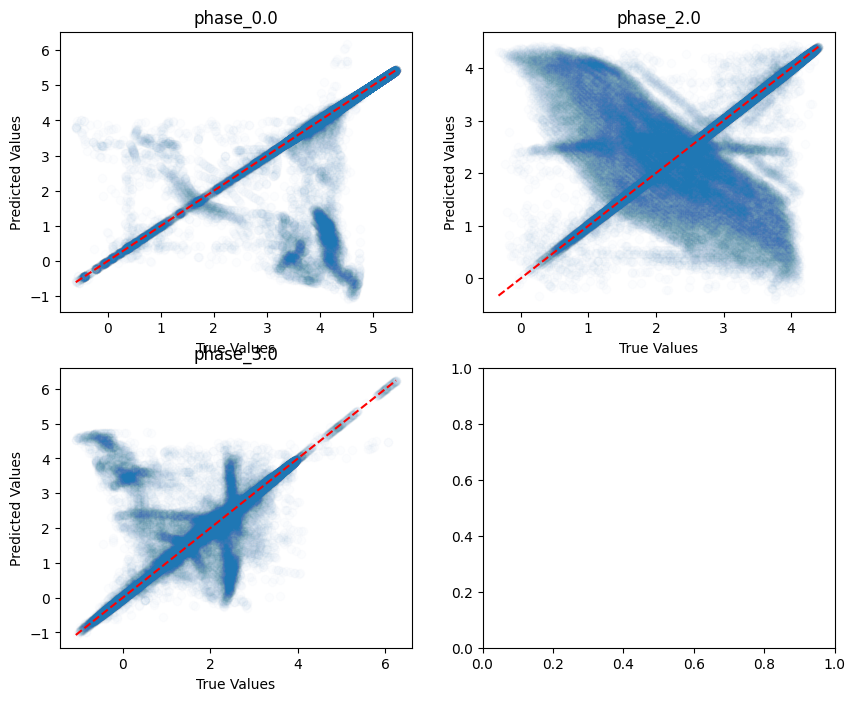

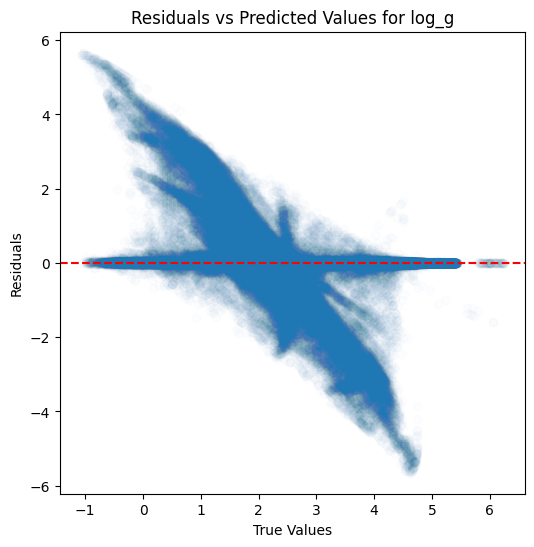

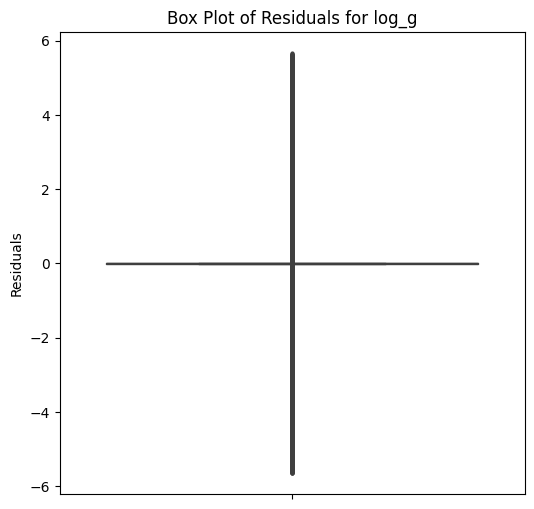

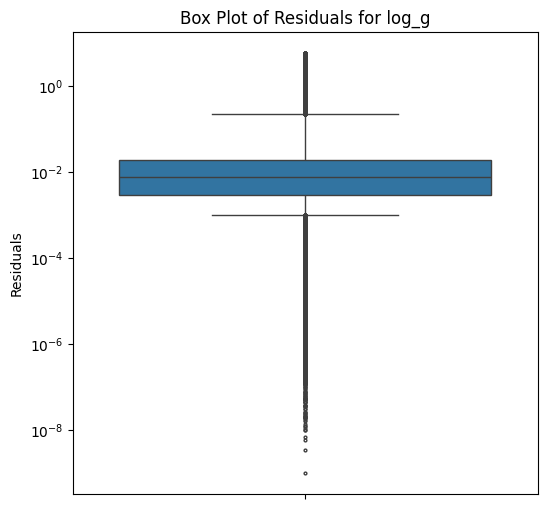

...

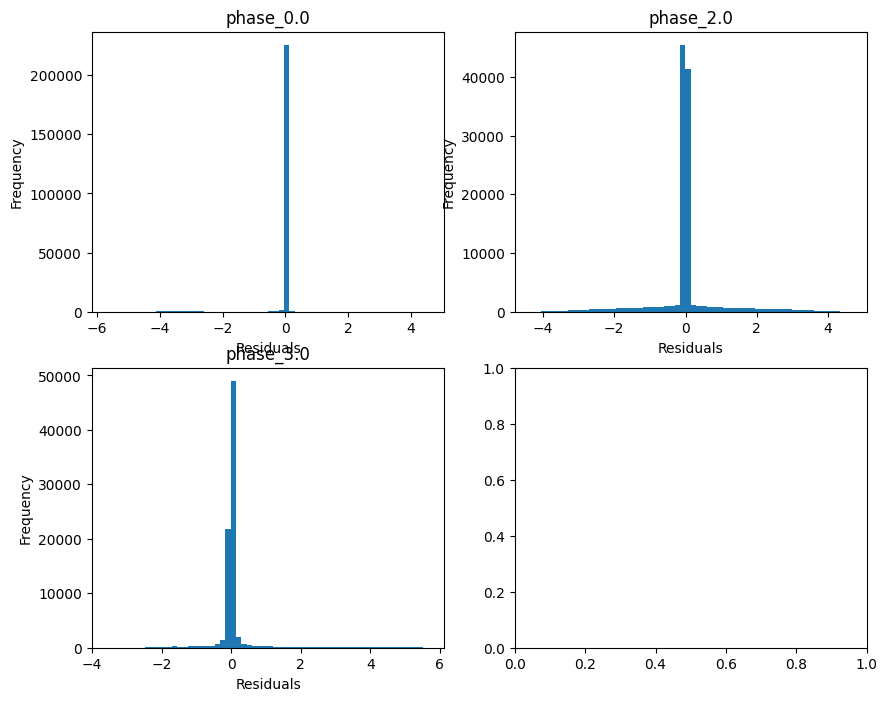

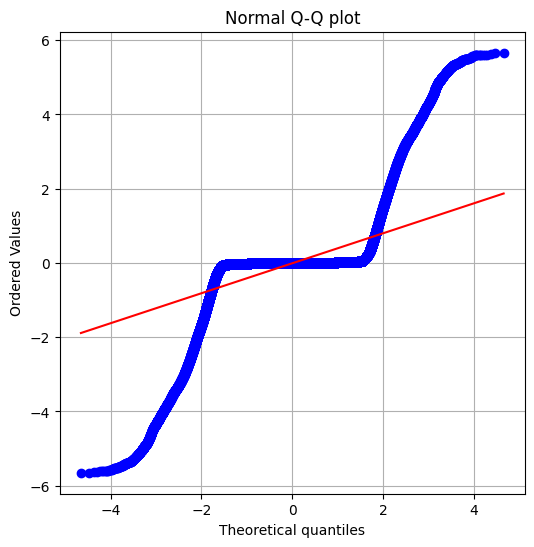

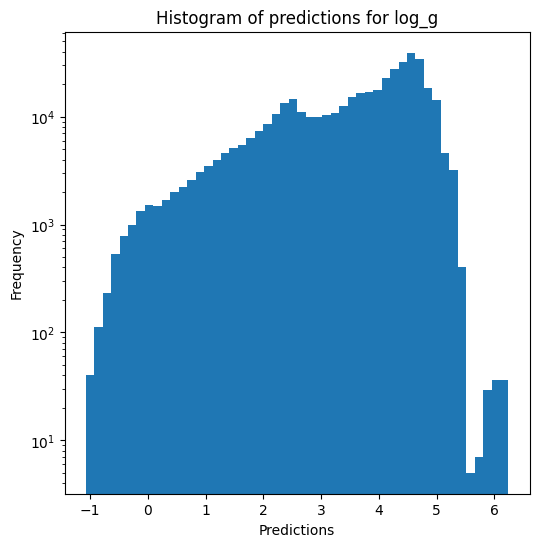

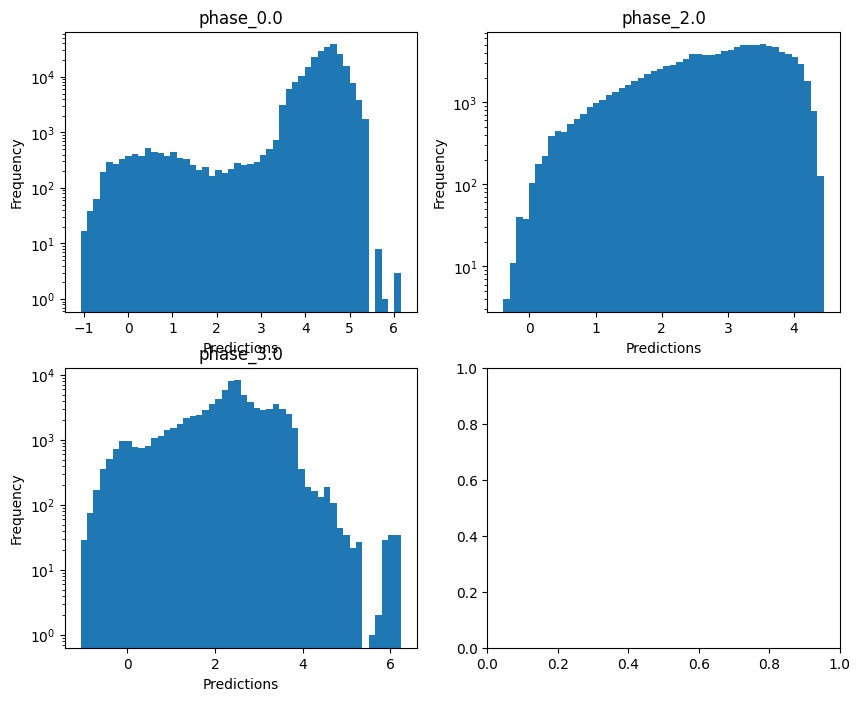

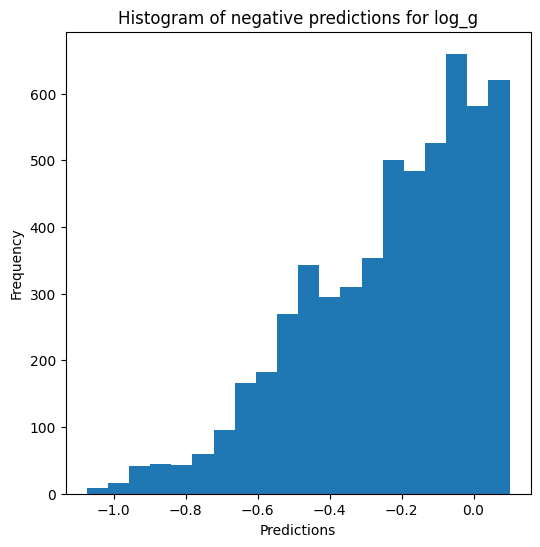


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.7889707604937268
  RMSE :  0.2338327237494861
  MAE :  0.03607655675100245
  MedAE :  0.0026504994455325837
  CORR :  0.908472573531127
  MAX_ER :  2.828540989122026
  Percentiles : 
    75th percentile :  0.0049648331609654095
    90th percentile :  0.00913168944538474
    95th percentile :  0.015786120611805184
    99th percentile :  1.605762510123537

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.008940780881484534
  RMSE :  0.4523236677674535
  MAE :  0.19287435162863242
  MedAE :  0.008423032576514666
  CORR :  0.5175122906926821
  MAX_ER :  2.3190299467163435
  Percentiles : 
    75th percentile :  0.05121709539252528
    90th percentile :  0.8240721569165067
    95th percentile :  1.2250693436916456
    99th percentile :  1.7477195570484991

radius results for the phase categ

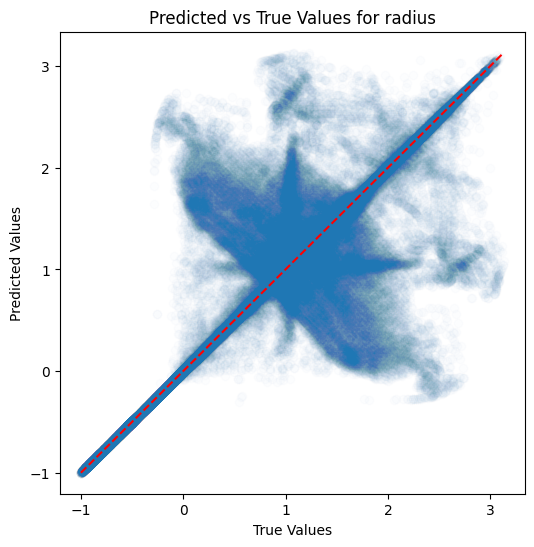

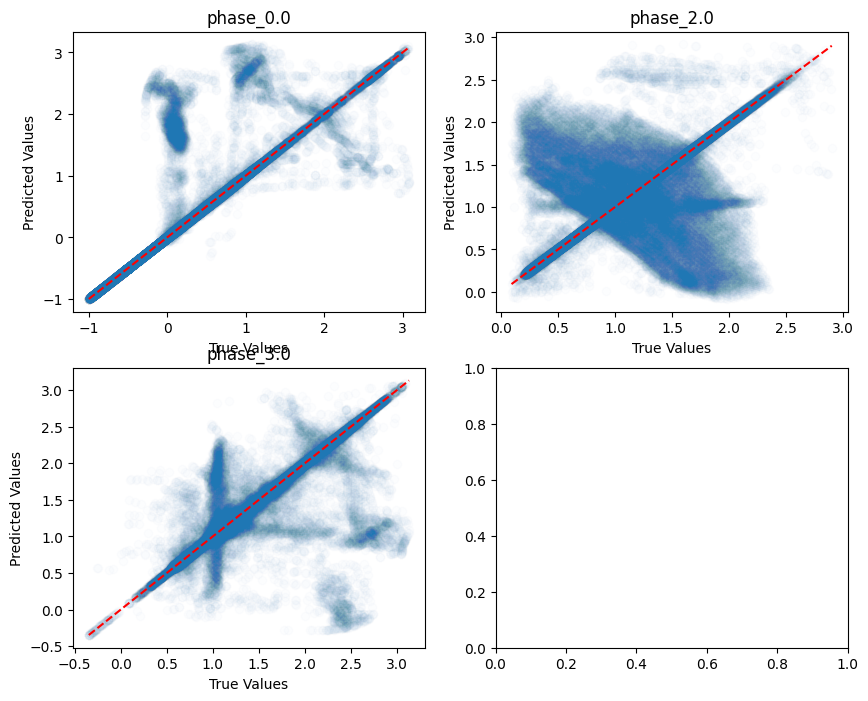

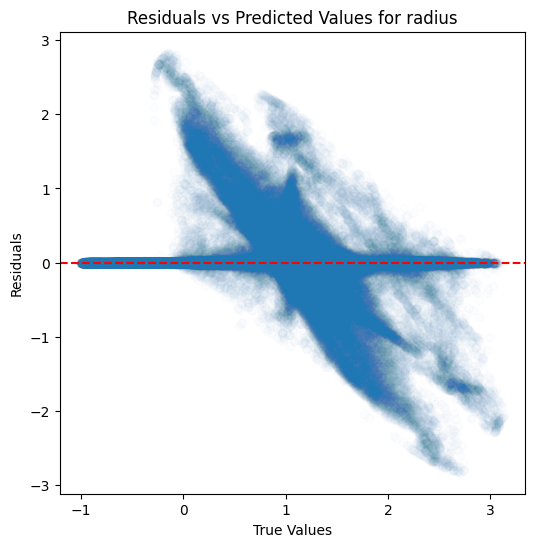

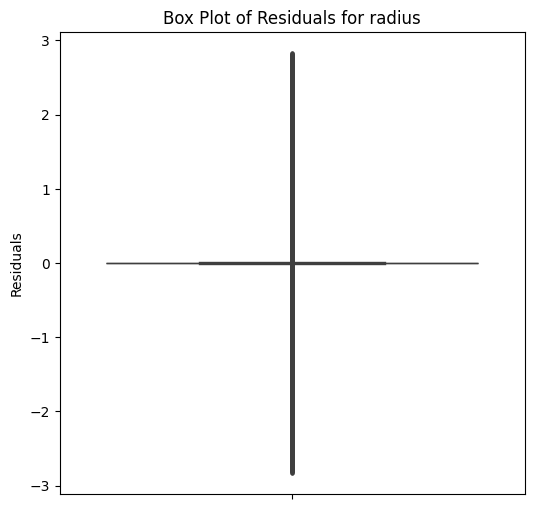

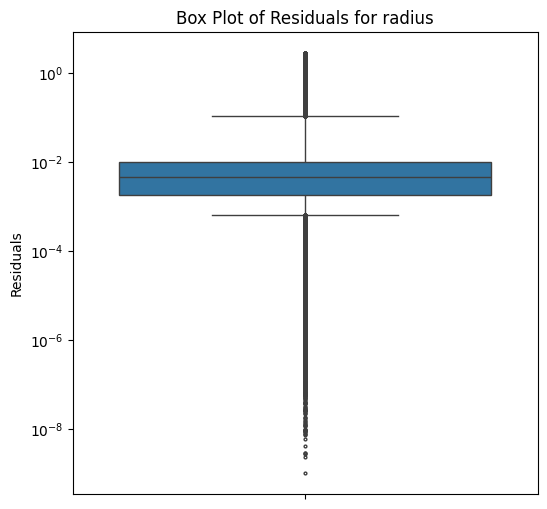

...

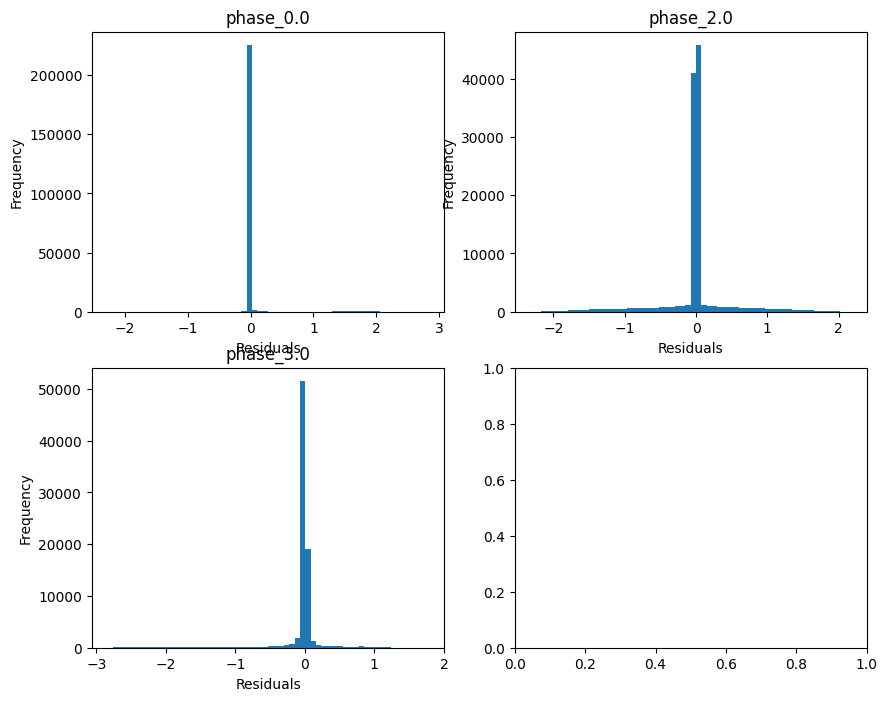

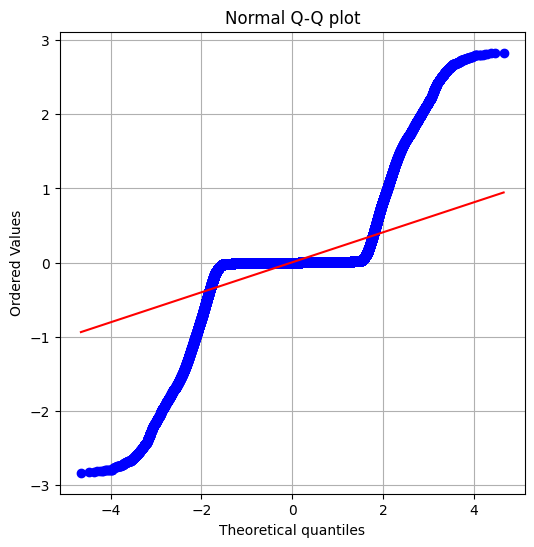

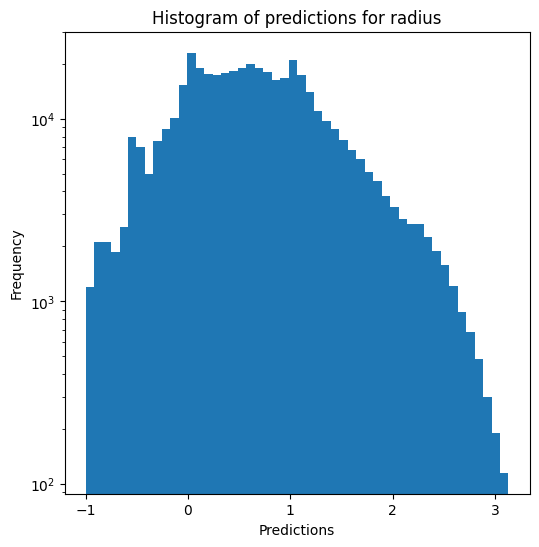

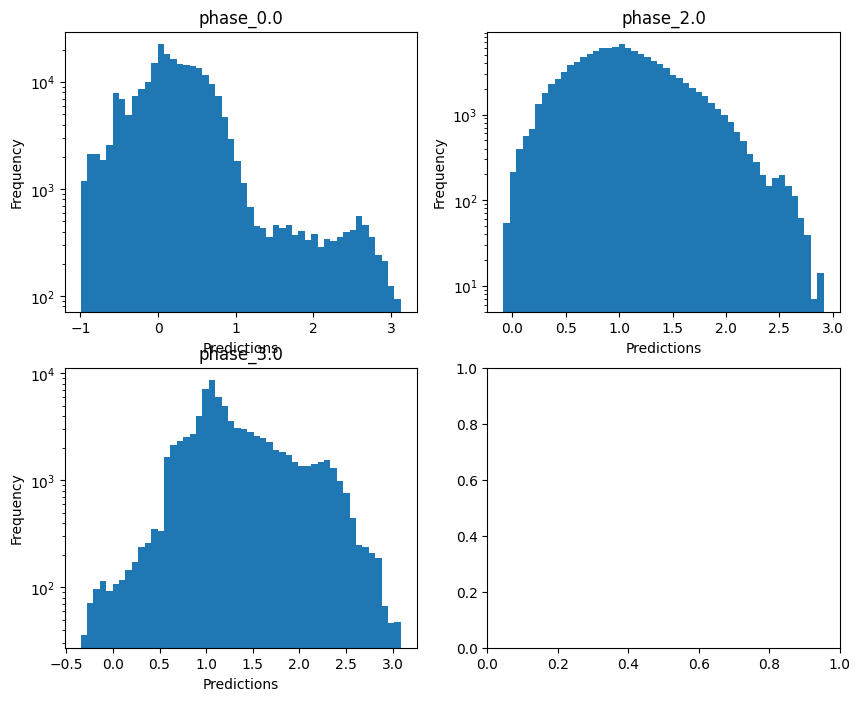

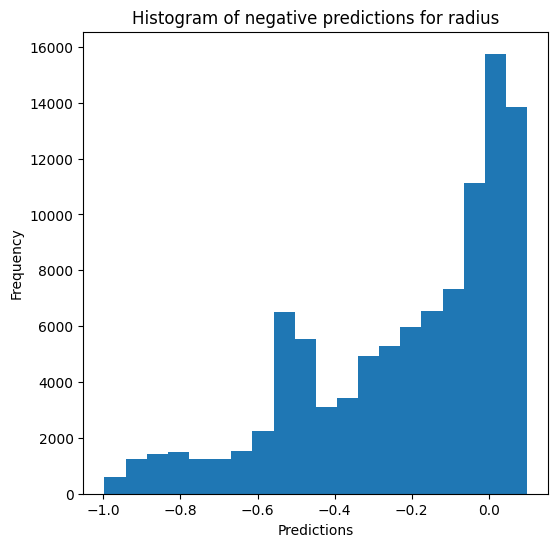

Saving results...


In [16]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### K-nearest neighbours

In [17]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.898172986424315
  RVE :  0.9728075806473458
  RMSE :  0.05381836352178496
  MAE :  0.011252775425390512
  MedAE :  0.0010449986730023397
  CORR :  0.9863328468493693
  MAX_ER :  0.9199027644564692
  Percentiles : 
    75th percentile :  0.002627108289686264
    90th percentile :  0.007617928901253904
    95th percentile :  0.04413969081854046
    99th percentile :  0.27509680811507353

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.674979048906864
  RVE :  0.9813881424175489
  RMSE :  0.03933713008953349
  MAE :  0.017051501704896617
  MedAE :  0.002294000475968172
  CORR :  0.9906617575492623
  MAX_ER :  0.6982712559370272
  Percentiles : 
    75th percentile :  0.011931797904843666
    90th percentile :  0.05915162679866136
    95th percentile :  0.09294734003012378


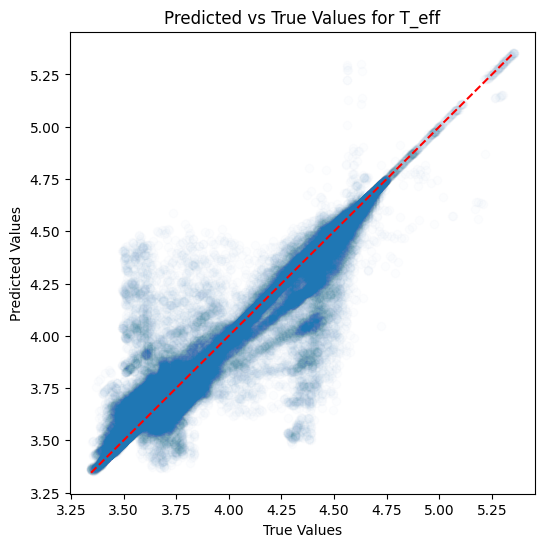

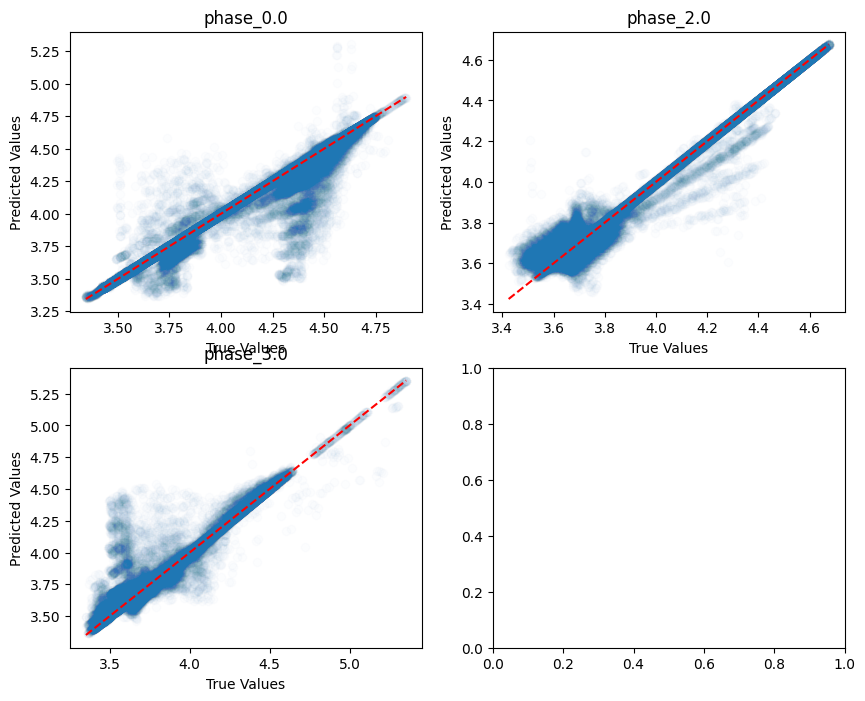

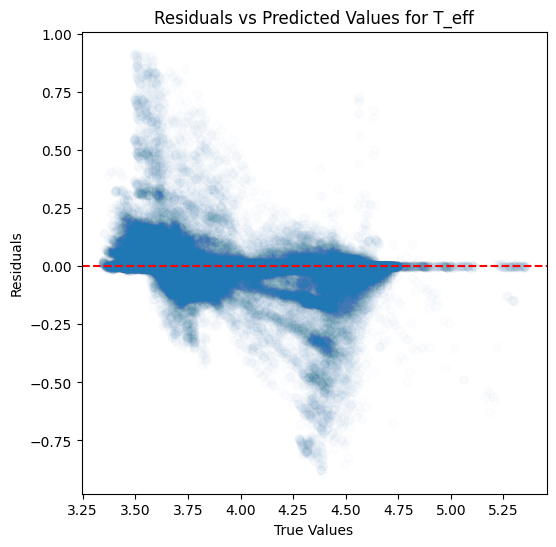

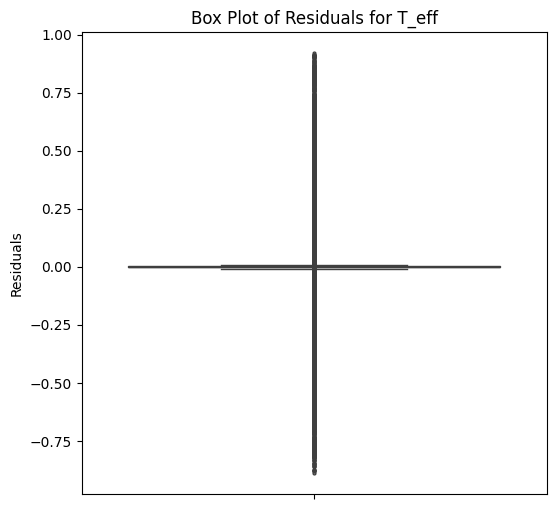

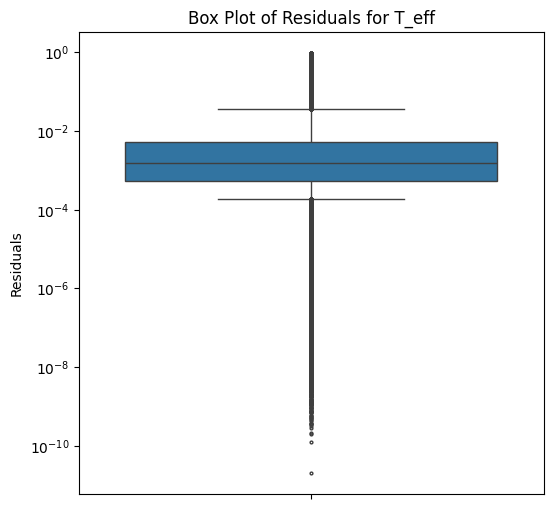

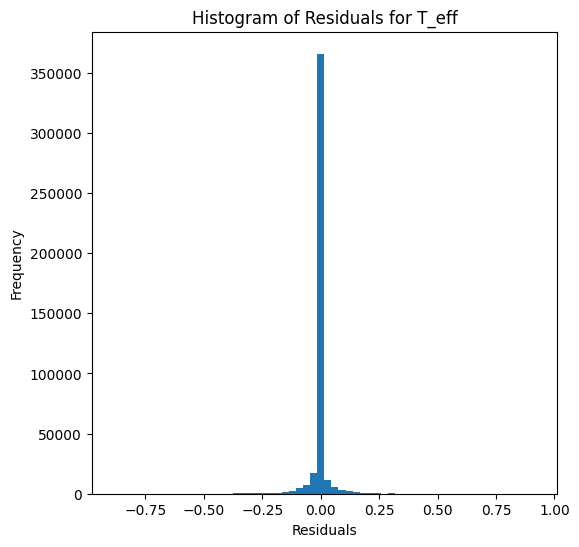

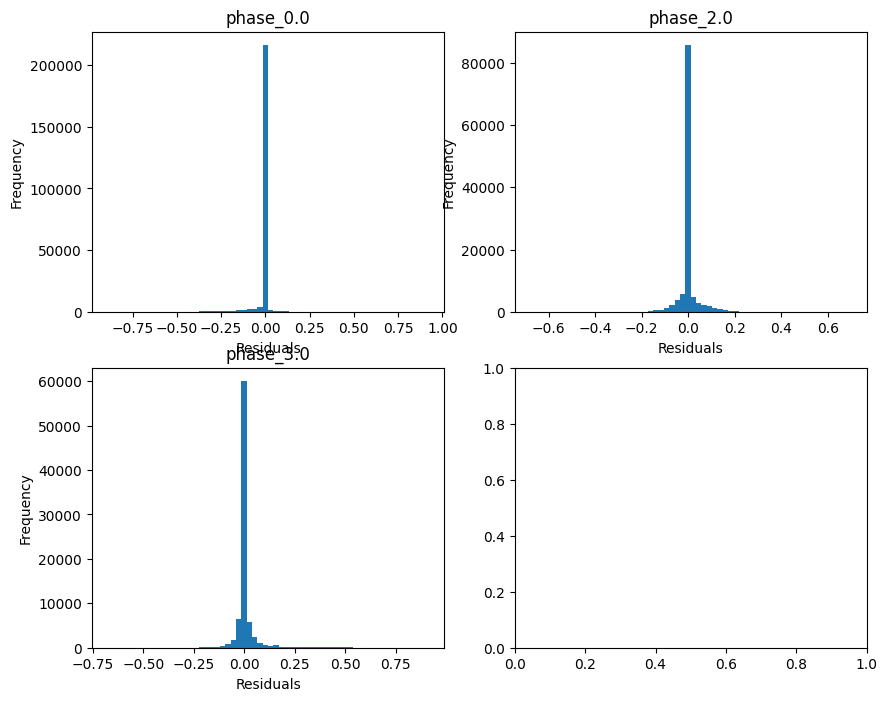

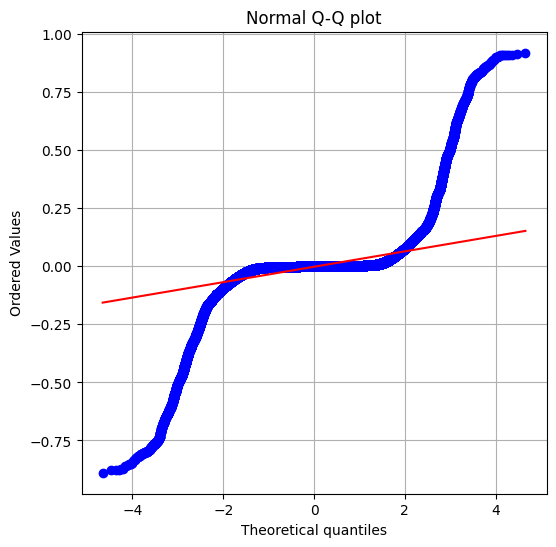

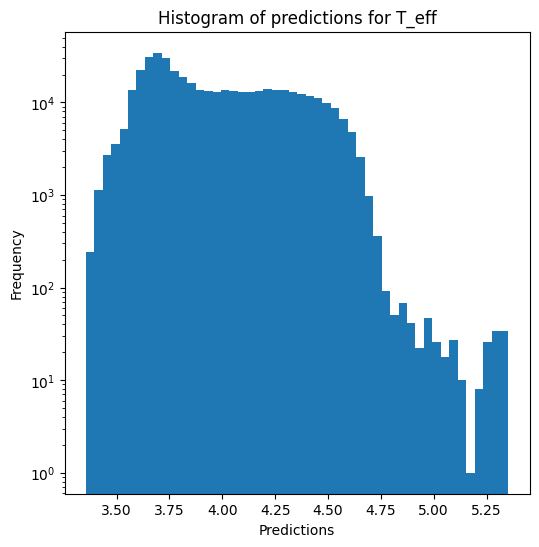

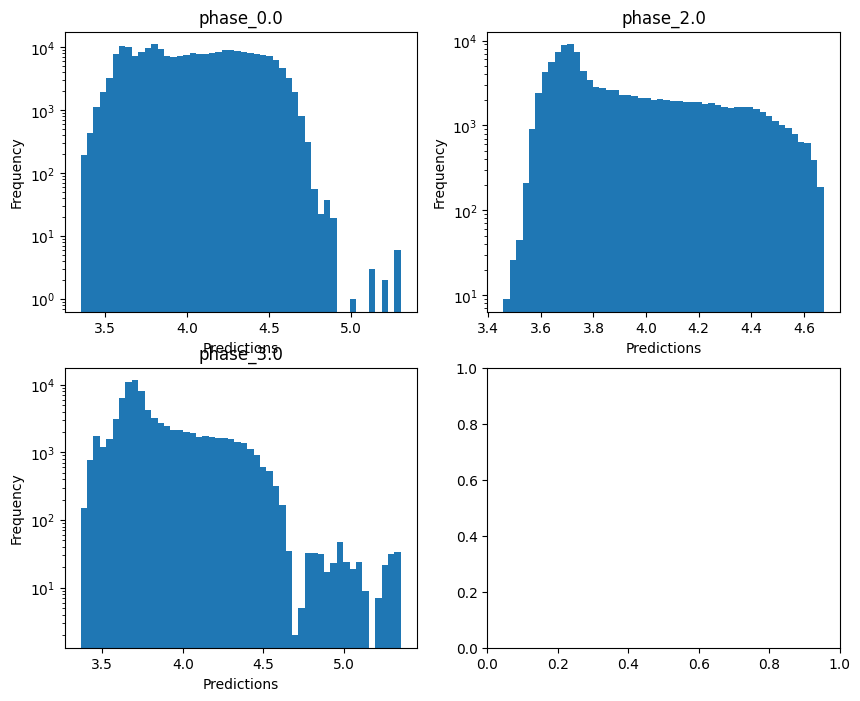


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433070637654307
  RVE :  0.6424747234239525
  RMSE :  0.35626521634430564
  MAE :  0.07234862834055049
  MedAE :  0.0027965458078573757
  CORR :  0.8636937145353946
  MAX_ER :  5.566054738055643
  Percentiles : 
    75th percentile :  0.007700656585763577
    90th percentile :  0.0358425871962505
    95th percentile :  0.26091767719488046
    99th percentile :  1.9173773243054162

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.5647573800180672
  RMSE :  0.6086663121355381
  MAE :  0.2698750627745969
  MedAE :  0.011223396114039996
  CORR :  0.7567392250580913
  MAX_ER :  4.506852905916312
  Percentiles : 
    75th percentile :  0.22342817494517453
    90th percentile :  1.0572603879204048
    95th percentile :  1.5501976231706014
    99th percentile :  2.353144045602579

log_g results for the phase category wit

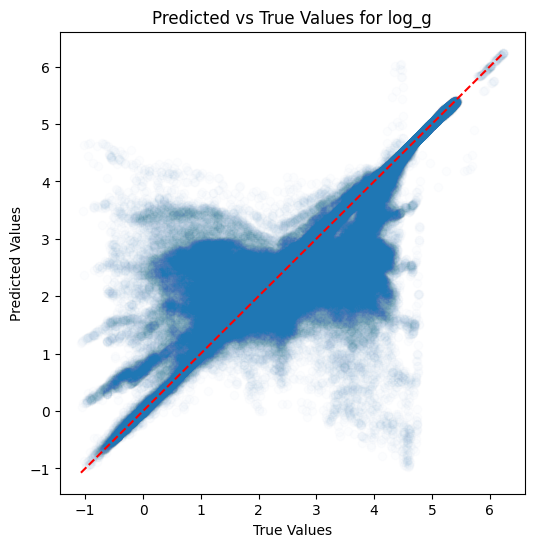

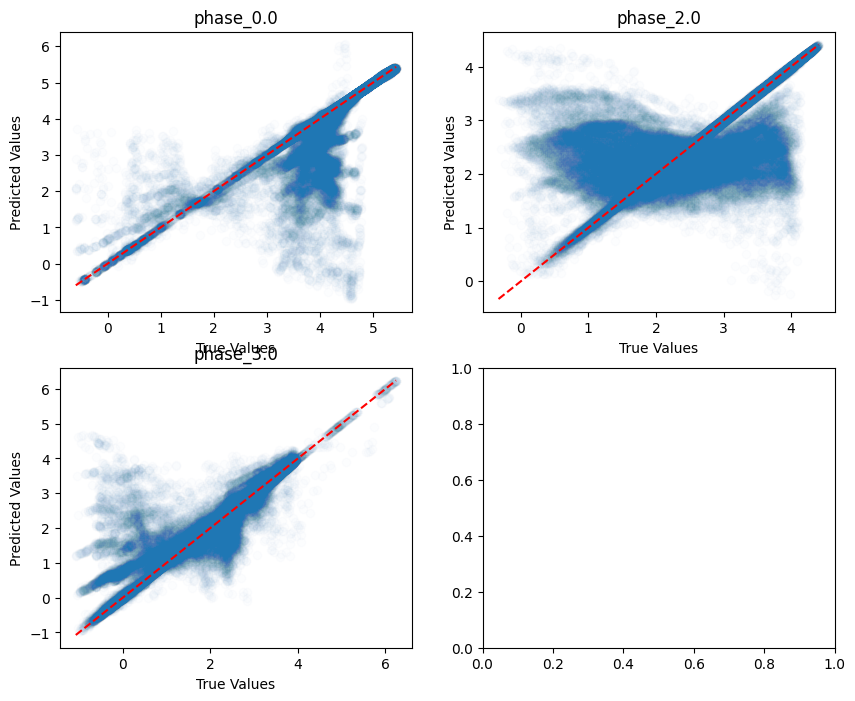

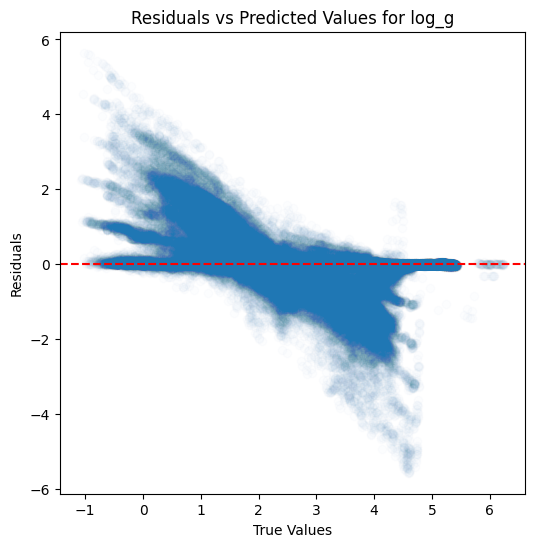

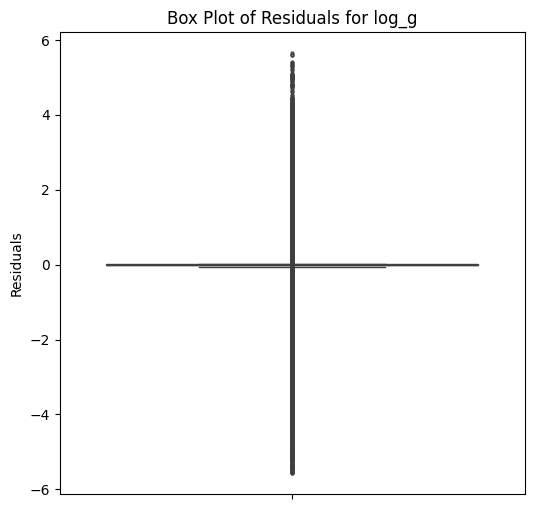

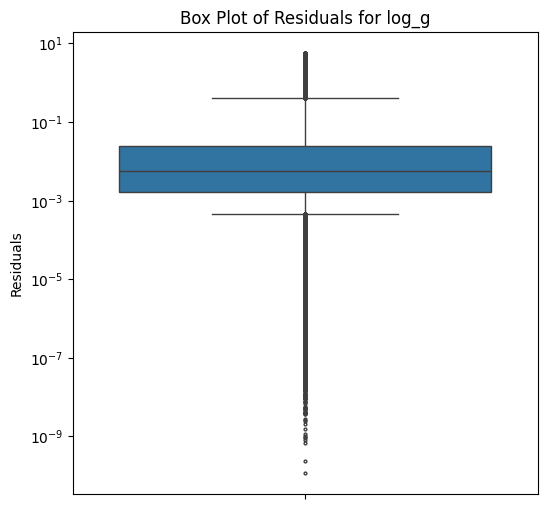

...

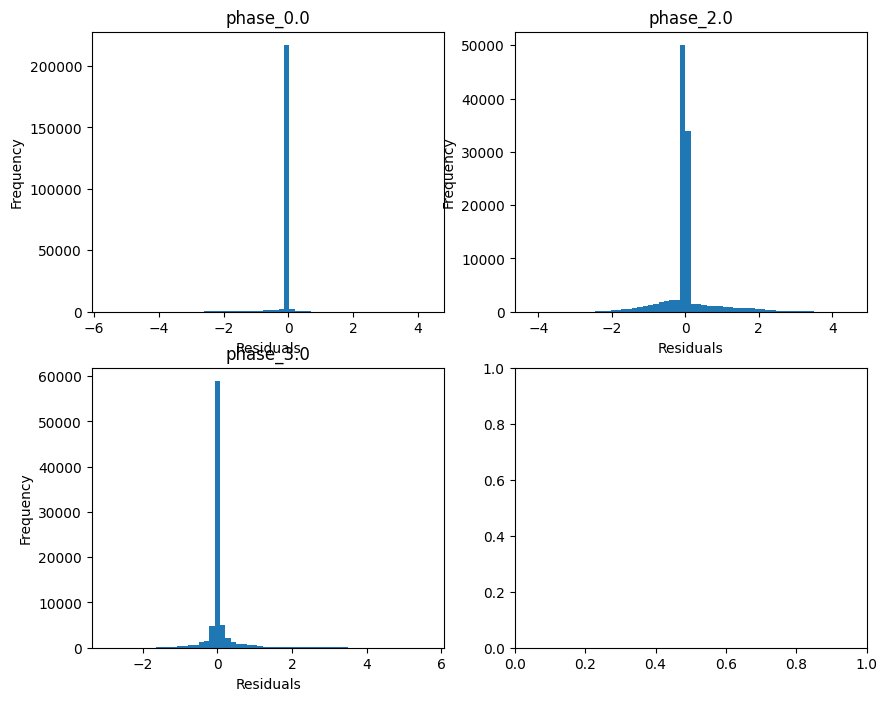

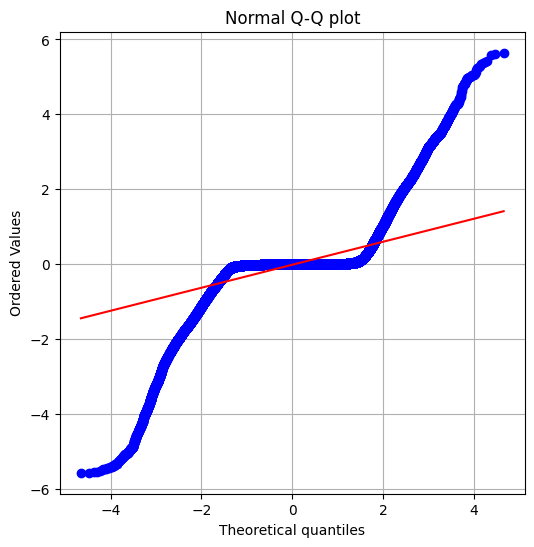

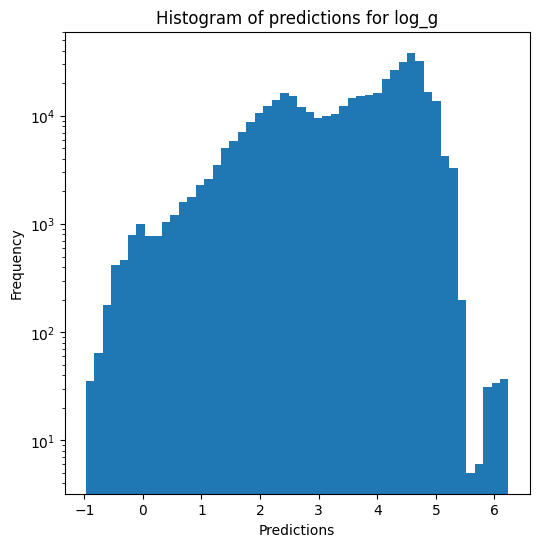

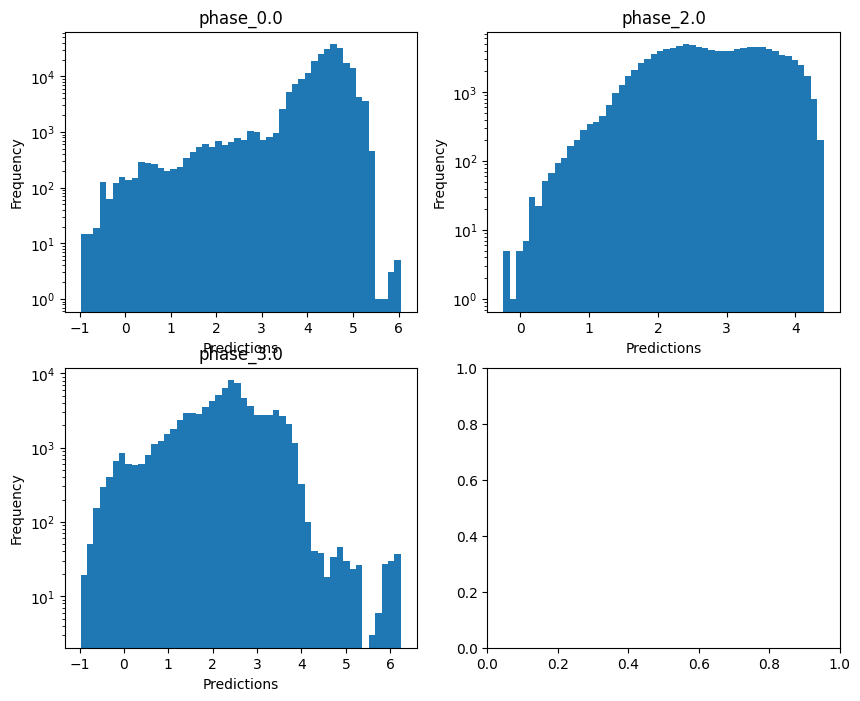

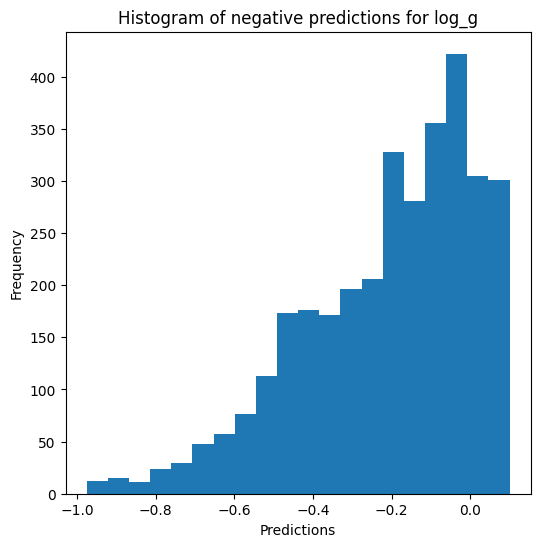


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.878962963156113
  RMSE :  0.17832185451793203
  MAE :  0.03728328428031094
  MedAE :  0.0020816109573537816
  CORR :  0.9461368898191871
  MAX_ER :  2.7833350063174875
  Percentiles : 
    75th percentile :  0.005614324607466997
    90th percentile :  0.02310038395376876
    95th percentile :  0.13094987526748755
    99th percentile :  0.9594984787121952

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.5517339169333411
  RMSE :  0.30432622910198465
  MAE :  0.13494114852642194
  MedAE :  0.005620696713944051
  CORR :  0.7521913415214849
  MAX_ER :  2.253201600455108
  Percentiles : 
    75th percentile :  0.11170314349462473
    90th percentile :  0.528638498728016
    95th percentile :  0.775117690201867
    99th percentile :  1.1767022256844726

radius results for the phase category

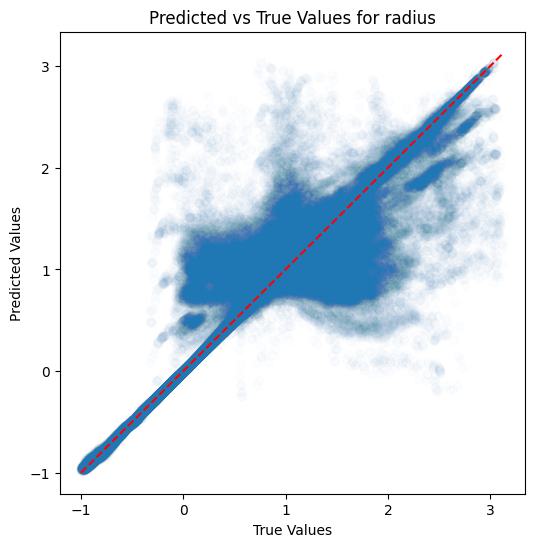

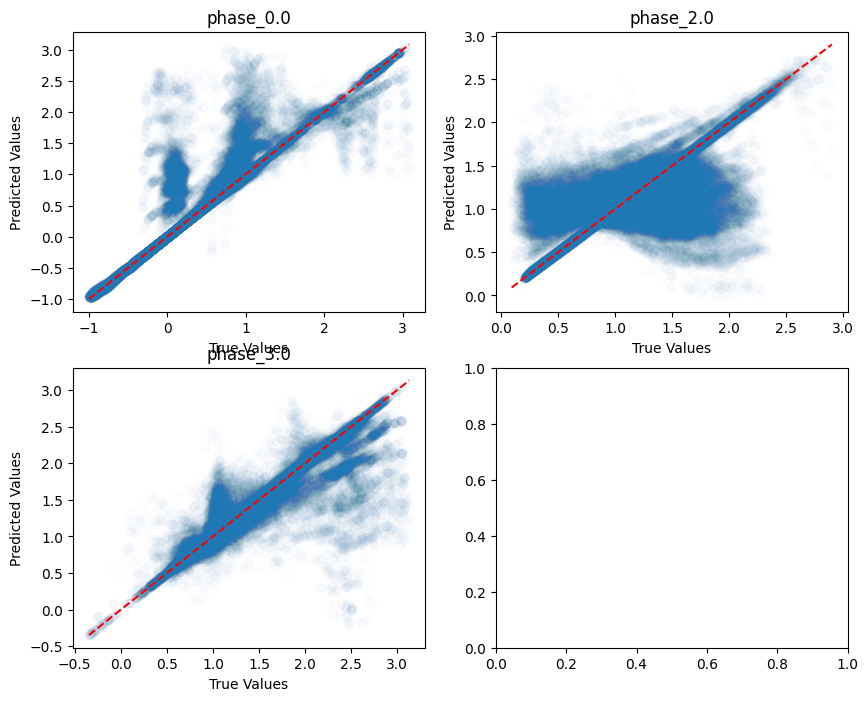

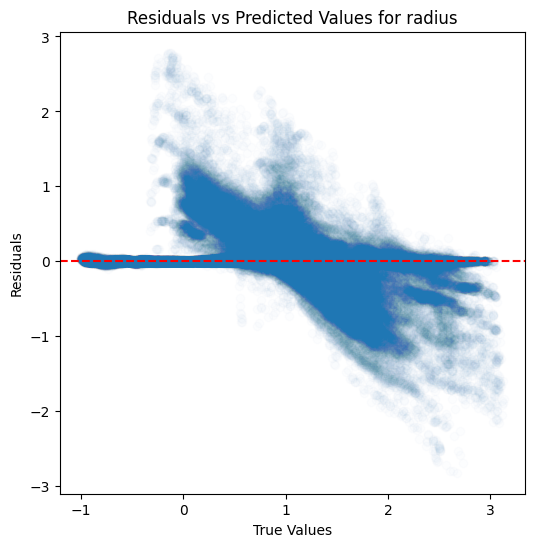

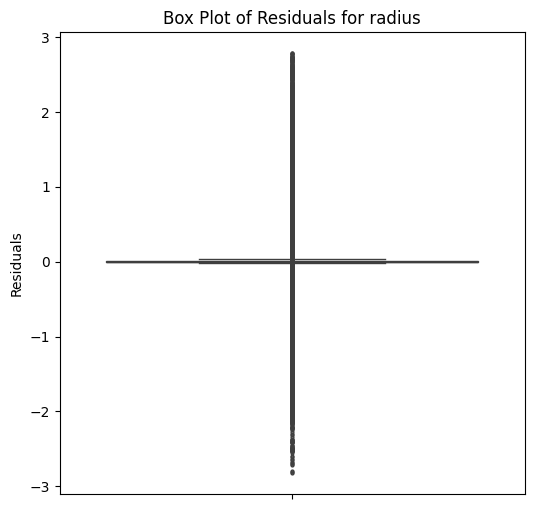

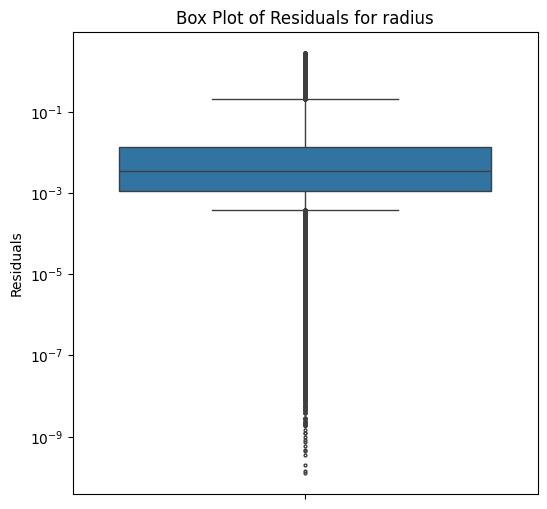

...

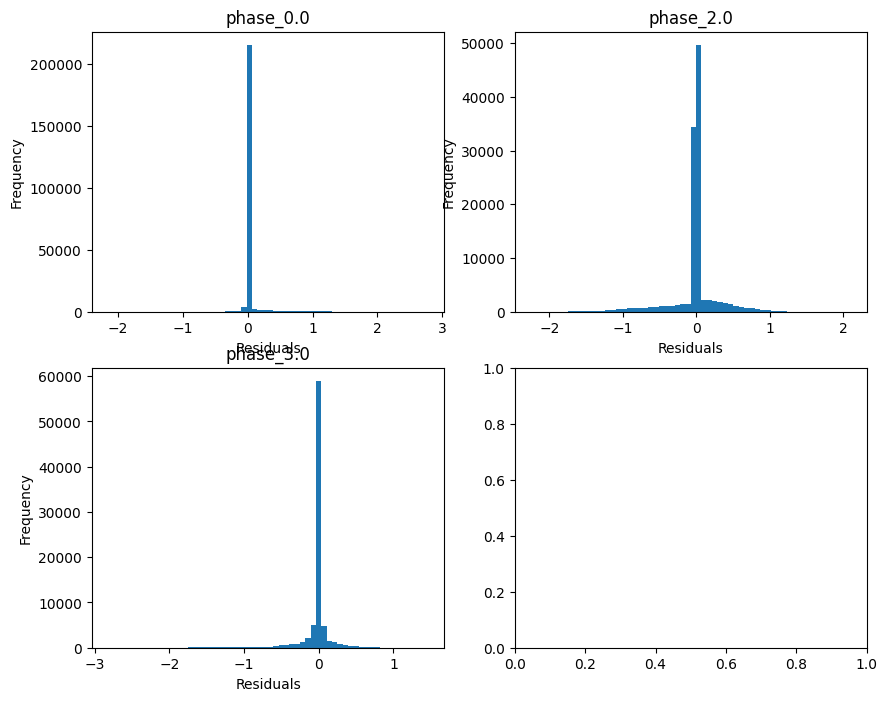

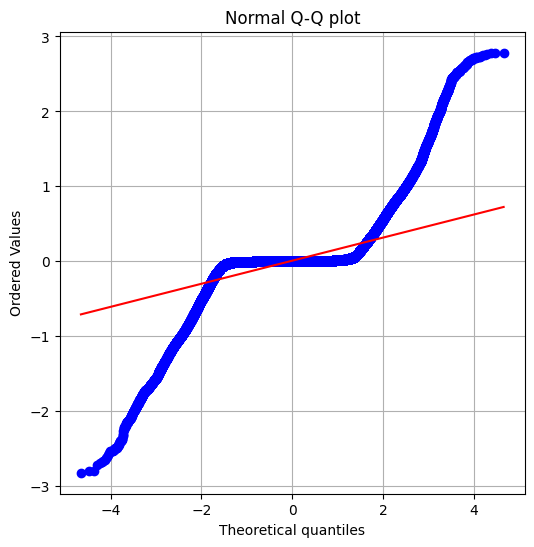

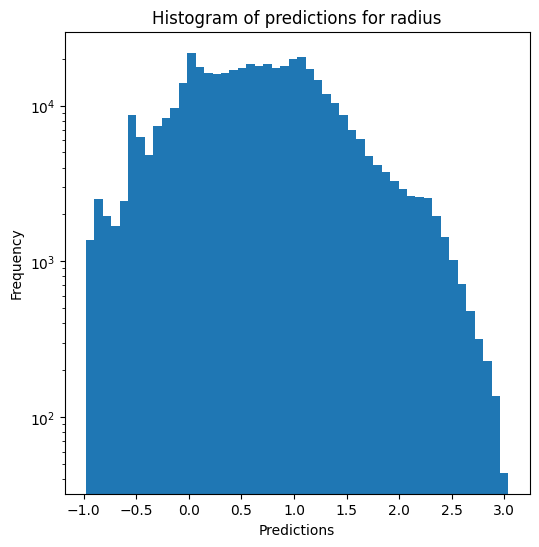

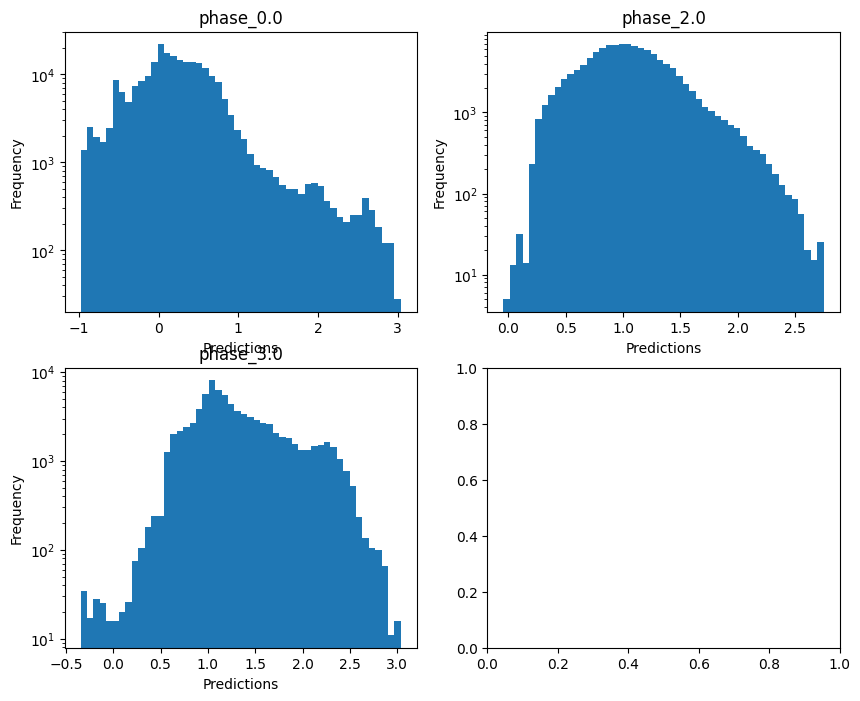

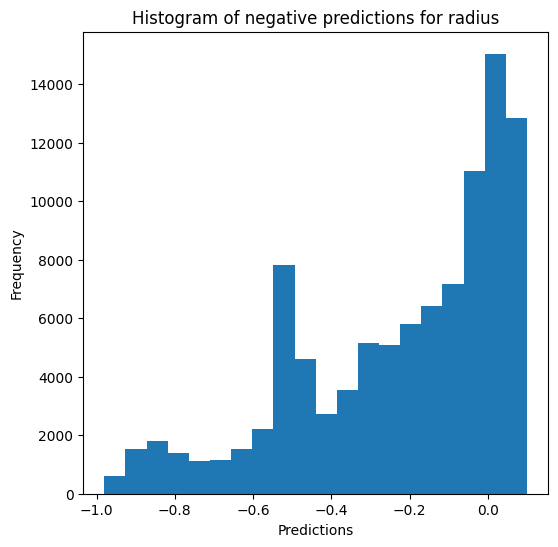

Saving results...


In [18]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### Random forests

In [19]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.898172986424315
  RVE :  0.9731927218060262
  RMSE :  0.05322190916457929
  MAE :  0.008802566382464355
  MedAE :  0.0005474980443060939
  CORR :  0.9866443584374699
  MAX_ER :  0.905174397082054
  Percentiles : 
    75th percentile :  0.0013769753011195762
    90th percentile :  0.004168518243674324
    95th percentile :  0.014787255155003615
    99th percentile :  0.24210255830927033

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.674979048906864
  RVE :  0.9694508516094958
  RMSE :  0.050395270490868296
  MAE :  0.020747012287858326
  MedAE :  0.00227960342112965
  CORR :  0.9846092092671184
  MAX_ER :  0.6981535715088452
  Percentiles : 
    75th percentile :  0.01371446360398032
    90th percentile :  0.07217600852396168
    95th percentile :  0.11434196028477914


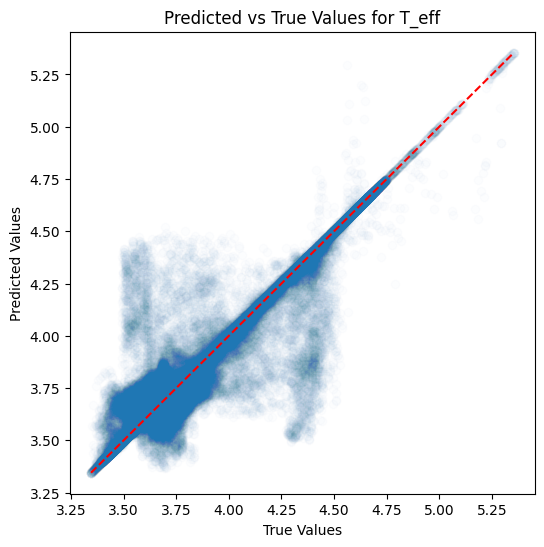

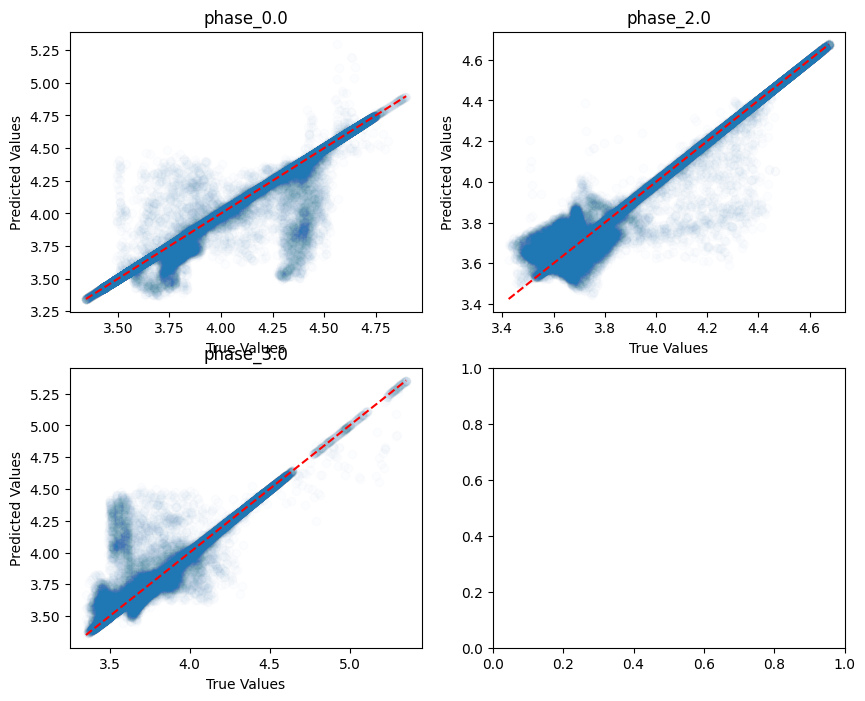

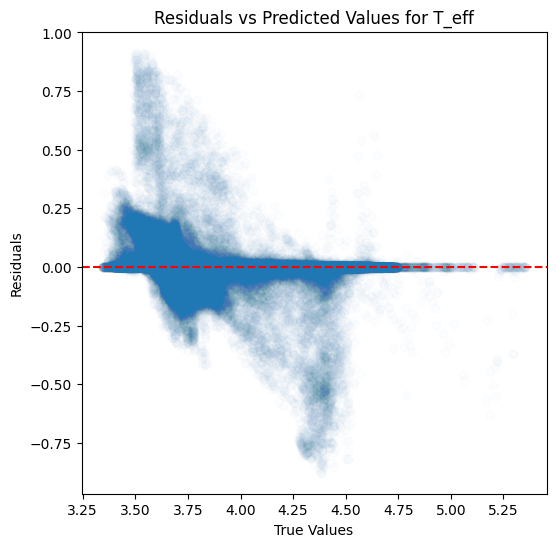

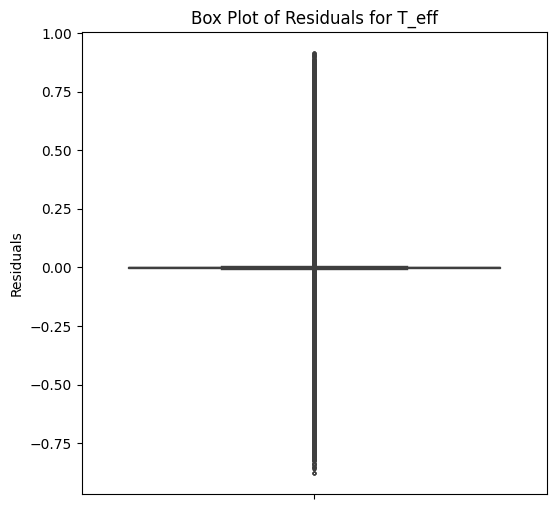

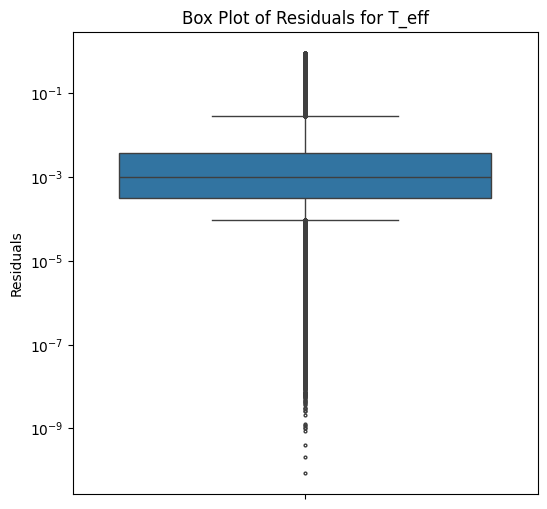

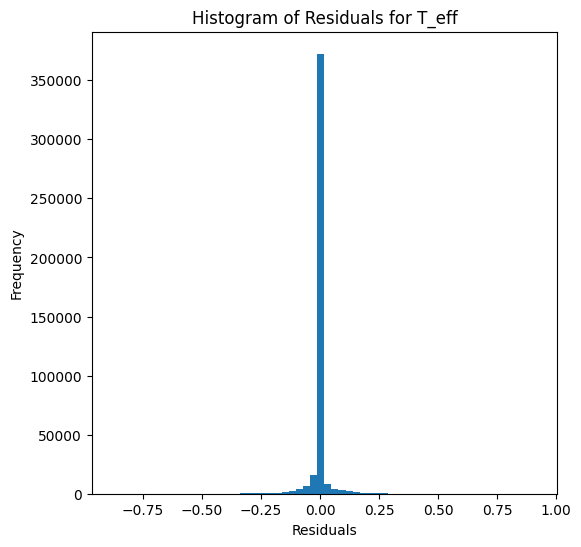

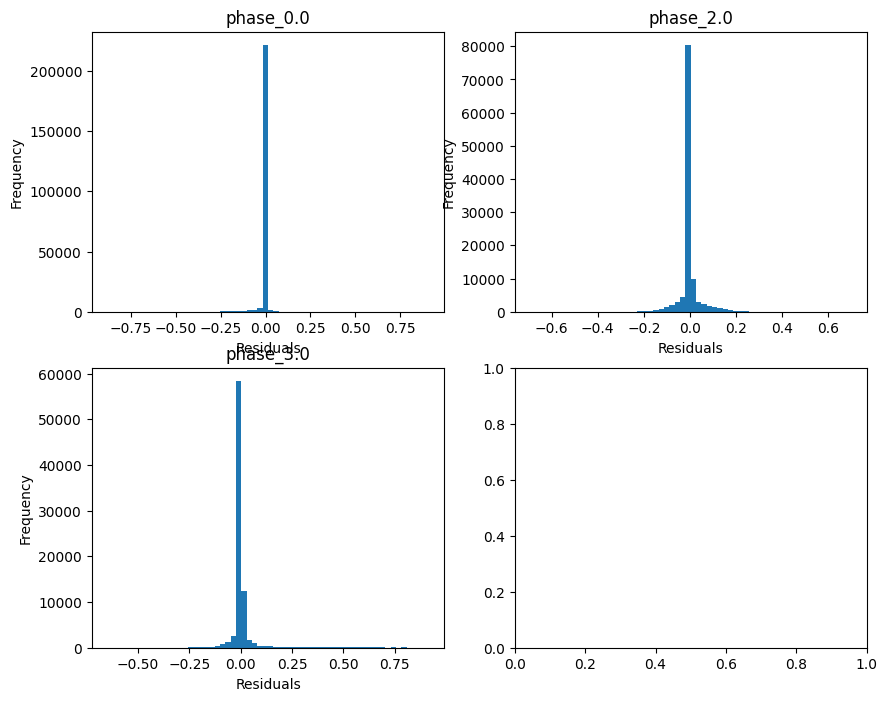

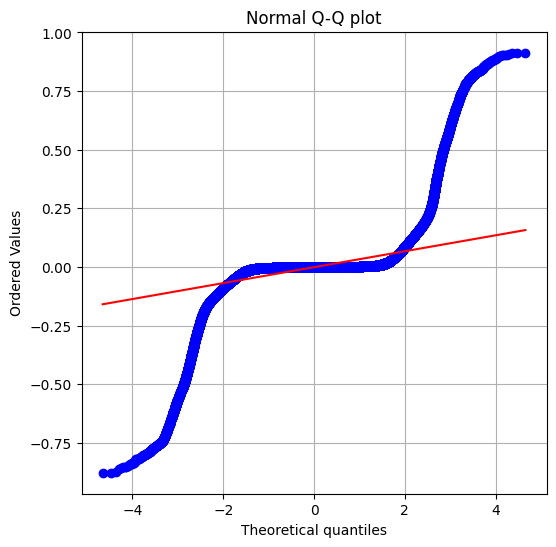

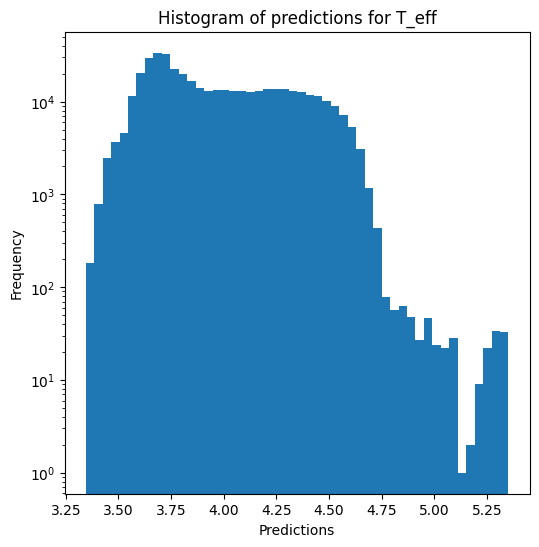

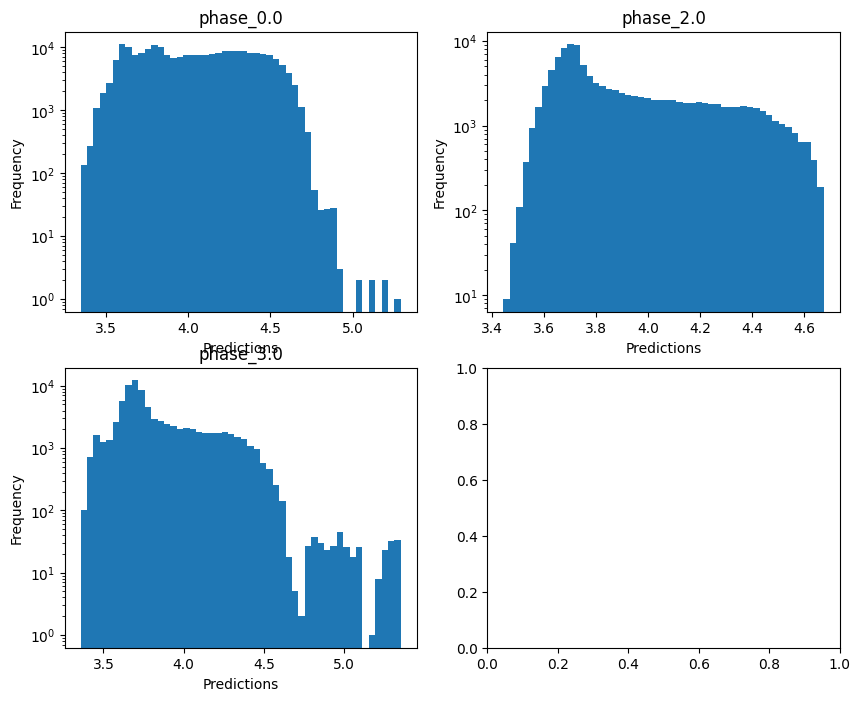


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433070637654307
  RVE :  0.606987074468411
  RMSE :  0.3720688393239982
  MAE :  0.06453115668768356
  MedAE :  0.0016036164224204619
  CORR :  0.8497599980063882
  MAX_ER :  5.5018170350993465
  Percentiles : 
    75th percentile :  0.004620021221001025
    90th percentile :  0.015096670673819462
    95th percentile :  0.095522972226823
    99th percentile :  2.239574428738529

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.34065187710603484
  RMSE :  0.7490947673571055
  MAE :  0.33000110271606914
  MedAE :  0.011402108723912008
  CORR :  0.6356216771994637
  MAX_ER :  4.511664987601817
  Percentiles : 
    75th percentile :  0.2249062952952836
    90th percentile :  1.3481788625387492
    95th percentile :  1.9370923329380991
    99th percentile :  2.9134450404687153

log_g results for the phase category wit

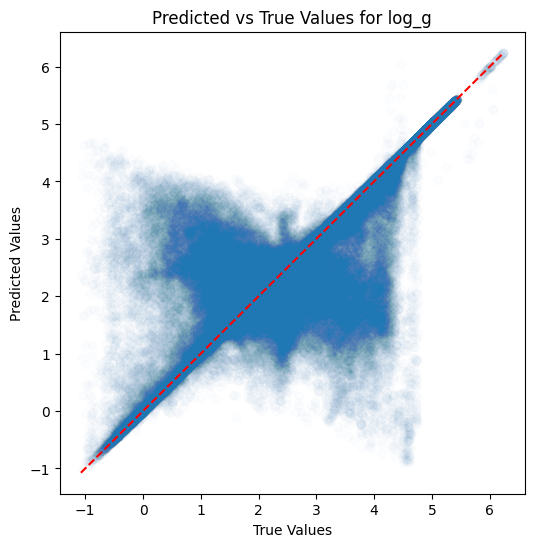

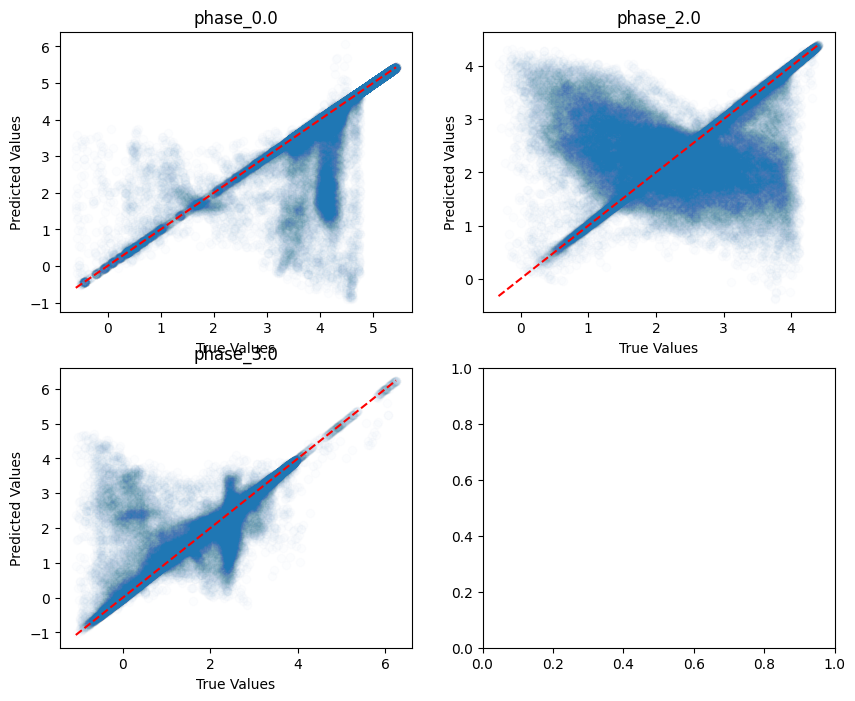

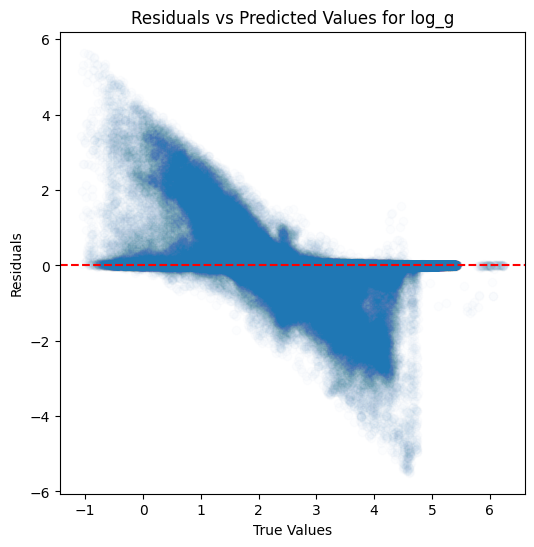

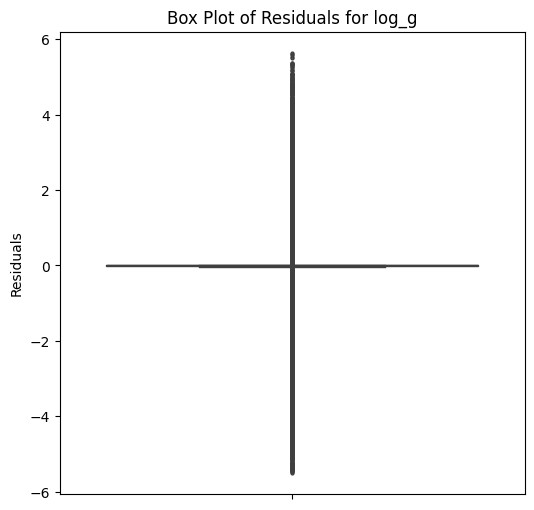

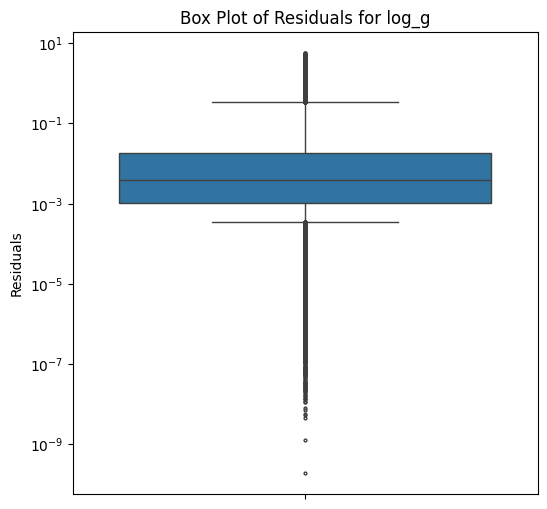

...

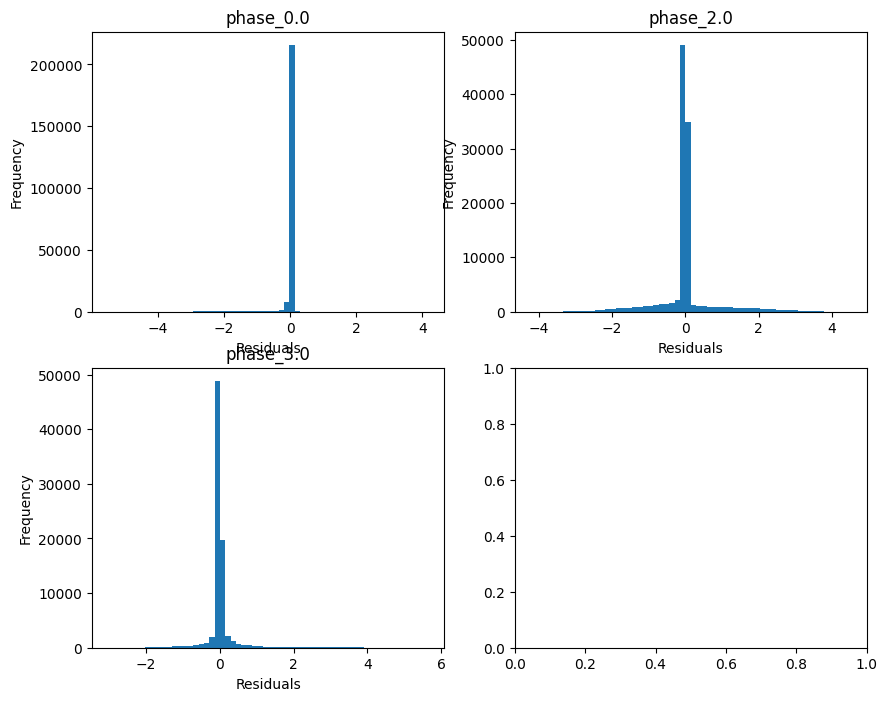

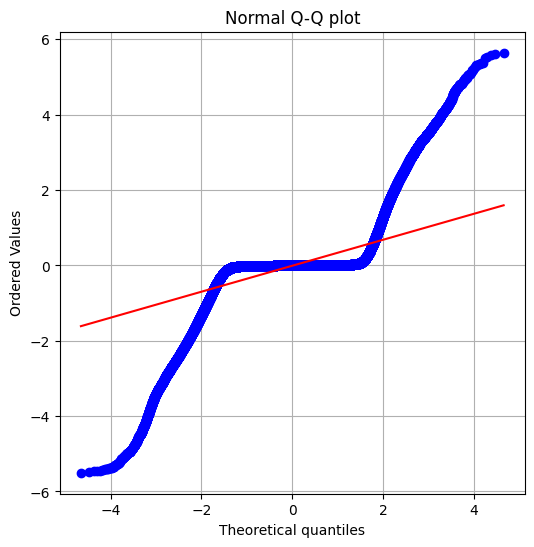

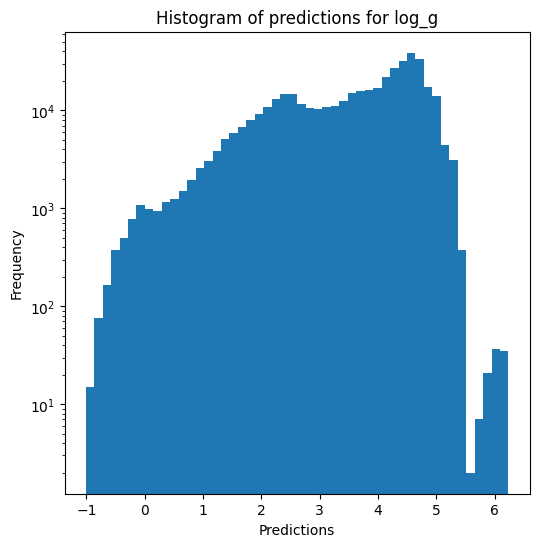

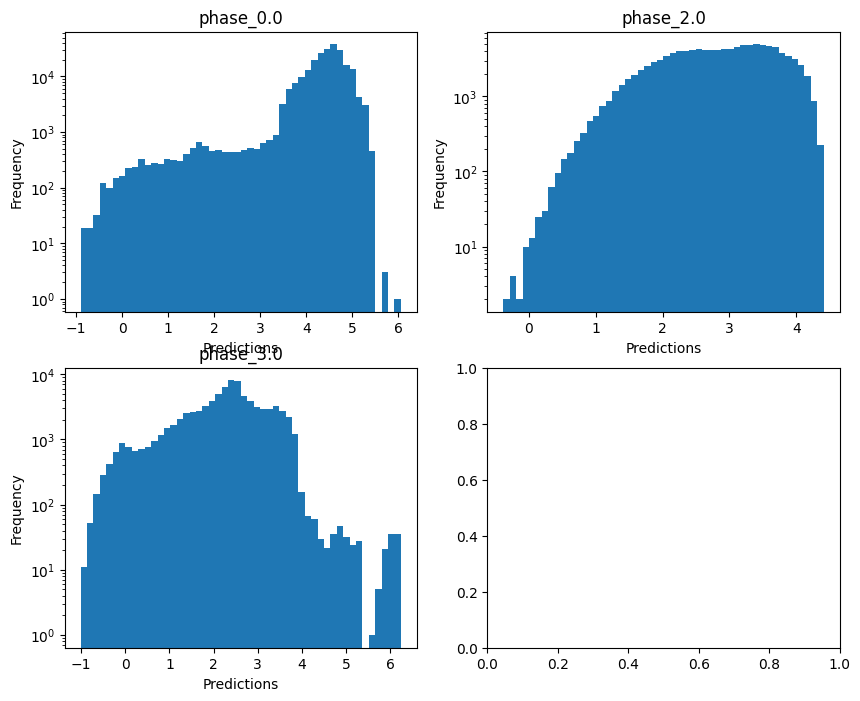

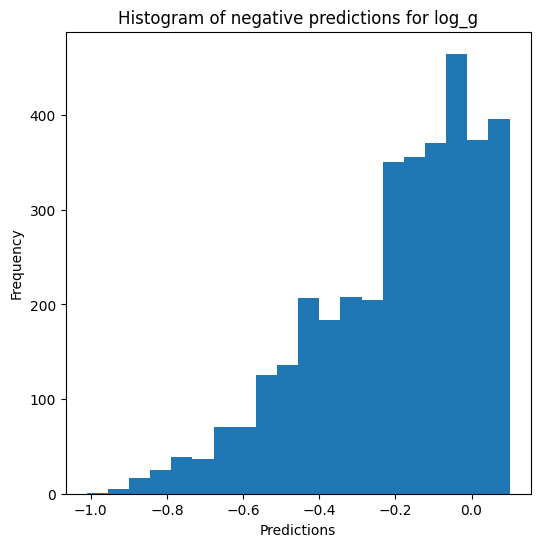


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.867058646092464
  RMSE :  0.1861592523680013
  MAE :  0.03254400523359467
  MedAE :  0.0010347588338541214
  CORR :  0.9393845002936859
  MAX_ER :  2.7521916499929873
  Percentiles : 
    75th percentile :  0.0027449296035585297
    90th percentile :  0.00824794031827414
    95th percentile :  0.04814540278635384
    99th percentile :  1.1224739318994226

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.3209279815569862
  RMSE :  0.37453754293009095
  MAE :  0.16500086337546171
  MedAE :  0.005708992969423732
  CORR :  0.6338808982434485
  MAX_ER :  2.255880463307679
  Percentiles : 
    75th percentile :  0.11245897518857428
    90th percentile :  0.674113744654691
    95th percentile :  0.9685226728919236
    99th percentile :  1.456694185672312

radius results for the phase category

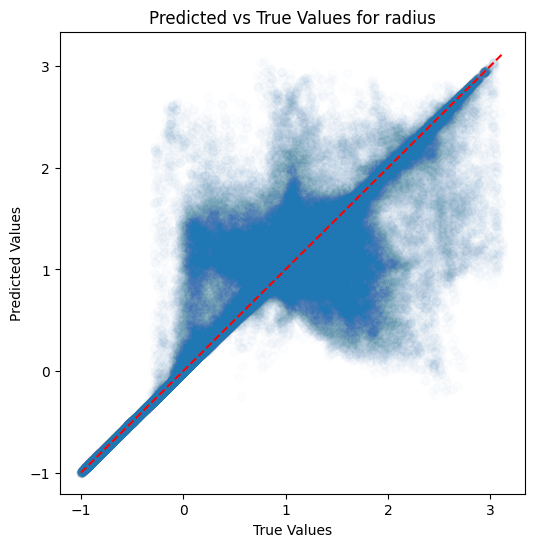

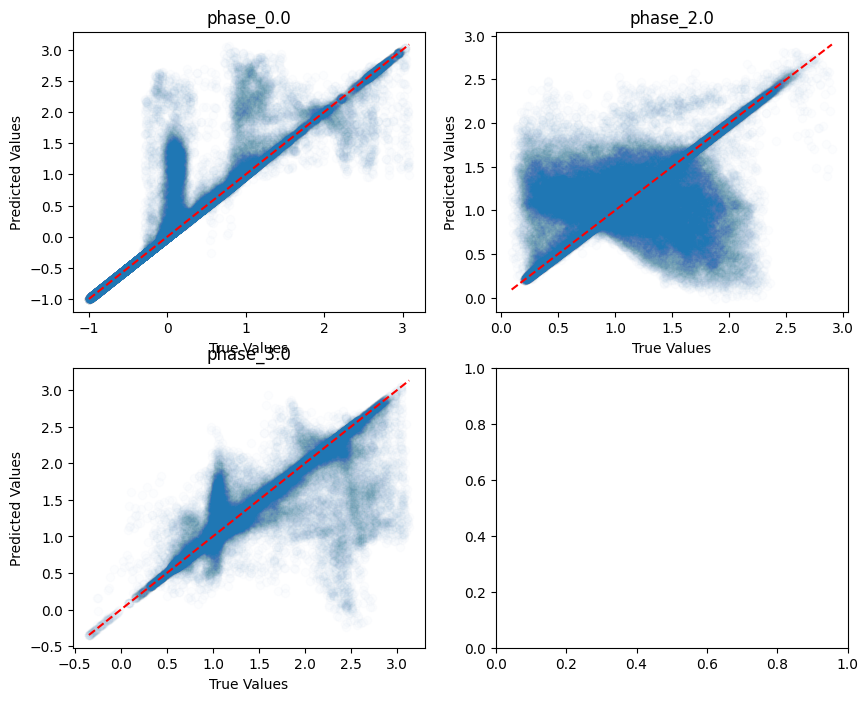

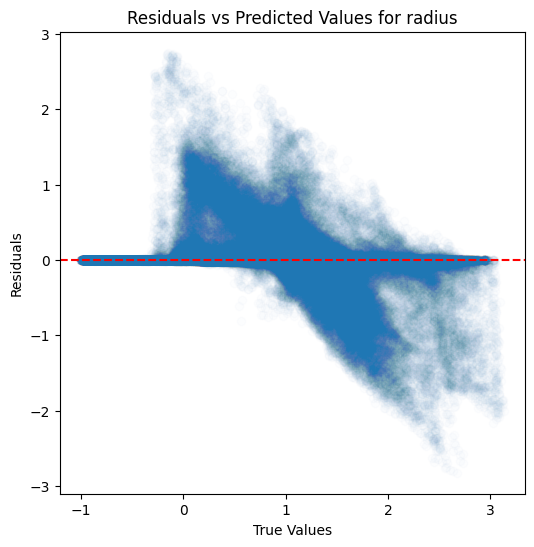

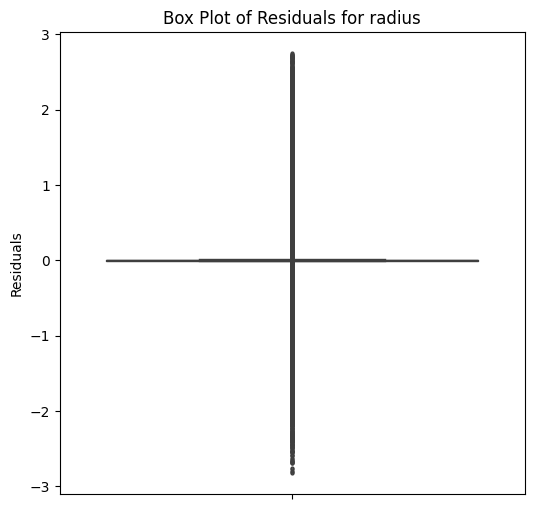

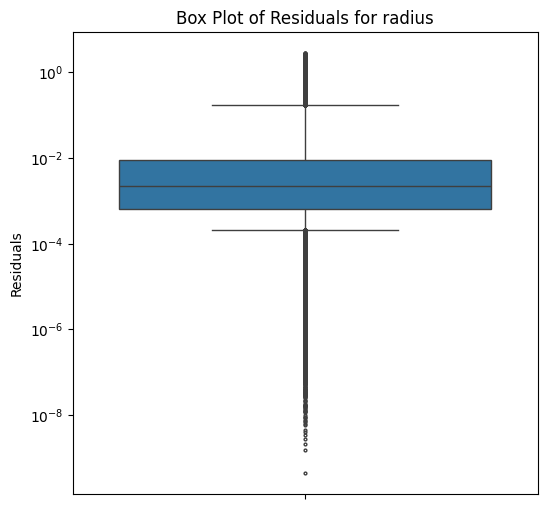

...

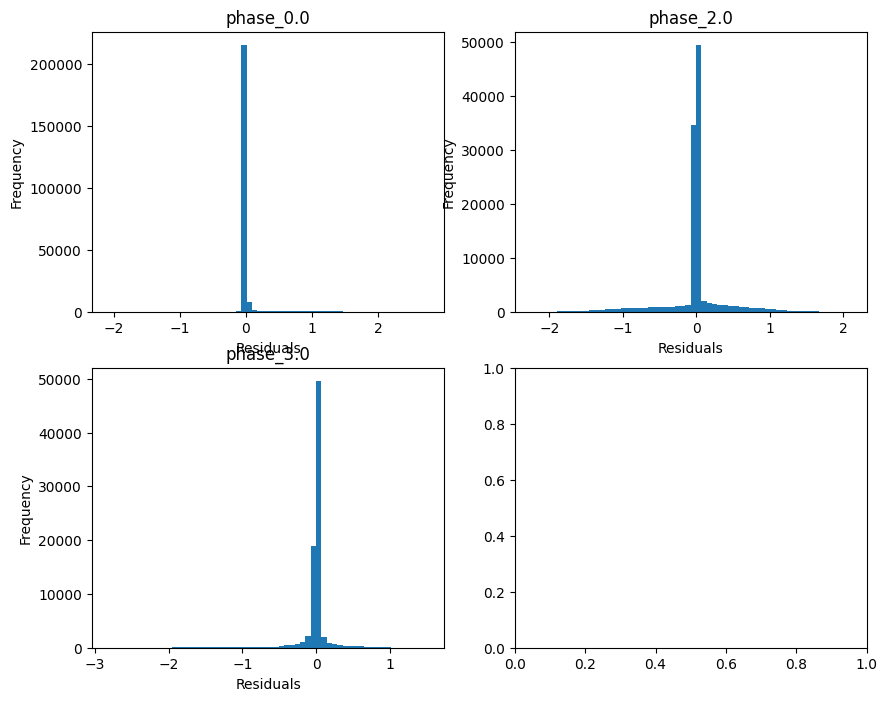

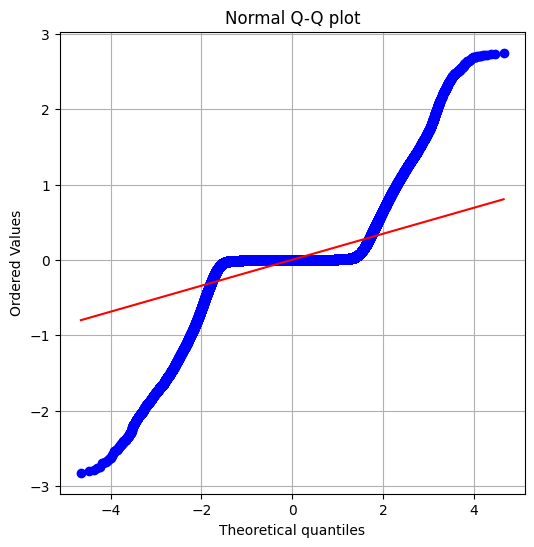

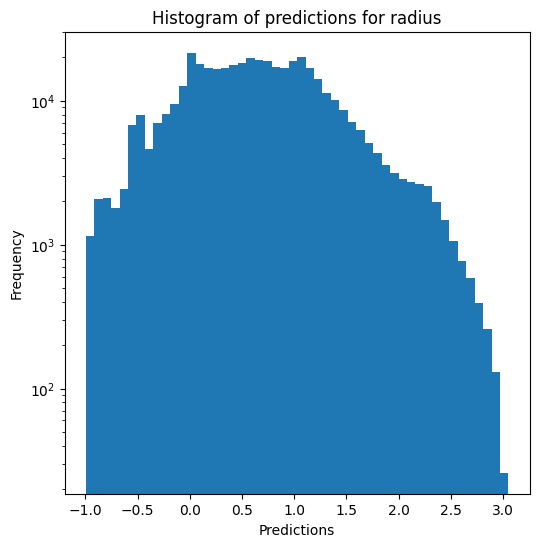

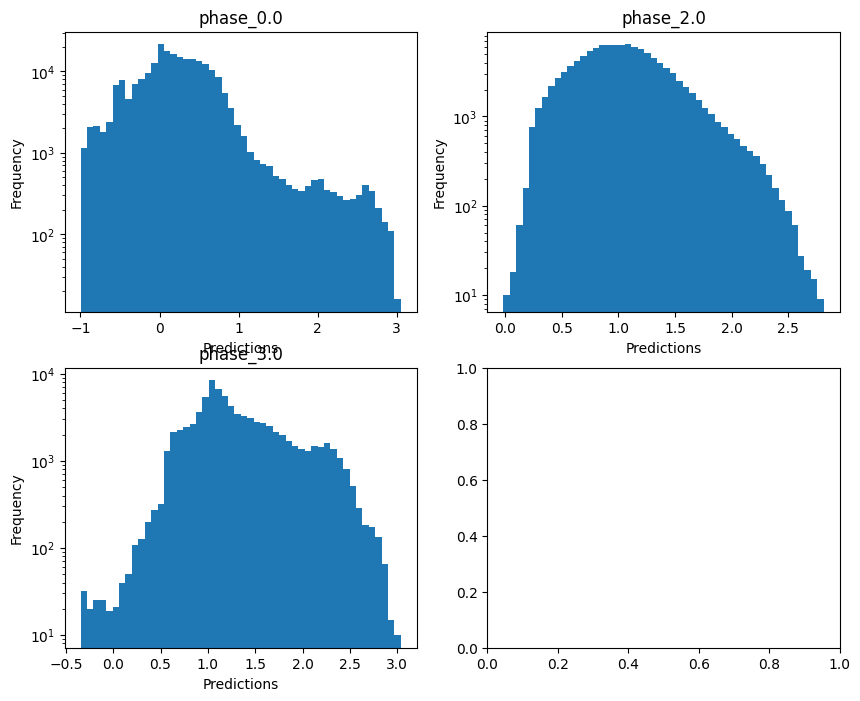

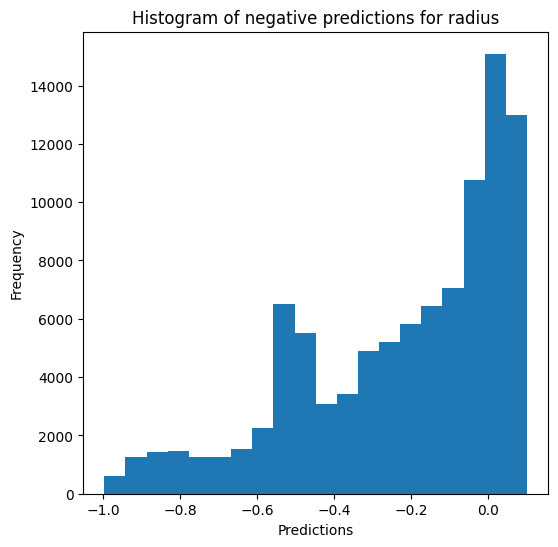

Saving results...


In [20]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### XGBoost

In [21]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.898172986424315
  RVE :  0.9338403374179425
  RMSE :  0.09000430706753688
  MAE :  0.04853421465464675
  MedAE :  0.014411574067637156
  CORR :  0.9665191138870849
  MAX_ER :  0.8150990054241403
  Percentiles : 
    75th percentile :  0.0578862933264791
    90th percentile :  0.14980442397630497
    95th percentile :  0.21509819302813107
    99th percentile :  0.35202522255976737

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.674979048906864
  RVE :  0.8445901604916556
  RMSE :  0.11604324347789807
  MAE :  0.0868128252285595
  MedAE :  0.06587855664040898
  CORR :  0.9194297673486789
  MAX_ER :  0.48683602264361525
  Percentiles : 
    75th percentile :  0.12091086333934076
    90th percentile :  0.19249578000075535
    95th percentile :  0.24987064605270004
    99th

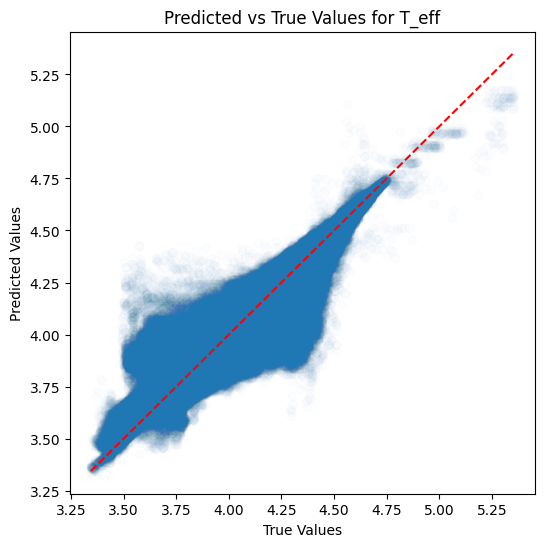

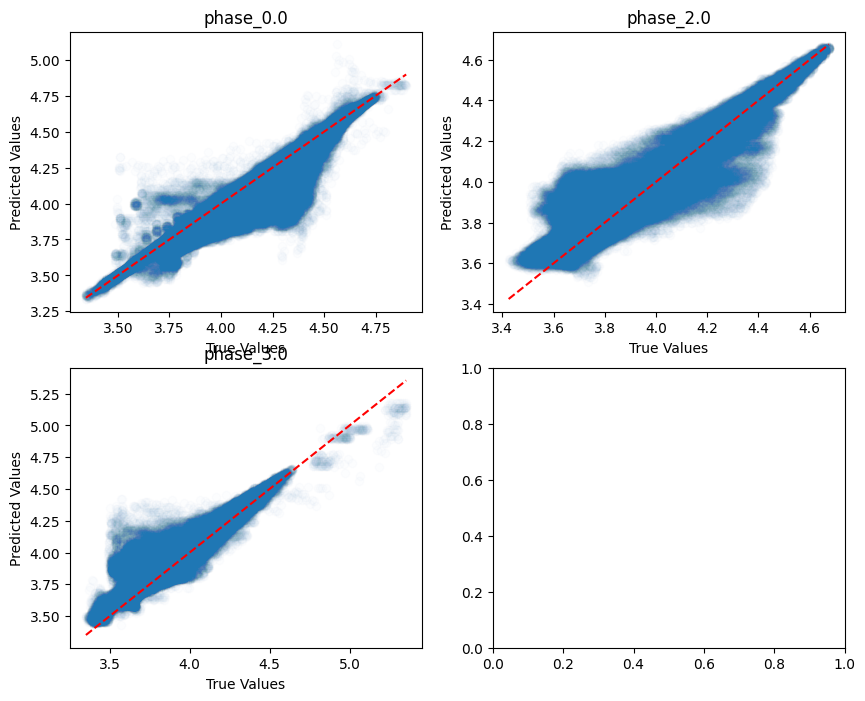

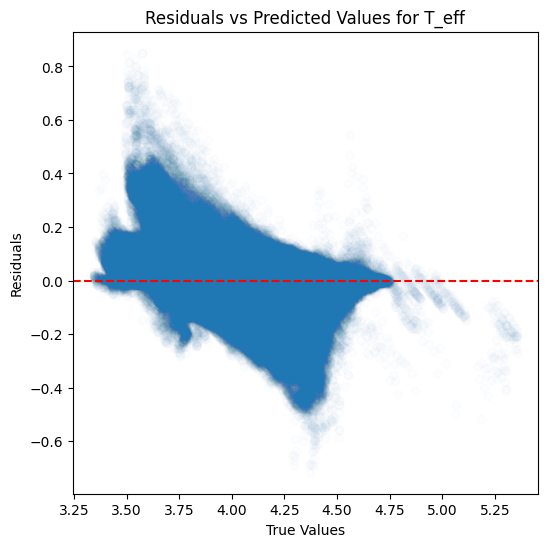

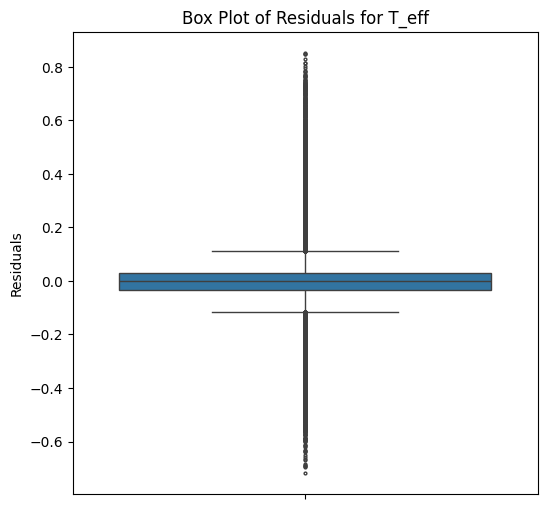

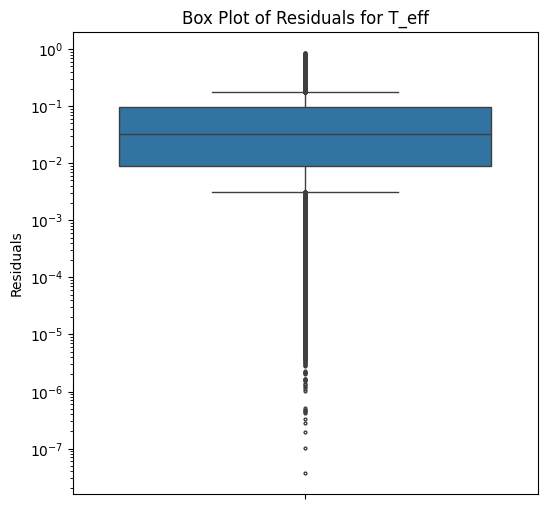

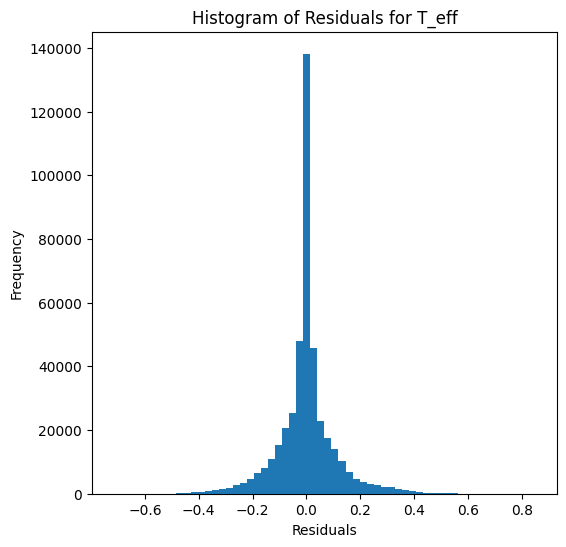

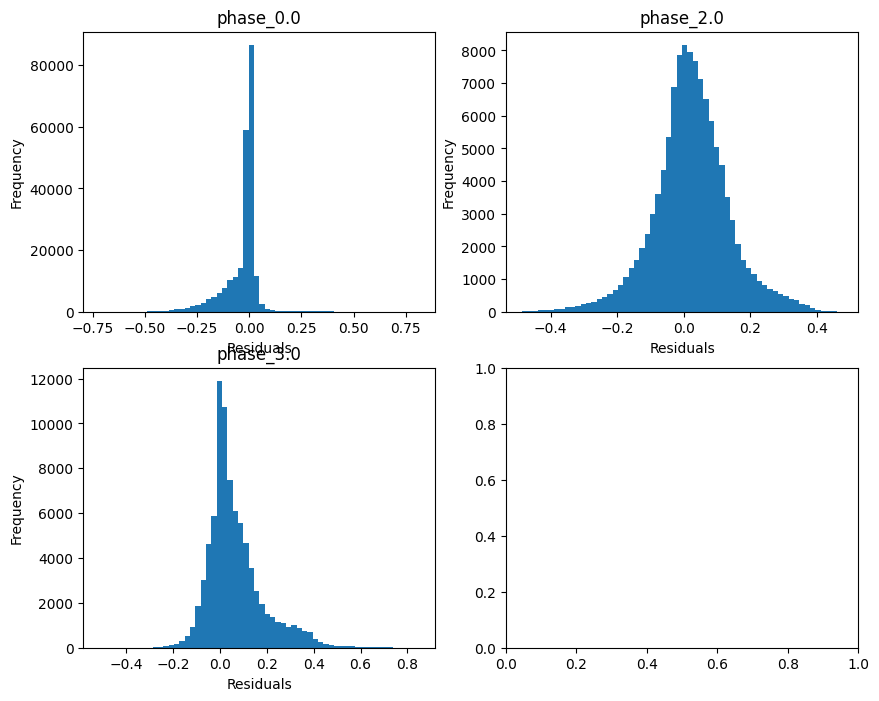

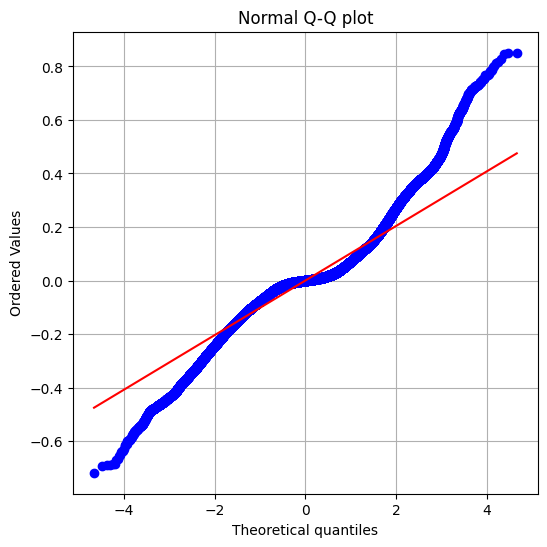

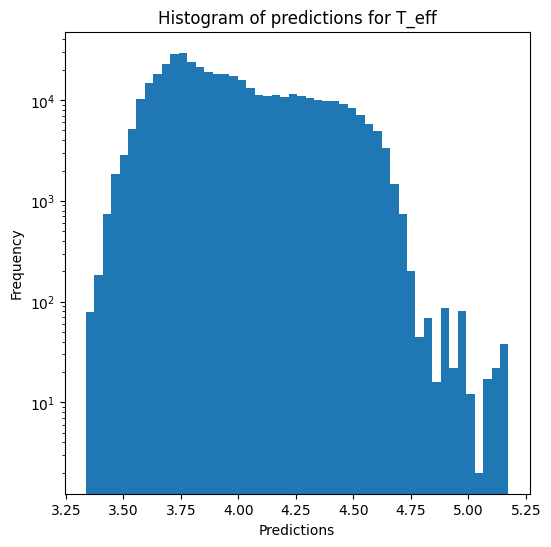

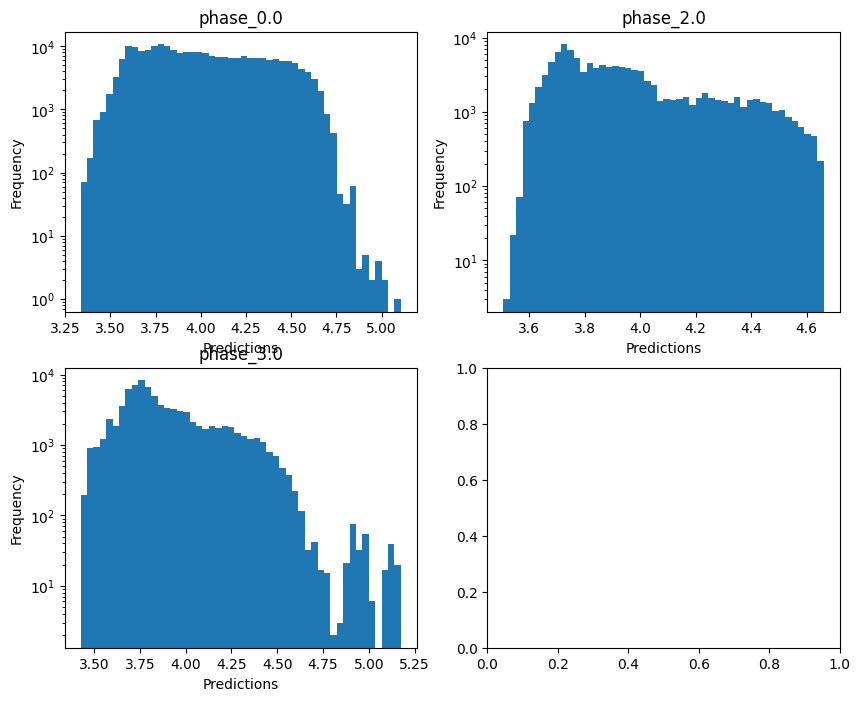


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433070637654307
  RVE :  0.3757175405545202
  RMSE :  0.5075289253558085
  MAE :  0.27762686815069204
  MedAE :  0.07725869933624674
  CORR :  0.8301342889155285
  MAX_ER :  4.9629164924430835
  Percentiles : 
    75th percentile :  0.35588766244578207
    90th percentile :  0.8787506045563062
    95th percentile :  1.1935037294575748
    99th percentile :  1.7414241430743995

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.39282919468435273
  RMSE :  0.7262862281469896
  MAE :  0.552187724446851
  MedAE :  0.4275026738907779
  CORR :  0.6267933206065803
  MAX_ER :  3.8403209946416252
  Percentiles : 
    75th percentile :  0.8052880855218312
    90th percentile :  1.21477009689636
    95th percentile :  1.4858182008270562
    99th percentile :  2.0568096099647137

log_g results for the phase category with a val

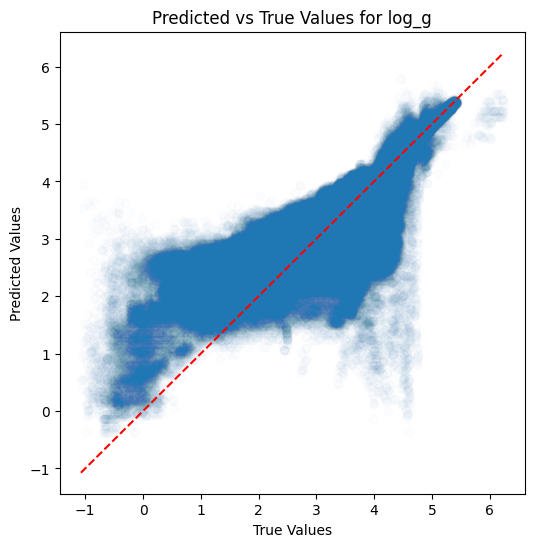

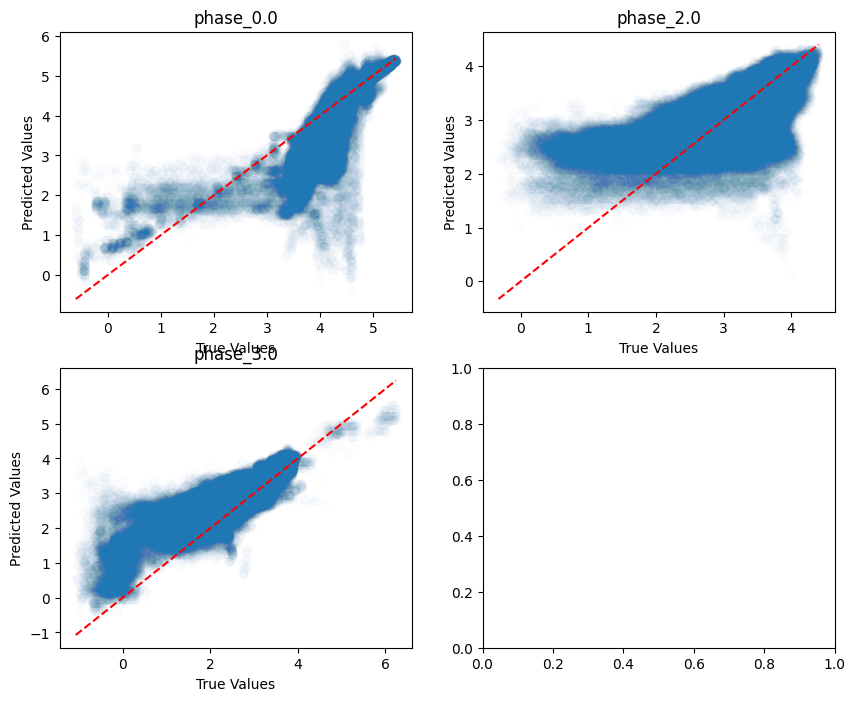

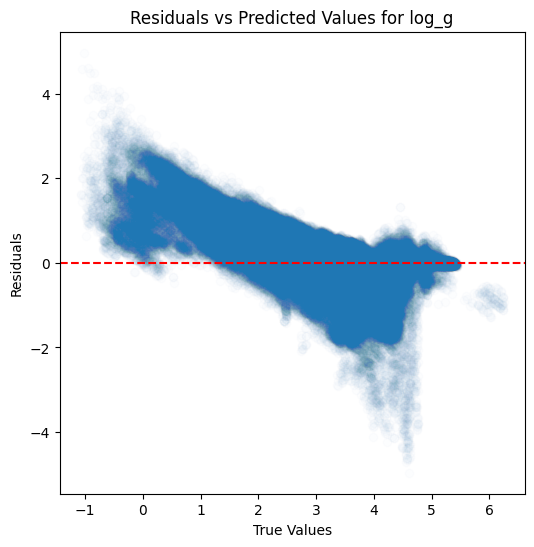

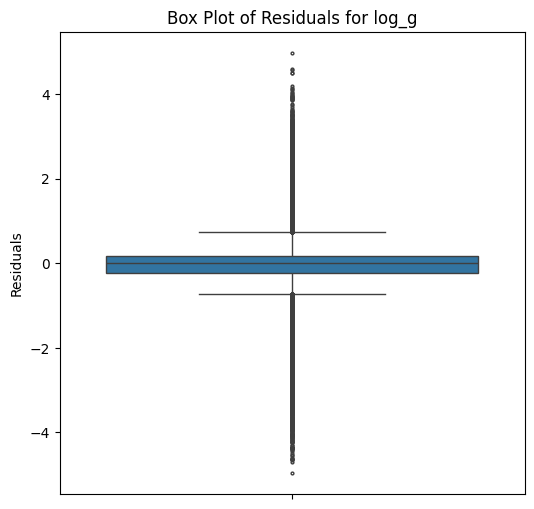

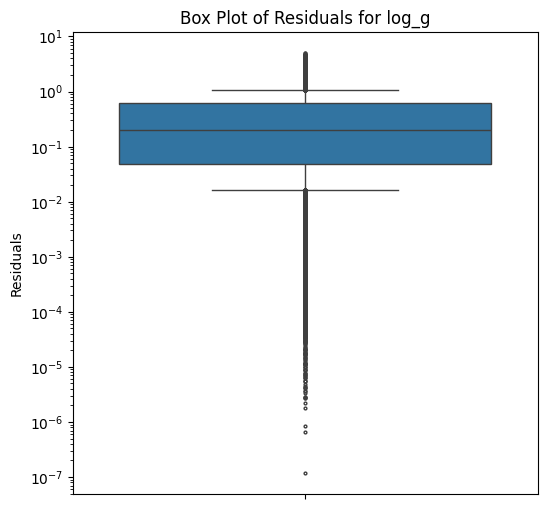

...

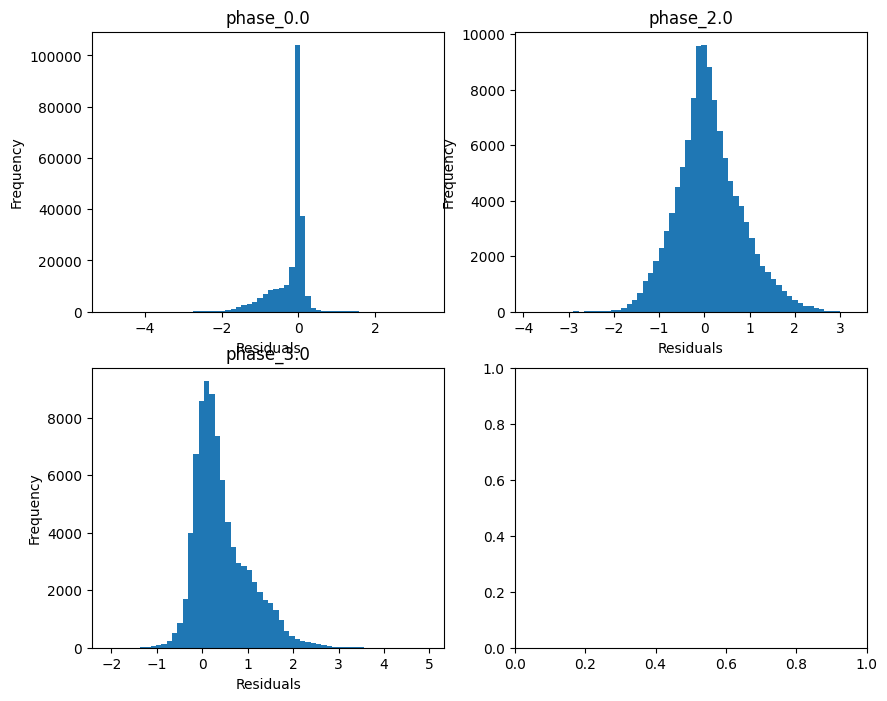

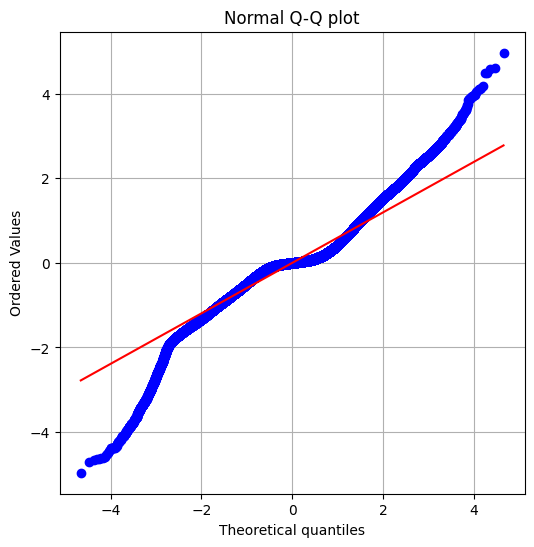

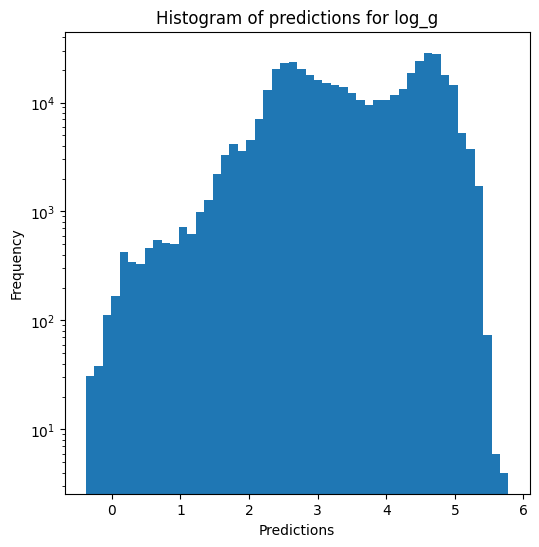

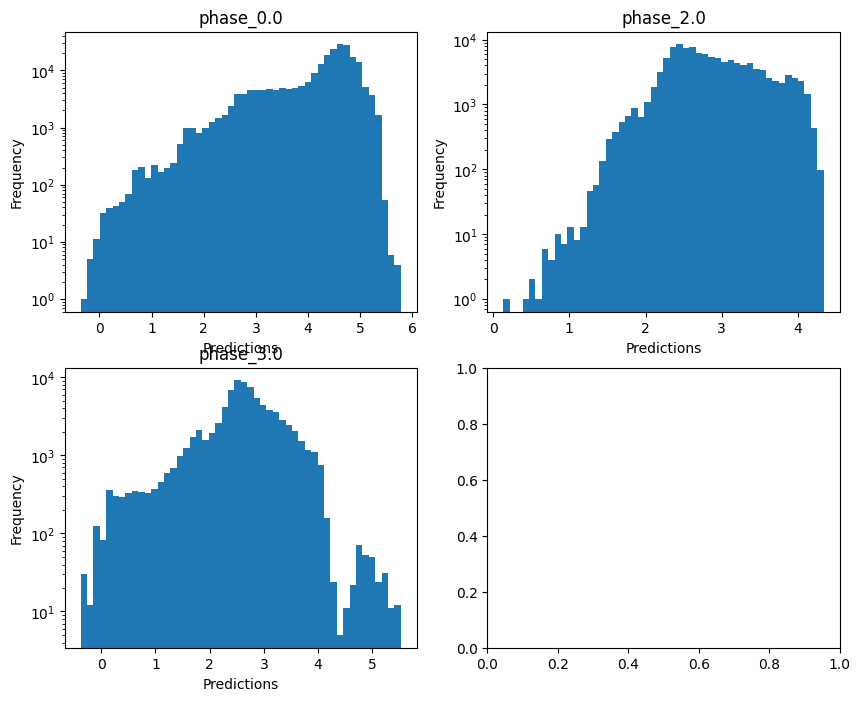

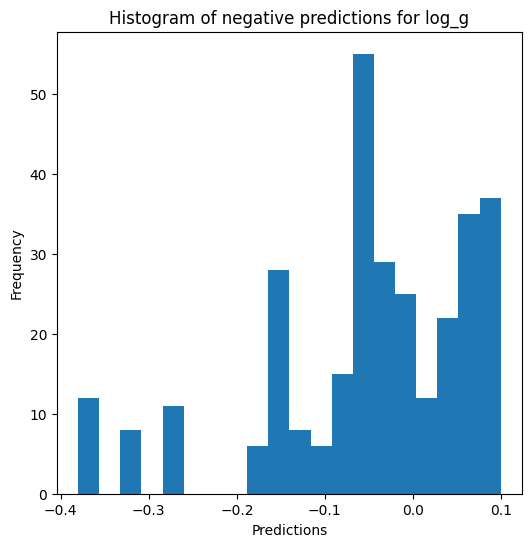


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.7873612816207101
  RMSE :  0.2546021731329394
  MAE :  0.1395197397786157
  MedAE :  0.03819104154039543
  CORR :  0.9205772750607841
  MAX_ER :  2.5230944714885815
  Percentiles : 
    75th percentile :  0.17843721749267163
    90th percentile :  0.4414696161116173
    95th percentile :  0.5971234620410277
    99th percentile :  0.8668041965127236

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.3732885641726318
  RMSE :  0.36347928037494576
  MAE :  0.27624036429796417
  MedAE :  0.2131813489638238
  CORR :  0.6128252627513893
  MAX_ER :  1.8603010682476042
  Percentiles : 
    75th percentile :  0.4022364702073786
    90th percentile :  0.6073668236598014
    95th percentile :  0.7436774849181366
    99th percentile :  1.027326828769627

radius results for the phase category with a

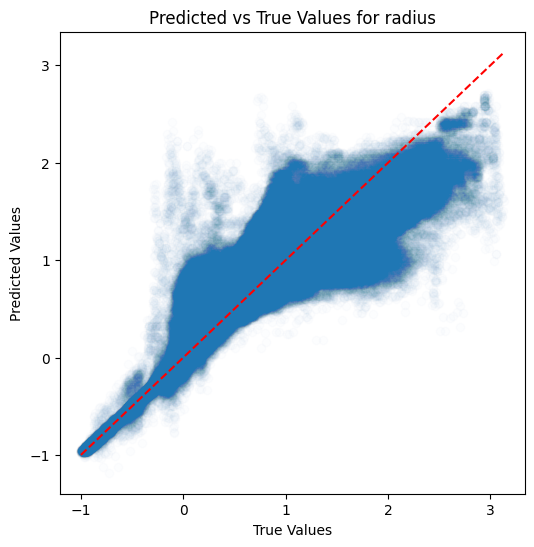

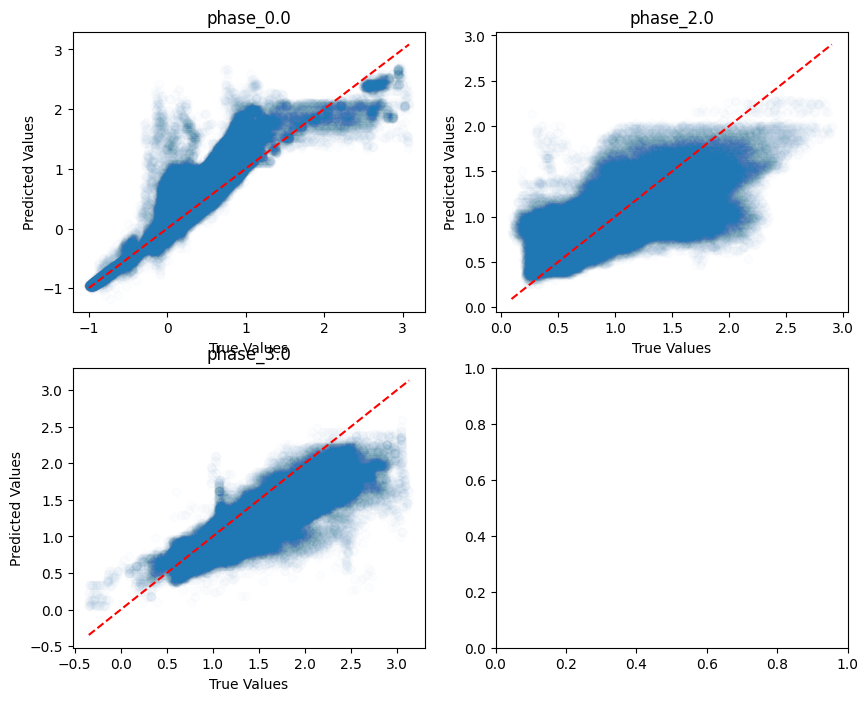

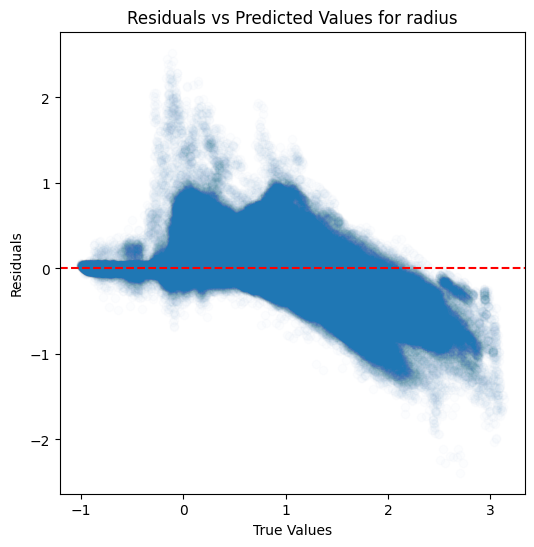

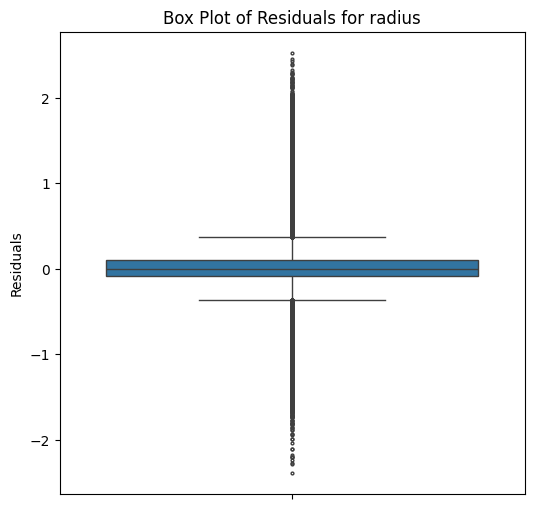

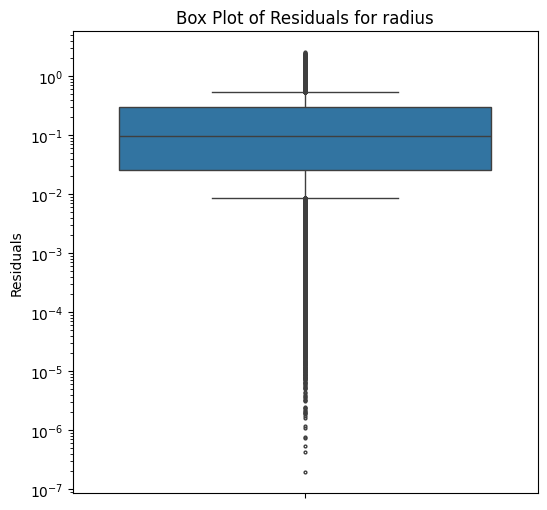

...

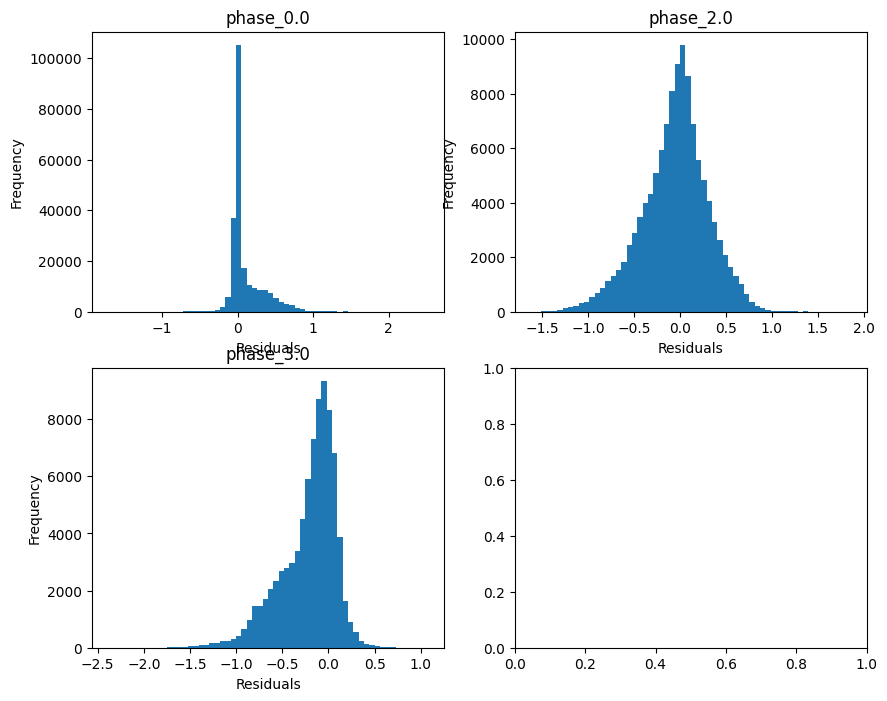

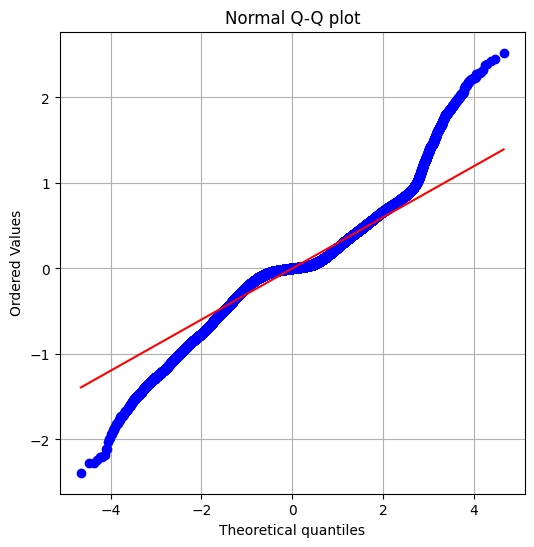

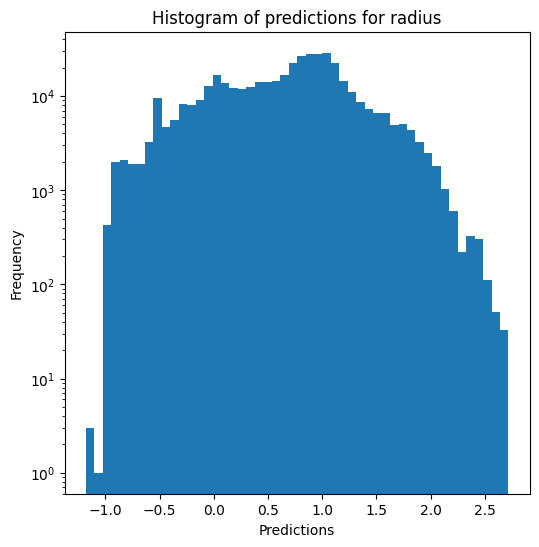

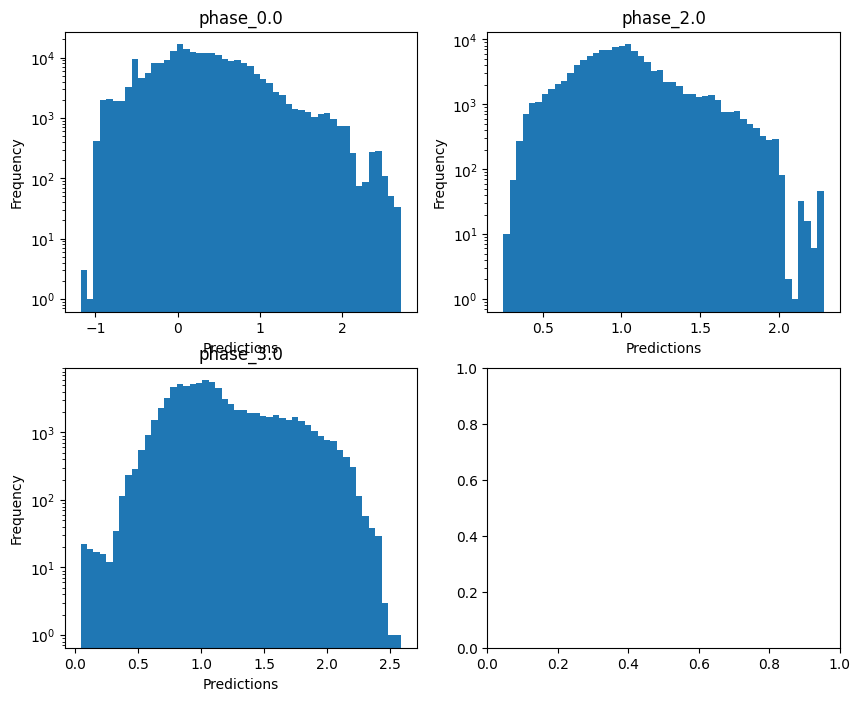

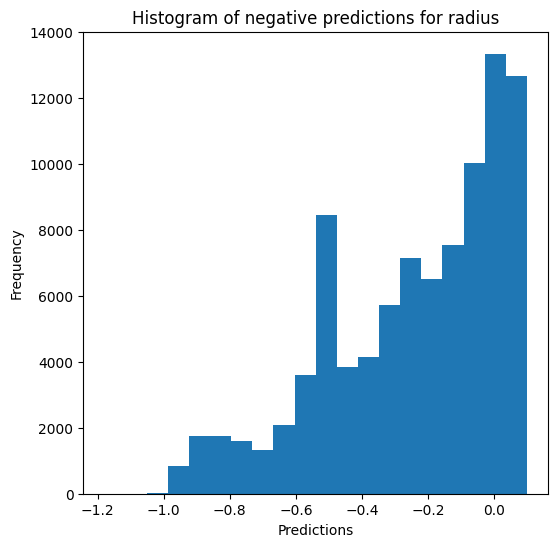

Saving results...


In [22]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### Multi-layer perceptron

In [23]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344674699659814 - 4.898172986424315
  RVE :  0.812854668036648
  RMSE :  0.14971018427246144
  MAE :  0.09504660640083526
  MedAE :  0.049959681594368366
  CORR :  0.9039119881543421
  MAX_ER :  1.0340557306795901
  Percentiles : 
    75th percentile :  0.10866990293108514
    90th percentile :  0.27363620950620254
    95th percentile :  0.37475838999135597
    99th percentile :  0.4796053799617252

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.674979048906864
  RVE :  0.6140302281286714
  RMSE :  0.17929655346794485
  MAE :  0.1395844918946539
  MedAE :  0.11259337256858615
  CORR :  0.7979921268880208
  MAX_ER :  0.907109027755209
  Percentiles : 
    75th percentile :  0.19898059770000387
    90th percentile :  0.2987455606315759
    95th percentile :  0.3592133650264037
    99th perc

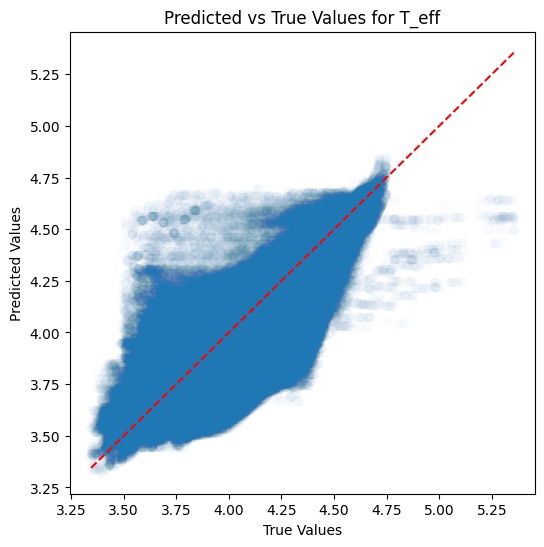

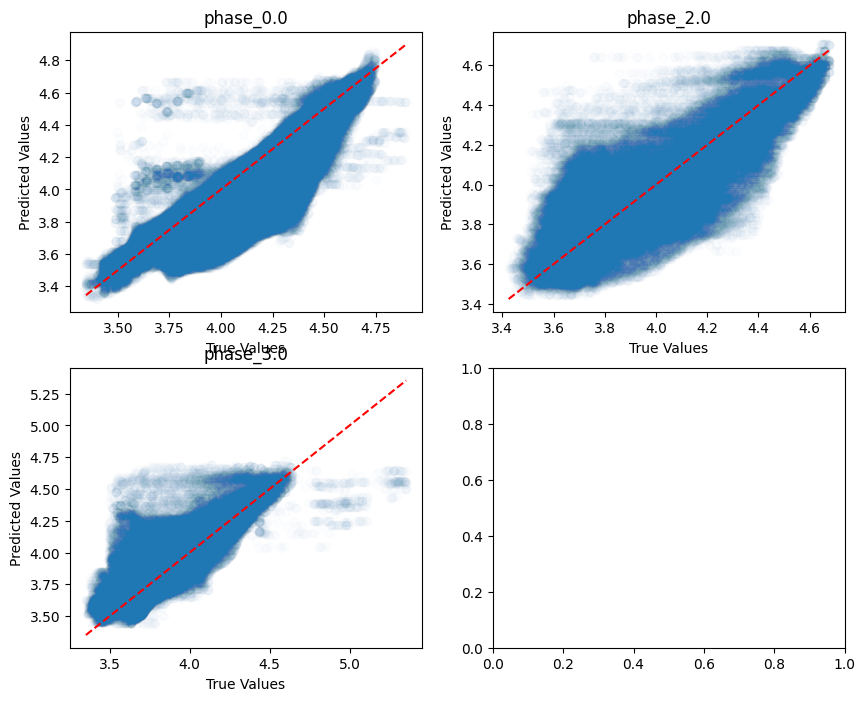

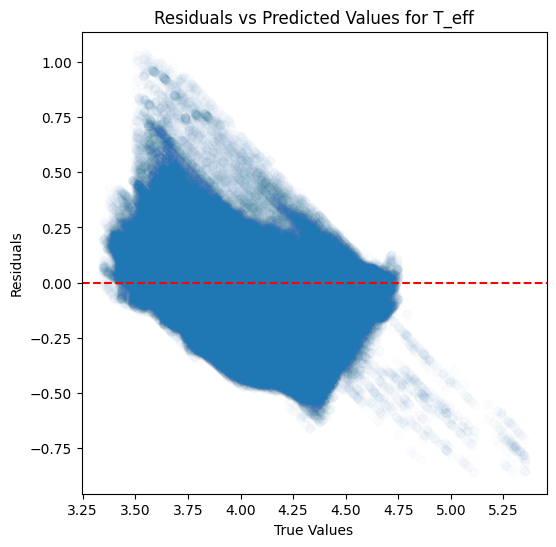

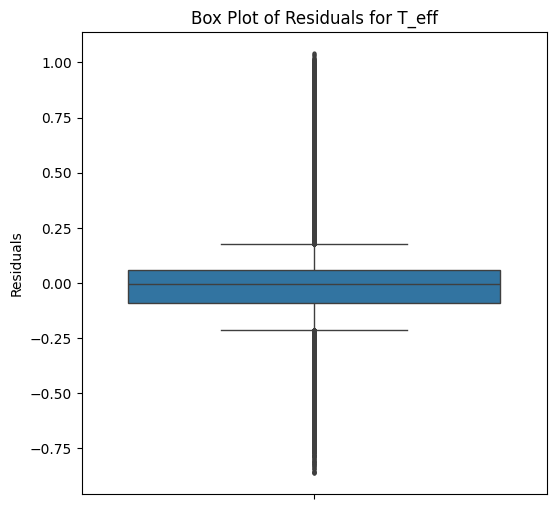

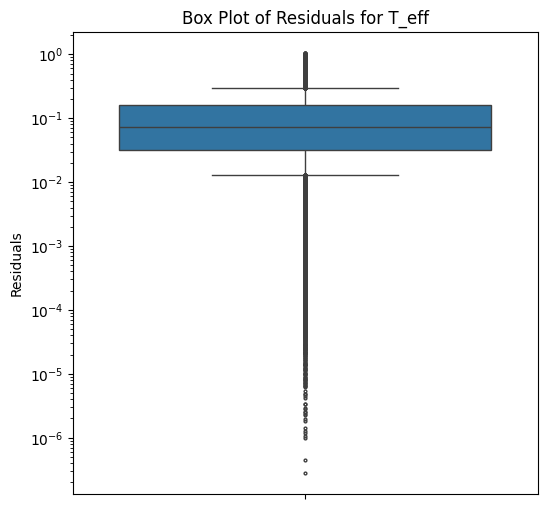

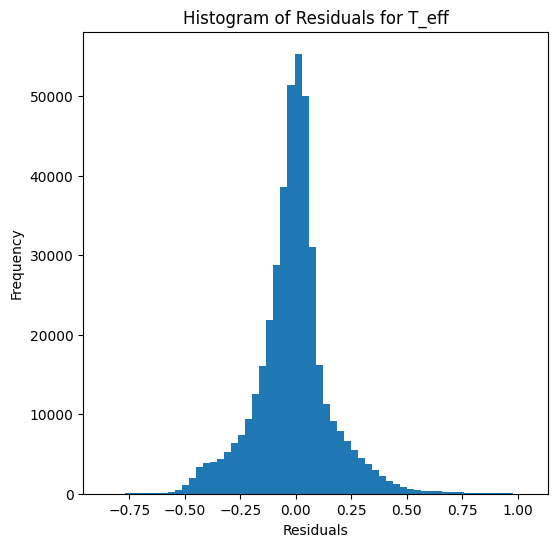

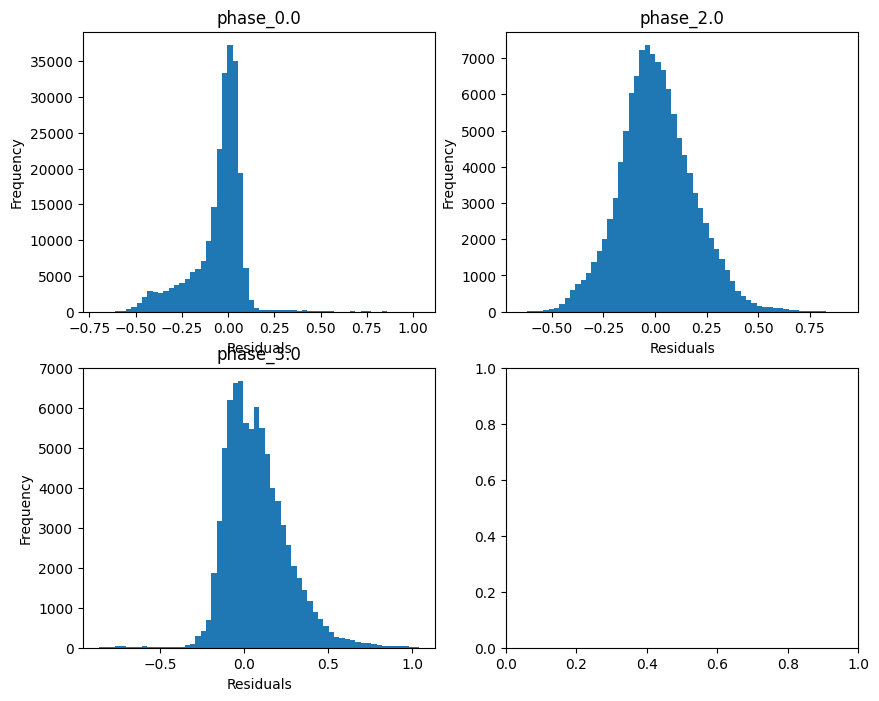

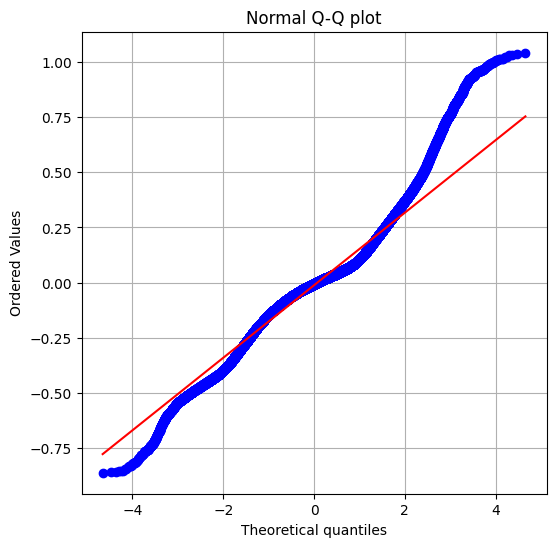

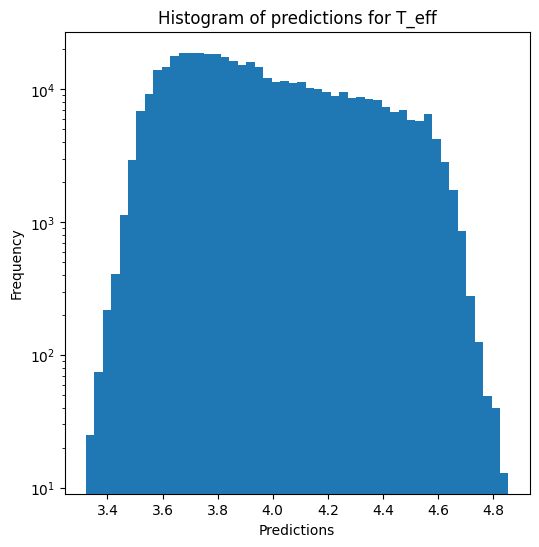

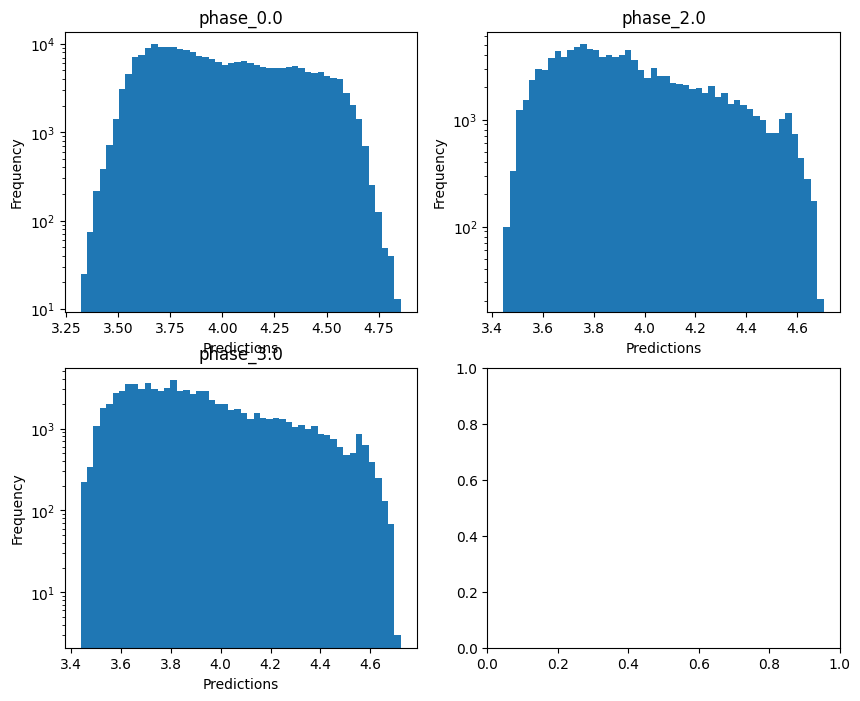

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433070637654307
  RVE :  -0.6183924085775647
  RMSE :  0.8259692765538914
  MAE :  0.47169306908008934
  MedAE :  0.11519046002901545
  CORR :  0.6581716551440178
  MAX_ER :  4.62988413154355
  Percentiles : 
    75th percentile :  0.6266016266792456
    90th percentile :  1.6730948824677117
    95th percentile :  2.056571983455922
    99th percentile :  2.43344218050808

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  -0.4449444547364432
  RMSE :  1.1177805133815333
  MAE :  0.8859900346711587
  MedAE :  0.736614230978192
  CORR :  0.28535473759631075
  MAX_ER :  4.405123063060759
  Percentiles : 
    75th percentile :  1.26112689298854
    90th percentile :  1.7916996888179981
    95th percentile :  2.1518806196106266
    99th percentile :  3.1477480461734877

log_g results for the phase categ

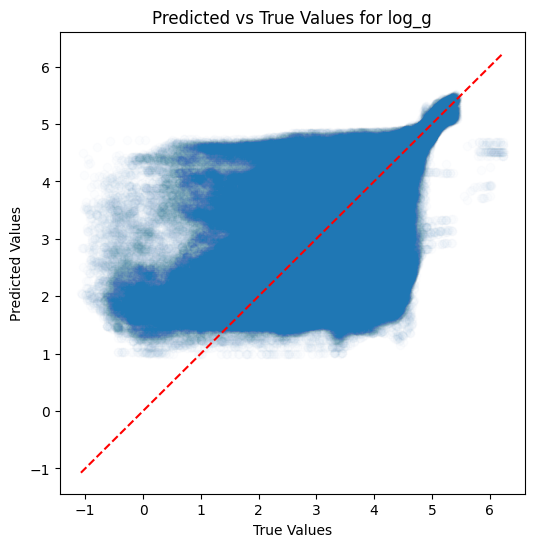

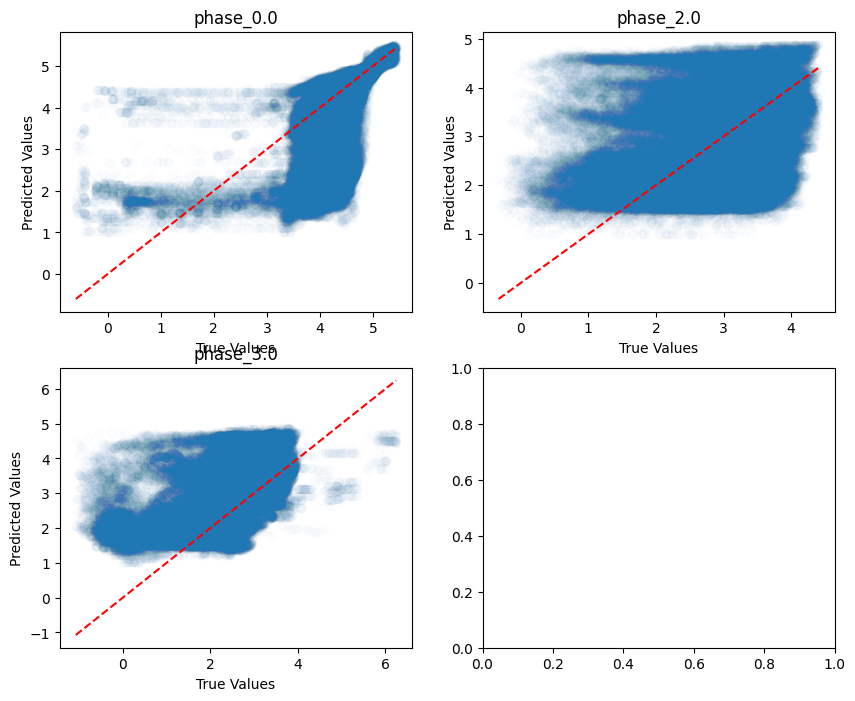

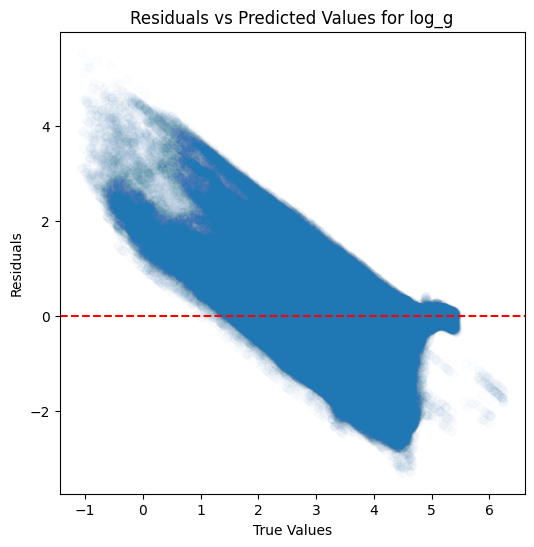

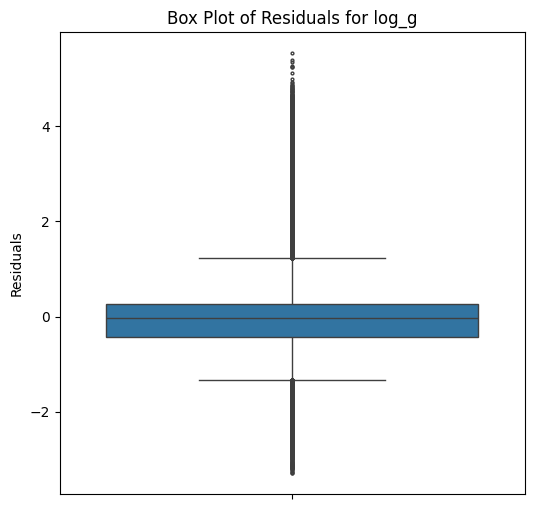

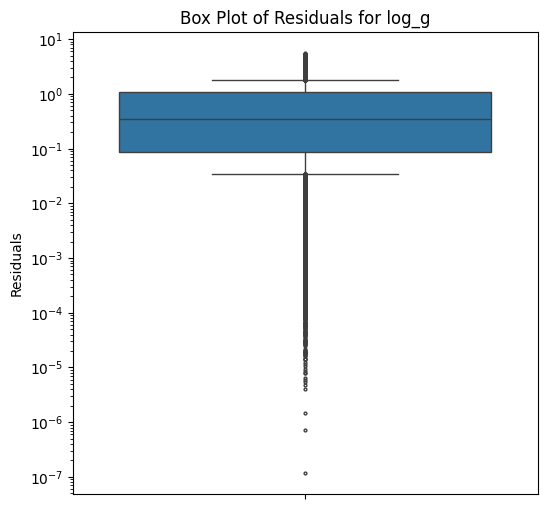

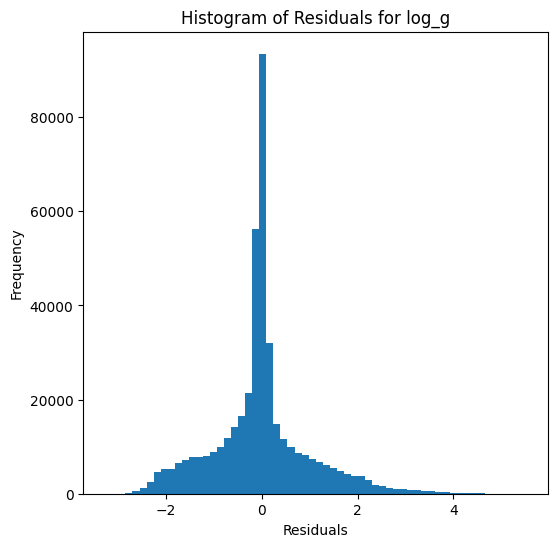

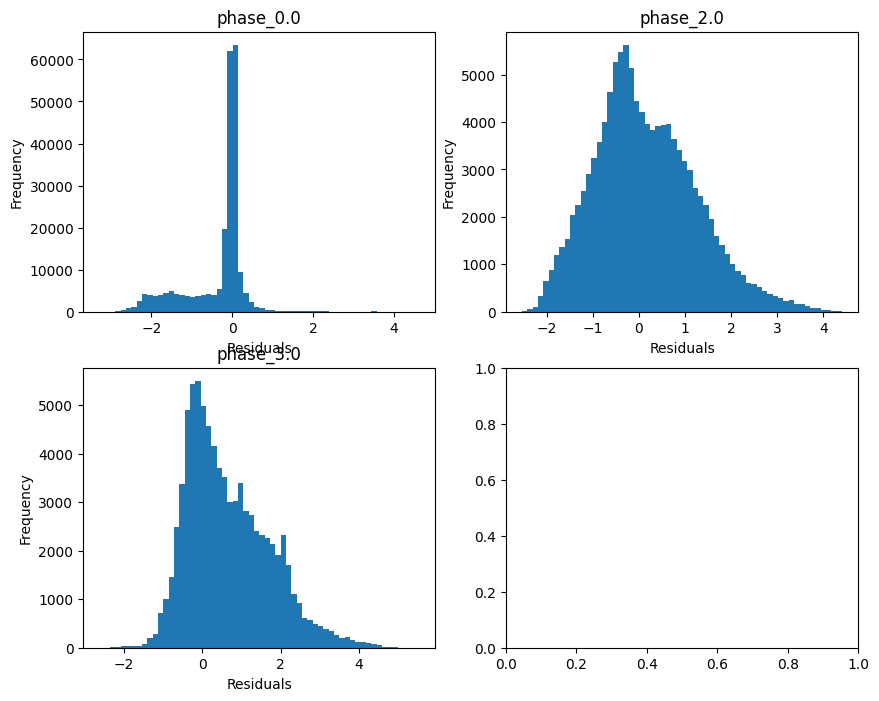

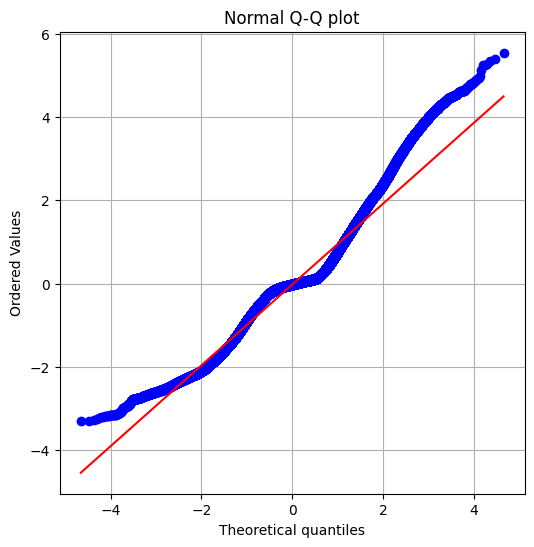

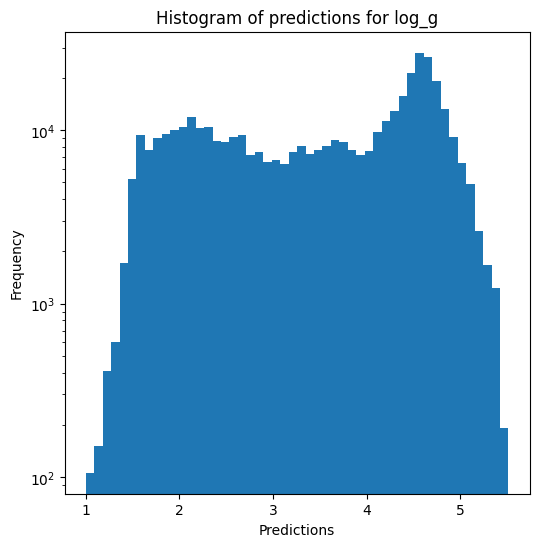

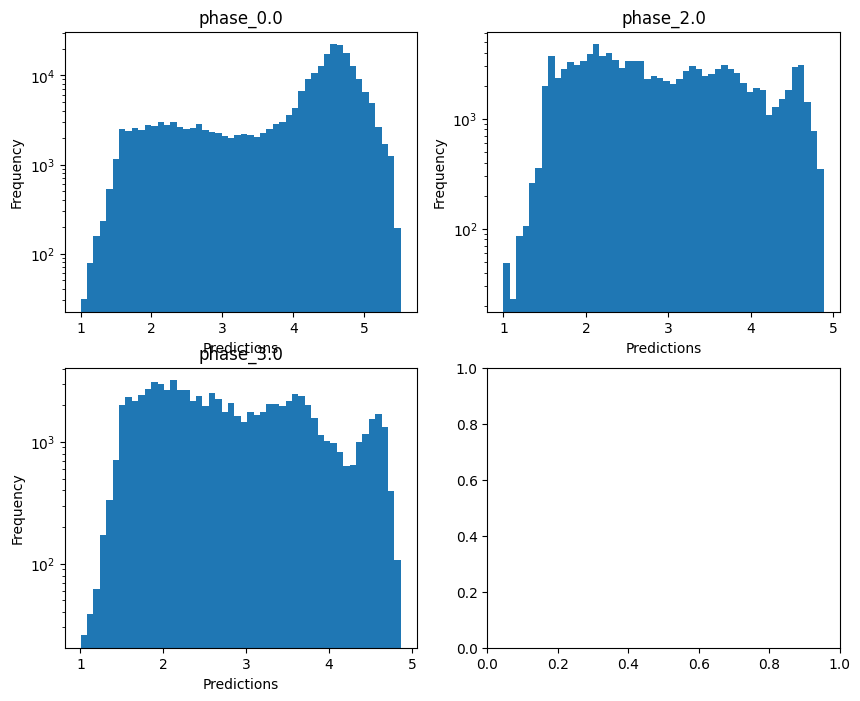


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.44506374825504247
  RMSE :  0.4150297838447343
  MAE :  0.24387386434576375
  MedAE :  0.07457173450033844
  CORR :  0.8128531007437122
  MAX_ER :  2.2765175724494653
  Percentiles : 
    75th percentile :  0.30685664446733396
    90th percentile :  0.8457300637443772
    95th percentile :  1.0296183553778764
    99th percentile :  1.2163358906116297

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  -0.4927047177897663
  RMSE :  0.560778751955247
  MAE :  0.44390979822088733
  MedAE :  0.37011464095935054
  CORR :  0.32496572505198623
  MAX_ER :  2.2059939368183787
  Percentiles : 
    75th percentile :  0.6333819018235678
    90th percentile :  0.8996042758165173
    95th percentile :  1.0842893052366391
    99th percentile :  1.577227573386636

radius results for the phase category wit

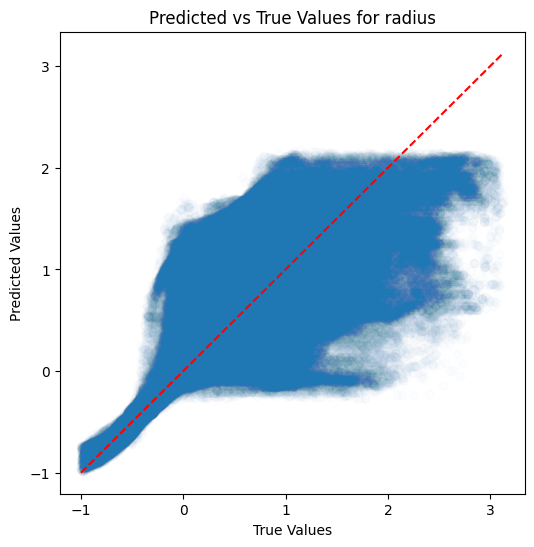

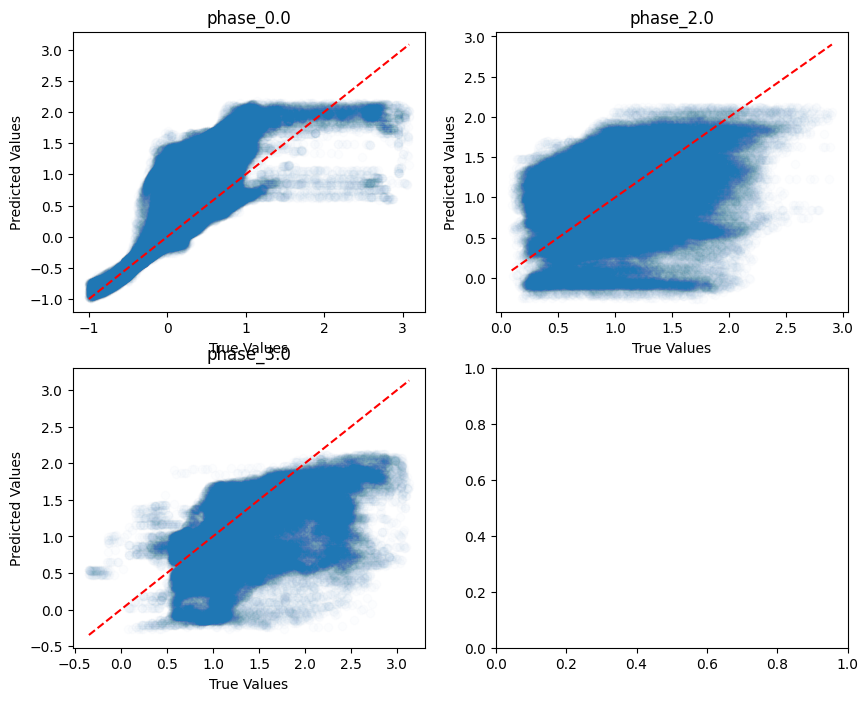

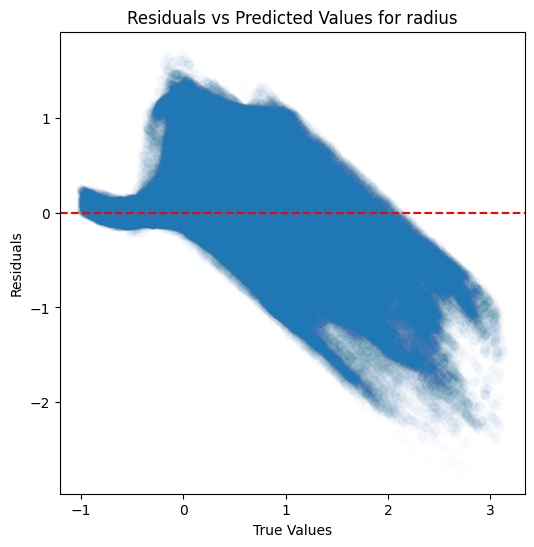

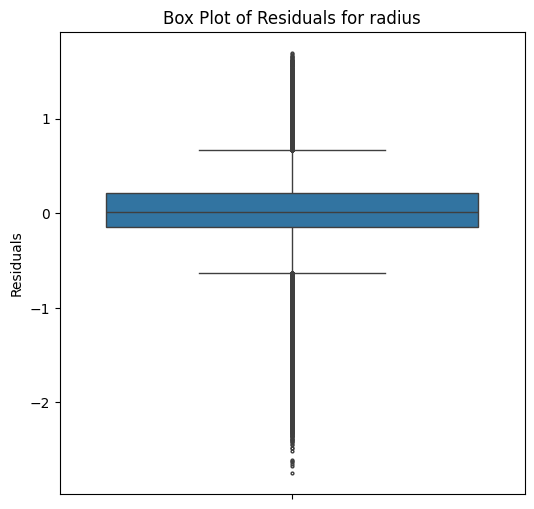

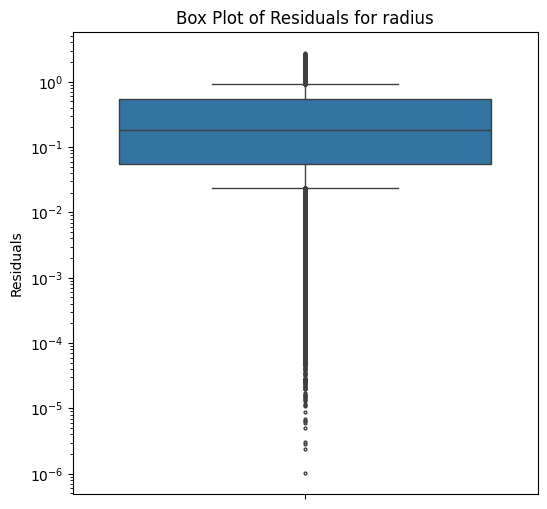

...

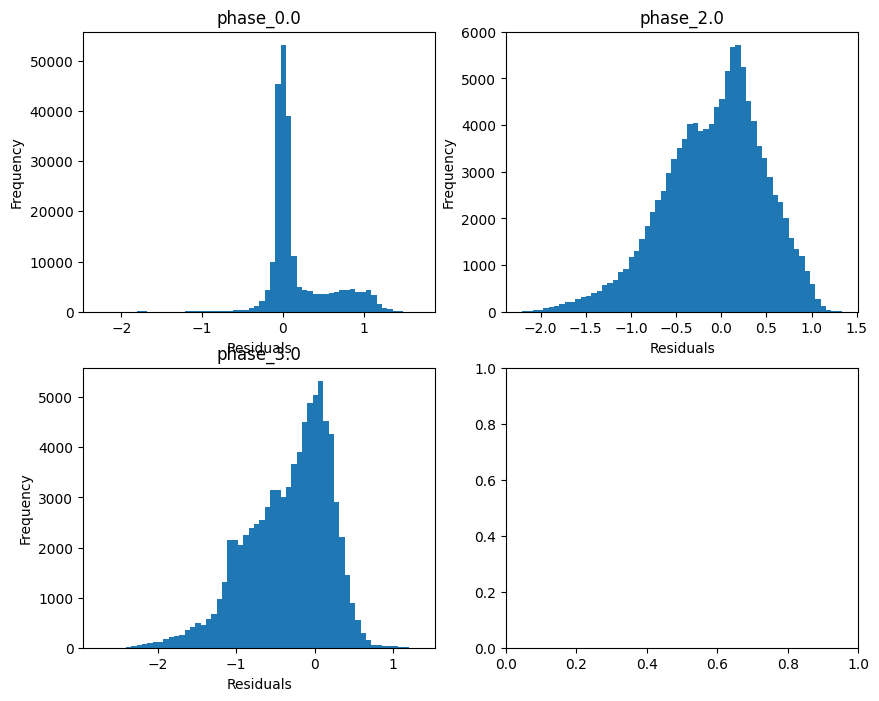

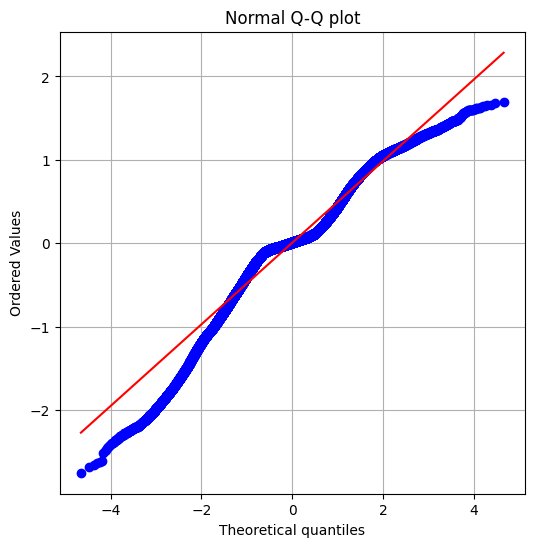

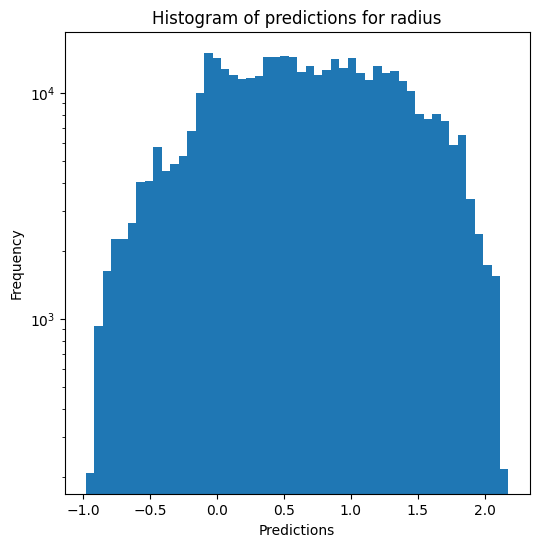

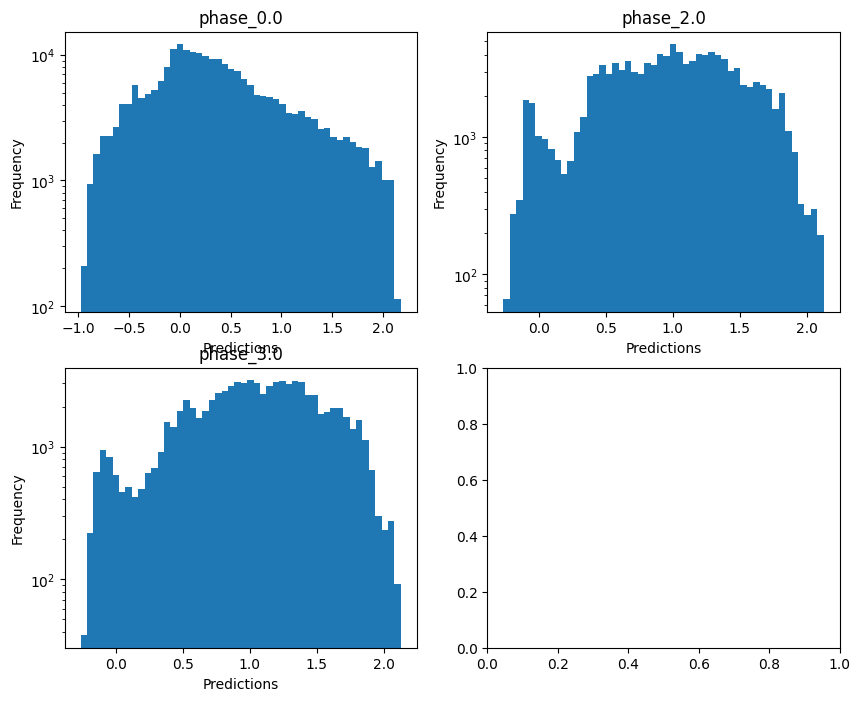

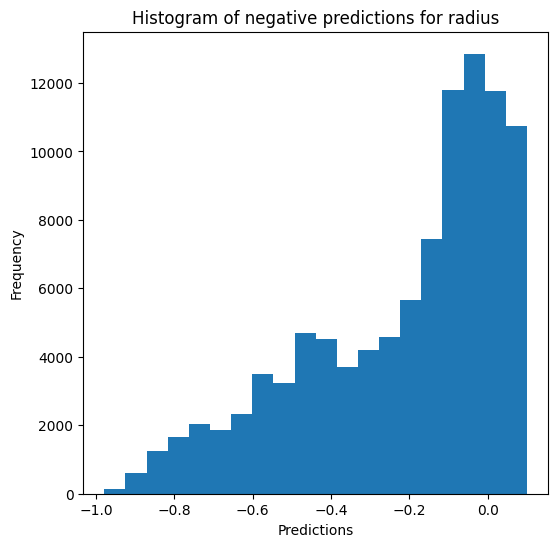

Saving results...


In [24]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, 
                                     hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)